<a href="https://colab.research.google.com/github/machiwao/CCADMACL_PROJECT_COM222/blob/judiciary/CCADMACL_Project_Implementation_extracted_outliers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multidimensinal Poverty Measures
Dataset Reference: https://www.kaggle.com/datasets/grosvenpaul/family-income-and-expenditure/data

Main Research Idea: How do income and expenditure patterns among Filipino households reflect socioeconomic disparities, and what insights can inform targeted financial and policy interventions?

Specific Research Questions:
1. What are the distinguishing characteristics of each cluster in terms of spending habits:
    - Family Composition
    - Household Head Characteristics
    - Income Sources
    - Expenditure Priorities (essential and non-essential spending)
    - Savings and Debt Behavior
2. How do income levels influence spending habits across different household clusters?
3. How can financial interventions (e.g., subsidies, tax incentives, financial education) be tailored to different household clusters?


In [242]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.cm as cm

from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler, normalize, PowerTransformer
from collections import Counter
from sklearn.ensemble import IsolationForest
from sklearn.linear_model import Ridge
from sklearn.feature_selection import RFECV, mutual_info_regression, SelectKBest, f_regression
from sklearn.model_selection import KFold
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.neighbors import NearestNeighbors


# Data Loading

In [243]:
df = pd.read_csv('https://raw.githubusercontent.com/machiwao/CCADMACL_PROJECT_COM222/refs/heads/main/Family%20Income%20and%20Expenditure.csv')
df.head()

,Total Household Income,Region,Total Food Expenditure,Main Source of Income,Agricultural Household indicator,Bread and Cereals Expenditure,Total Rice Expenditure,Meat Expenditure,Total Fish and marine products Expenditure,Fruit Expenditure,...,Number of Refrigerator/Freezer,Number of Washing Machine,Number of Airconditioner,"Number of Car, Jeep, Van",Number of Landline/wireless telephones,Number of Cellular phone,Number of Personal Computer,Number of Stove with Oven/Gas Range,Number of Motorized Banca,Number of Motorcycle/Tricycle
0,480332,CAR,117848,Wage/Salaries,0,42140,38300,24676,16806,3325,...,1,1,0,0,0,2,1,0,0,1
1,198235,CAR,67766,Wage/Salaries,0,17329,13008,17434,11073,2035,...,0,1,0,0,0,3,1,0,0,2
2,82785,CAR,61609,Wage/Salaries,1,34182,32001,7783,2590,1730,...,0,0,0,0,0,0,0,0,0,0
3,107589,CAR,78189,Wage/Salaries,0,34030,28659,10914,10812,690,...,0,0,0,0,0,1,0,0,0,0
4,189322,CAR,94625,Wage/Salaries,0,34820,30167,18391,11309,1395,...,1,0,0,0,0,3,0,0,0,1


In [244]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 60 columns):
 #   Column                                         Non-Null Count  Dtype 
---  ------                                         --------------  ----- 
 0   Total Household Income                         41544 non-null  int64 
 1   Region                                         41544 non-null  object
 2   Total Food Expenditure                         41544 non-null  int64 
 3   Main Source of Income                          41544 non-null  object
 4   Agricultural Household indicator               41544 non-null  int64 
 5   Bread and Cereals Expenditure                  41544 non-null  int64 
 6   Total Rice Expenditure                         41544 non-null  int64 
 7   Meat Expenditure                               41544 non-null  int64 
 8   Total Fish and  marine products Expenditure    41544 non-null  int64 
 9   Fruit Expenditure                              41544 non-null

In [245]:
# Return array of columns of df
df.columns

Index(['Total Household Income', 'Region', 'Total Food Expenditure',
       'Main Source of Income', 'Agricultural Household indicator',
       'Bread and Cereals Expenditure', 'Total Rice Expenditure',
       'Meat Expenditure', 'Total Fish and  marine products Expenditure',
       'Fruit Expenditure', 'Vegetables Expenditure',
       'Restaurant and hotels Expenditure', 'Alcoholic Beverages Expenditure',
       'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Imputed House Rental Value',
       'Medical Care Expenditure', 'Transportation Expenditure',
       'Communication Expenditure', 'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure', 'Crop Farming and Gardening expenses',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Sex',
       'Household Head Age', 'Household Head Marital Status',
       'Household Head Highest Grade Compl

In [246]:
df.isna().sum()

,0
Total Household Income,0
Region,0
Total Food Expenditure,0
Main Source of Income,0
Agricultural Household indicator,0
Bread and Cereals Expenditure,0
Total Rice Expenditure,0
Meat Expenditure,0
Total Fish and marine products Expenditure,0
Fruit Expenditure,0


In [247]:
df.duplicated().sum()

0

# Exploratory Data Analysis

In [248]:
df['Region'].value_counts()

,count
Region,
IVA - CALABARZON,4162
NCR,4130
III - Central Luzon,3237
VI - Western Visayas,2851
VII - Central Visayas,2541
V - Bicol Region,2472
XI - Davao Region,2446
I - Ilocos Region,2348
VIII - Eastern Visayas,2337


In [249]:
# Extract Numerical and Categorical Columns
numerical_columns = df.select_dtypes(include=[np.number]).columns
categorical_columns = df.select_dtypes(include=['object']).columns

expenditure_columns = df.filter(like='Expenditure').columns
income_columns = df.filter(like='Income').columns

In [250]:
# Remove Agricultural Household indicator from numerical_columns
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Agricultural Household indicator'))

In [251]:
# Include Crop Farming and Gardening expenses in expenditure_columns
expenditure_columns = np.append(expenditure_columns, 'Crop Farming and Gardening expenses')
expenditure_columns = np.append(expenditure_columns, 'Imputed House Rental Value')

In [252]:
# Remove 'Main Source of Income' from income_columns
income_columns = np.delete(income_columns, np.where(income_columns == 'Main Source of Income'))

In [253]:
# Count number of columns for both numerical and categorical
num_cols = len(numerical_columns)
cat_cols = len(categorical_columns)

print(f"Number of numerical columns: {num_cols}")
print(f"Number of categorical columns: {cat_cols}")

Number of numerical columns: 44
Number of categorical columns: 15


In [254]:
# Count Expenditure Columns and Income Columns
exp_cols = len(expenditure_columns)
inc_cols = len(income_columns)

print(f"Number of expenditure columns: {exp_cols}")
print(f"Number of income columns: {inc_cols}")

Number of expenditure columns: 20
Number of income columns: 2


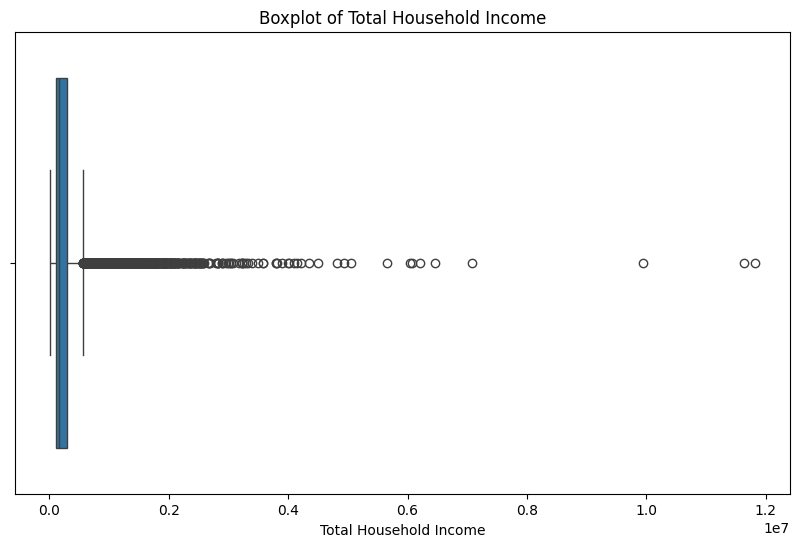

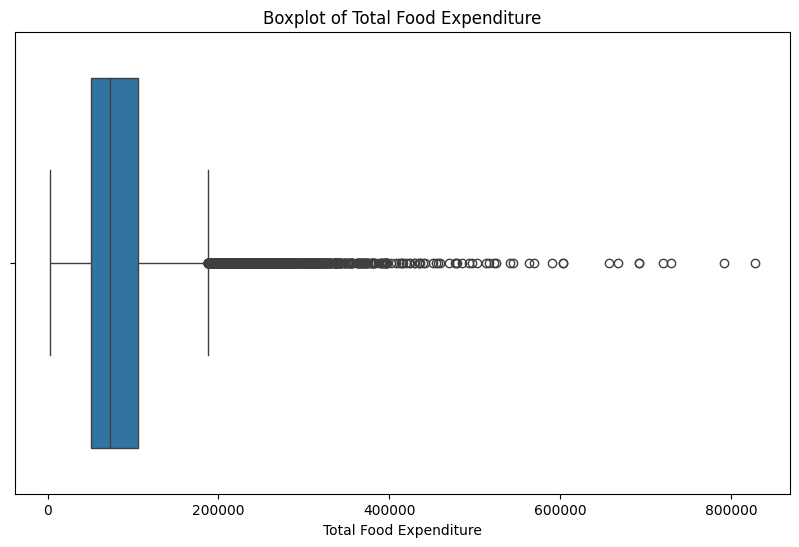

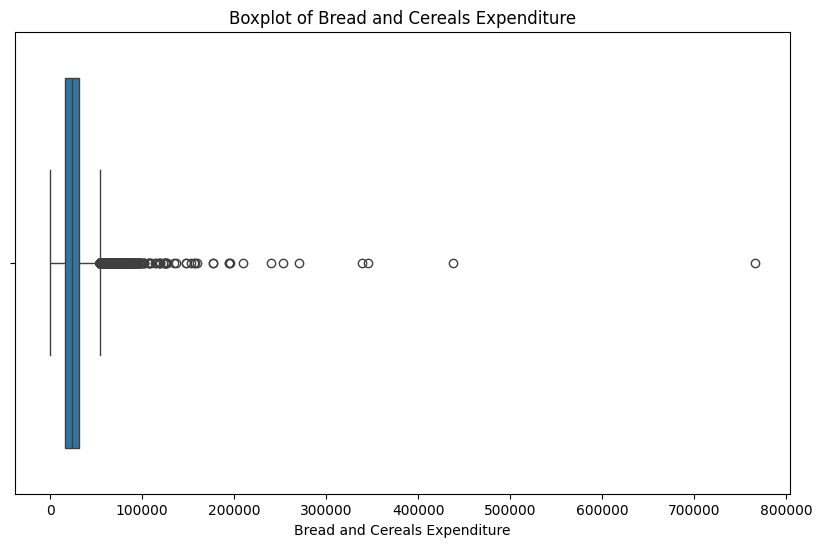

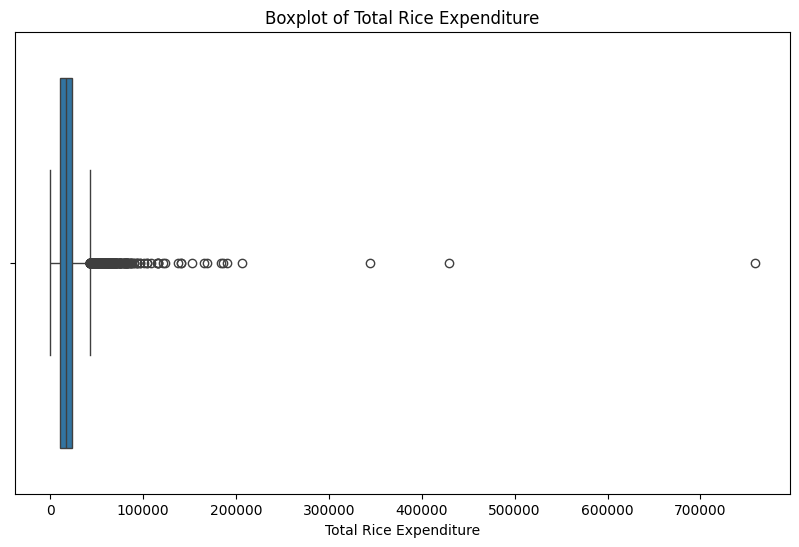

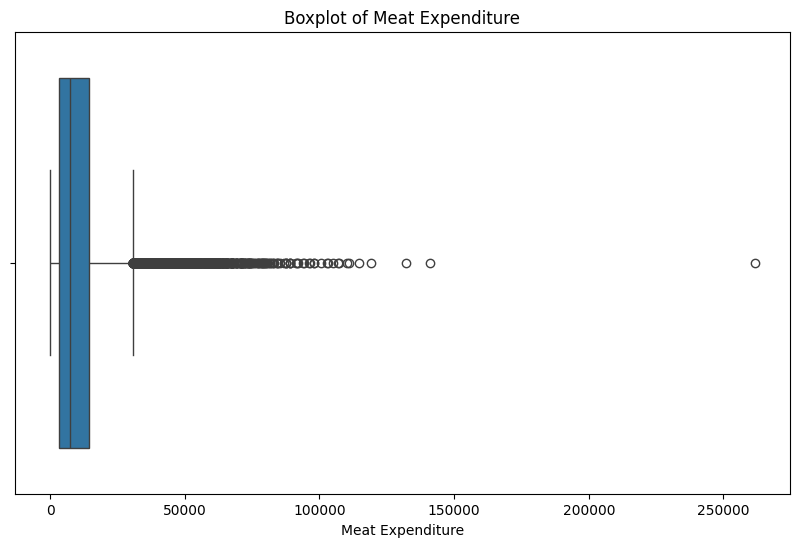

...

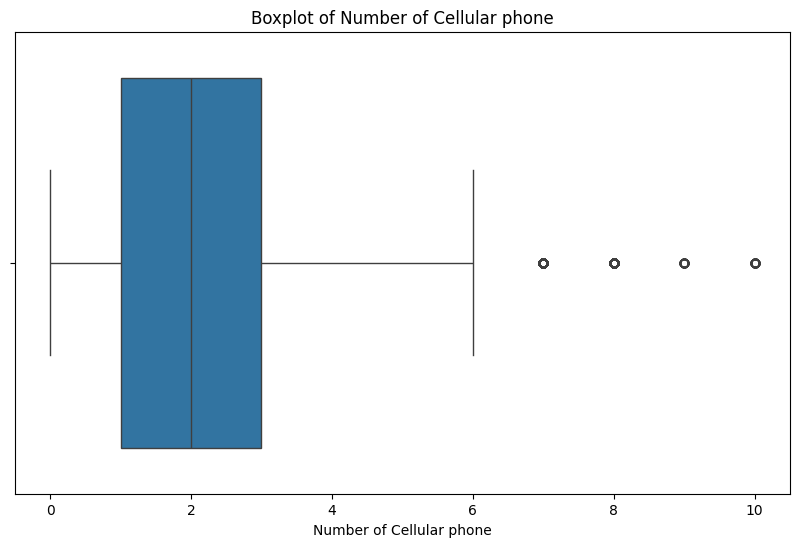

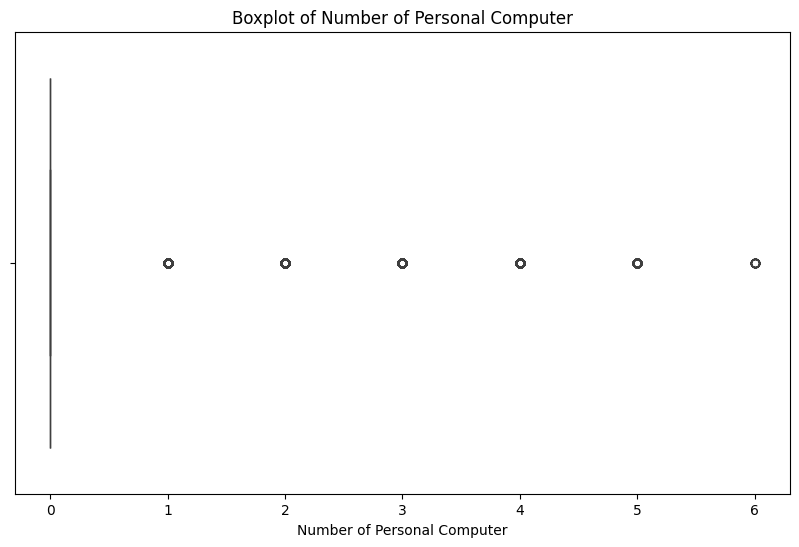

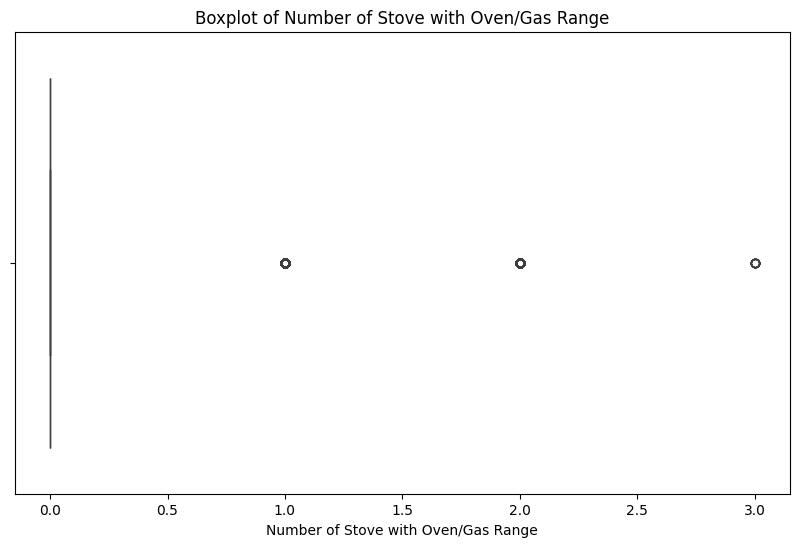

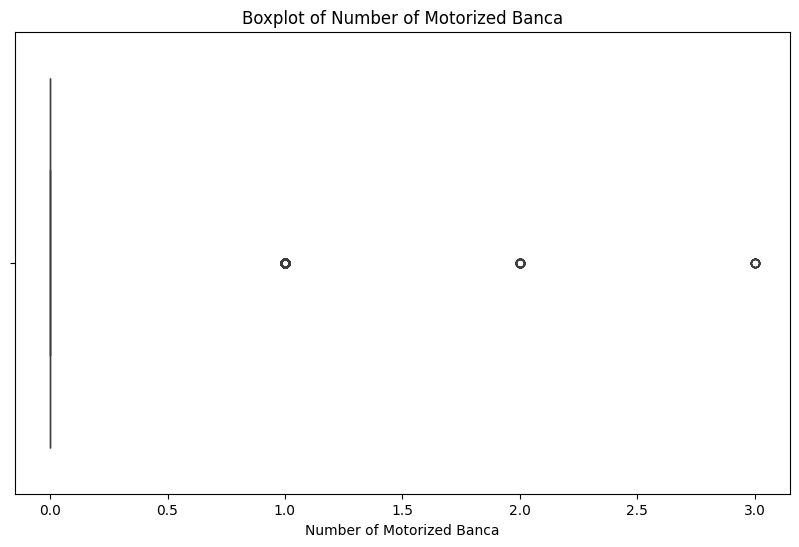

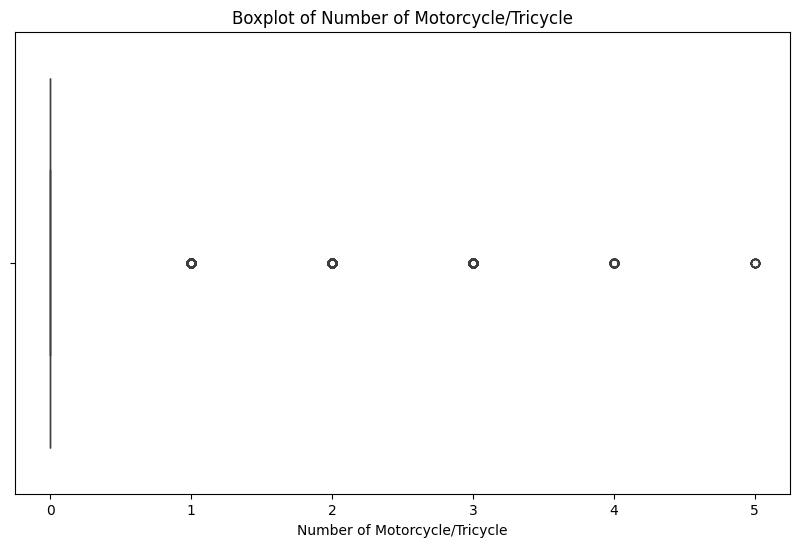

In [255]:
# Boxplot for Numerical Columns
for col in numerical_columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df, x=col)
    plt.title(f'Boxplot of {col}')
    plt.show()

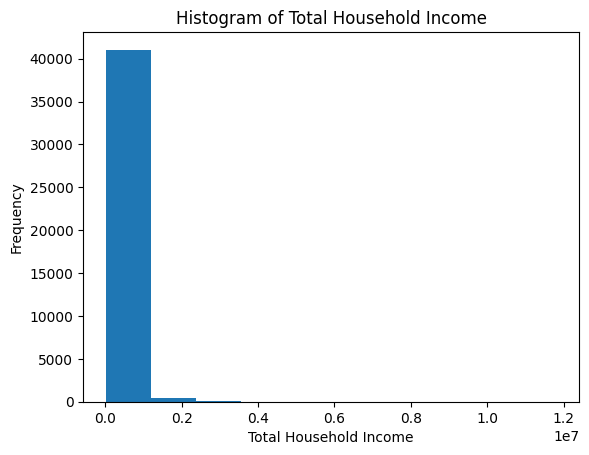

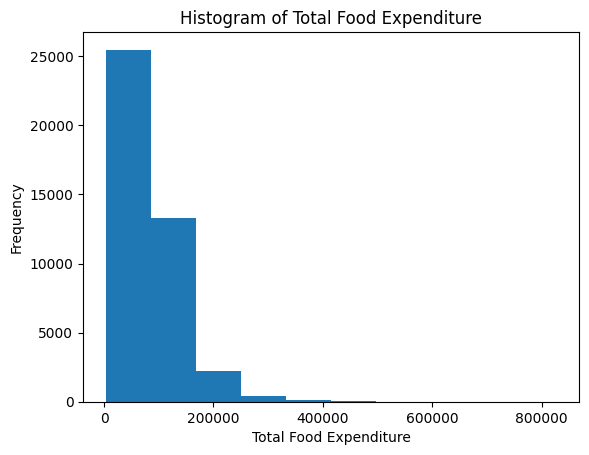

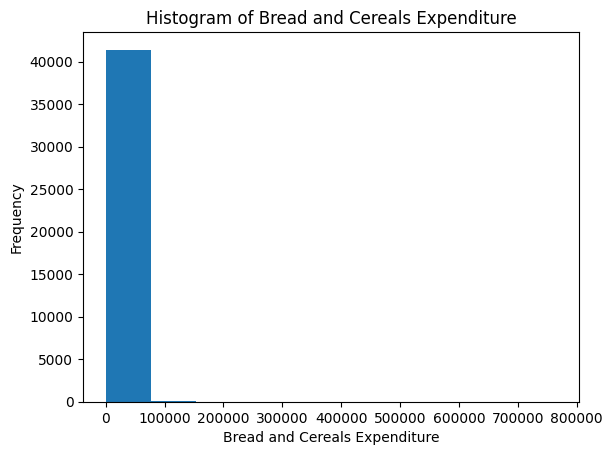

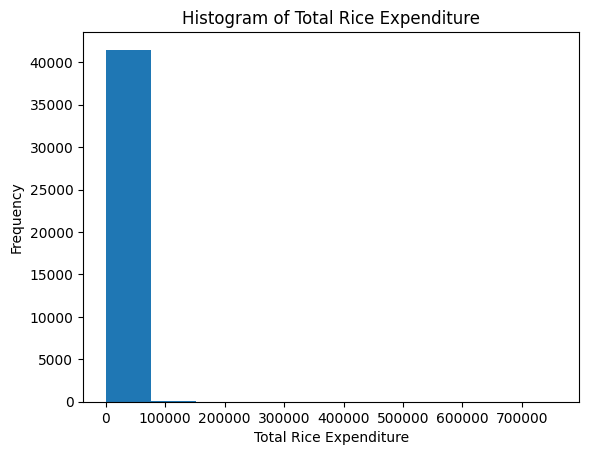

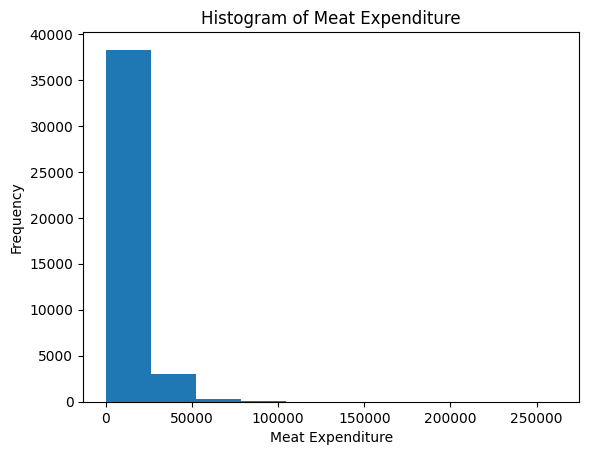

...

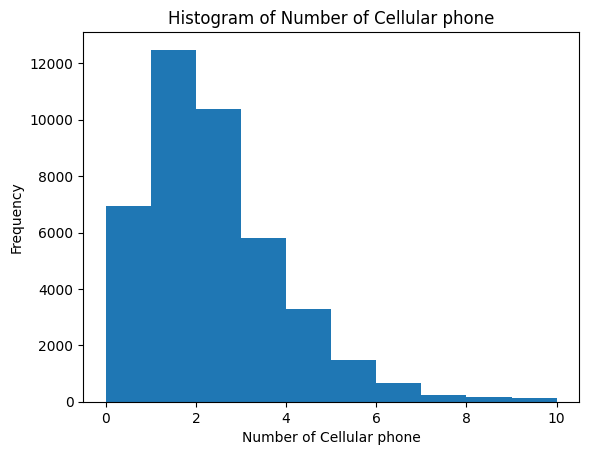

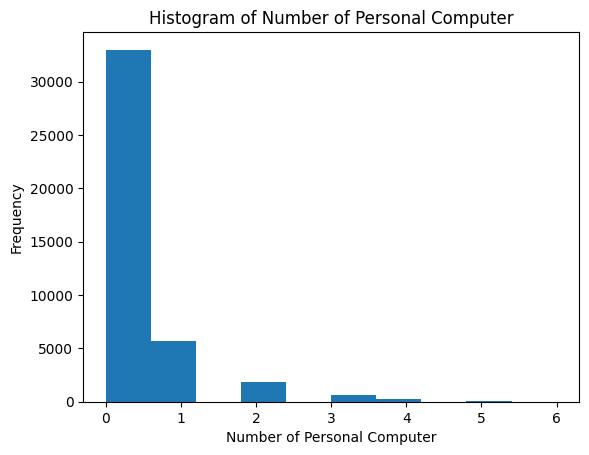

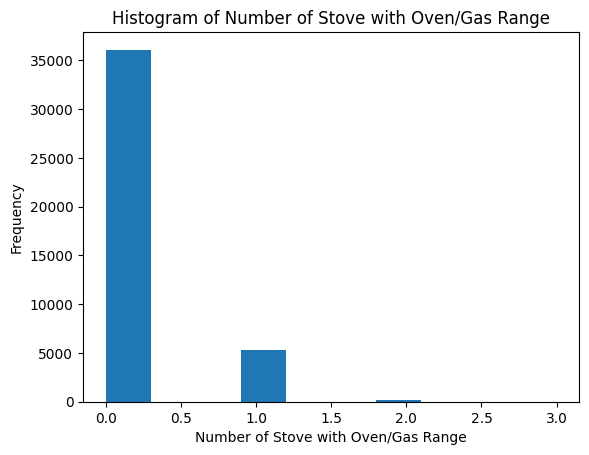

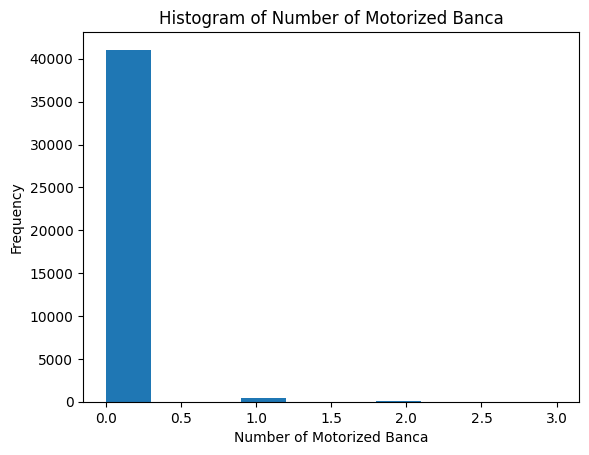

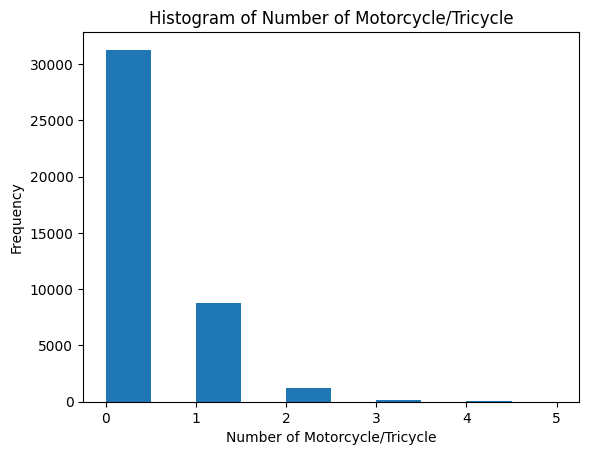

In [256]:
# Histogram for all Numerical Columns, individually
for col in numerical_columns:
    plt.hist(df[col])
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [257]:
# Average Total Household Income per Region
average_income_per_region = df.groupby('Region')['Total Household Income'].mean().sort_values(ascending=False)
average_income_per_region

,Total Household Income
Region,
NCR,420861.861501
IVA - CALABARZON,303360.536040
III - Central Luzon,292965.181650
CAR,269540.484638
XI - Davao Region,238115.891251
I - Ilocos Region,238110.084327
II - Cagayan Valley,236778.221721
VII - Central Visayas,234909.314050
VI - Western Visayas,220481.260260


> Key Insights from numerical columns
- Too many outliers for all numerical values due to extreme household income values
- Zero values and positive skew for all numerical values
- The Greater Manila Area (NCR and neighboring provinces) have the most share of the income across the Philippines.
- Average Total Household Income comes around 250K
- Transformation and Outlier Detection is vital to cap extreme values and normalize the distribution


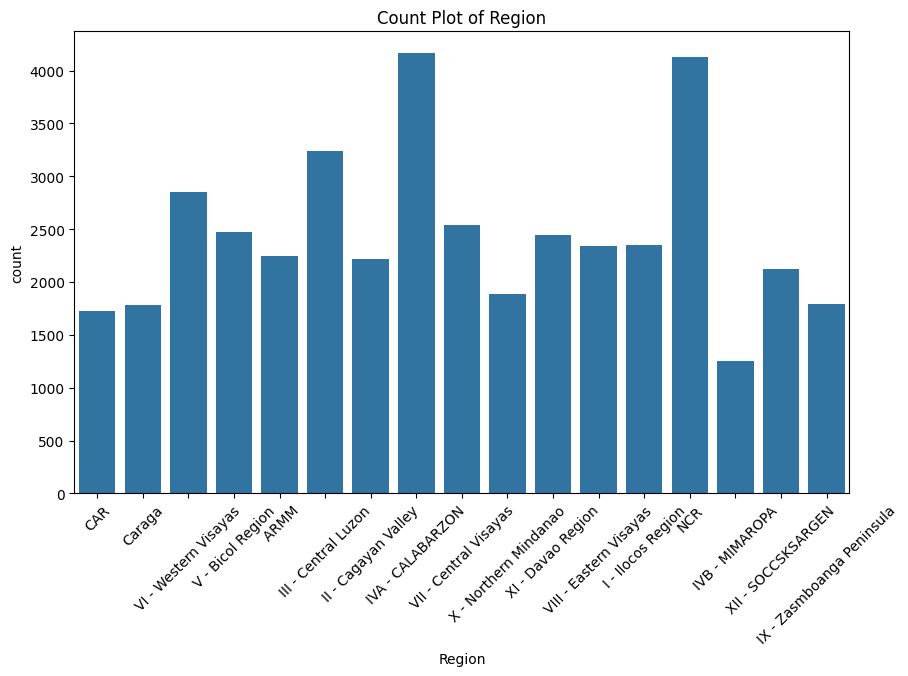

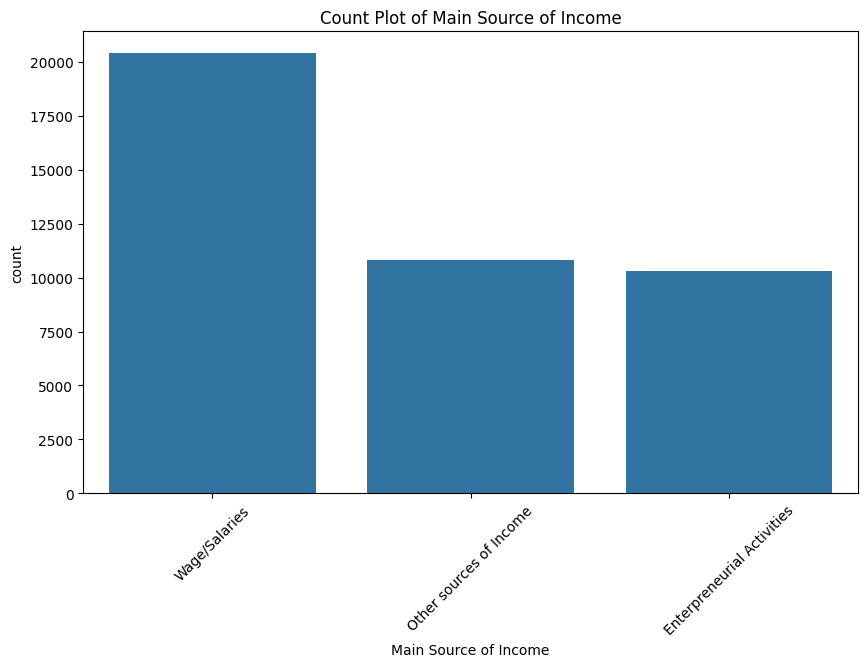

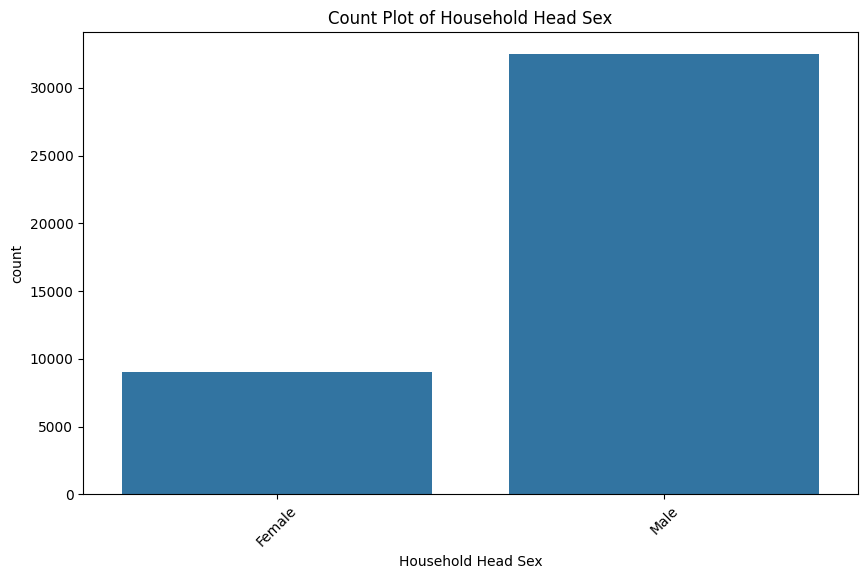

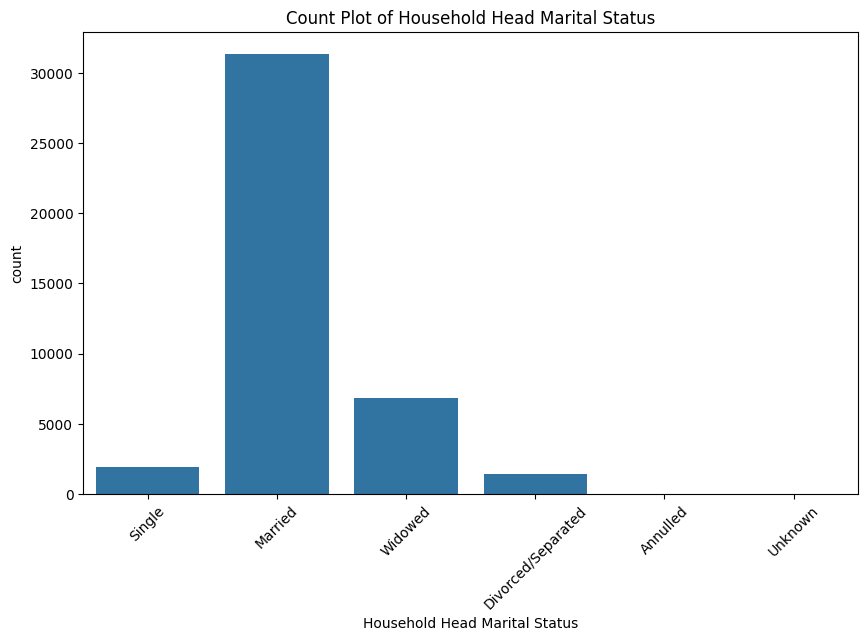

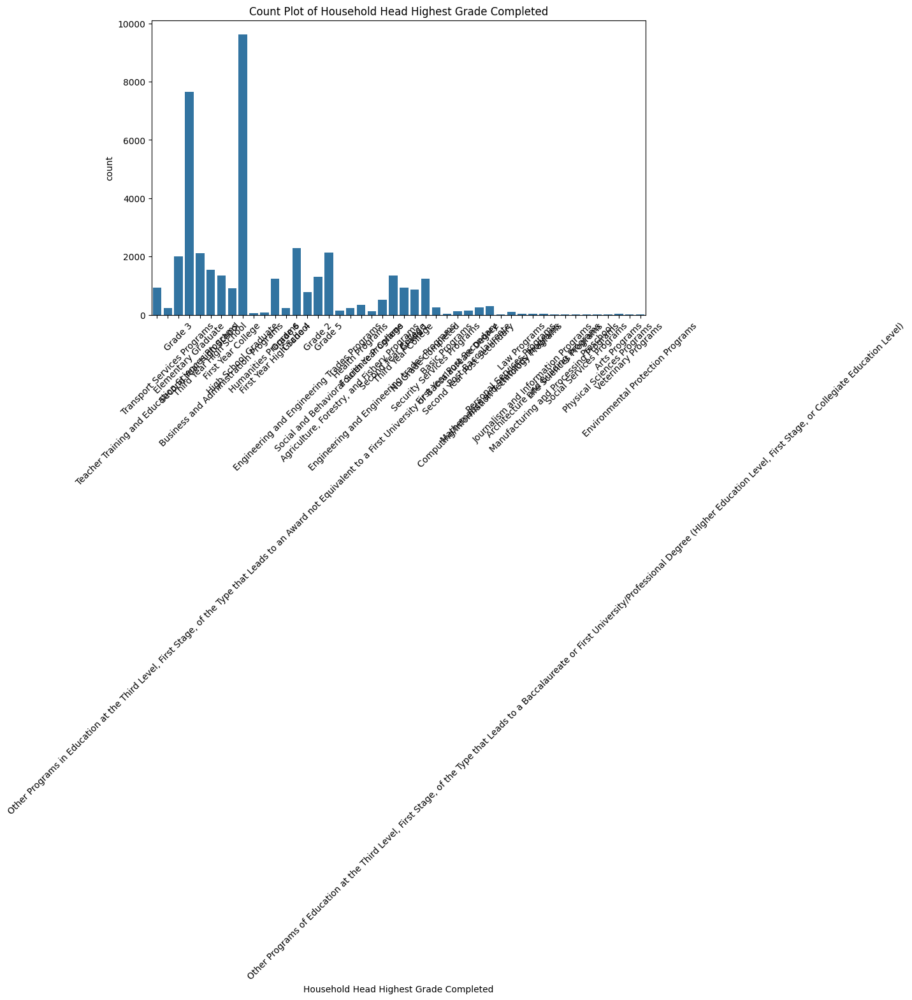

...

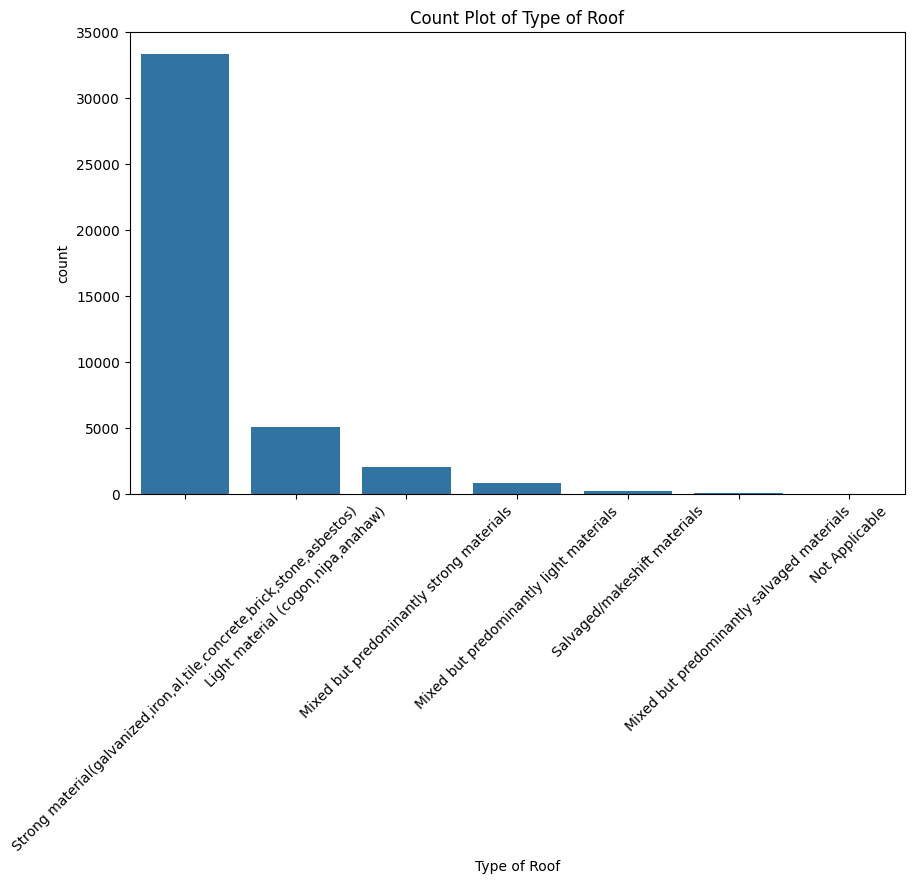

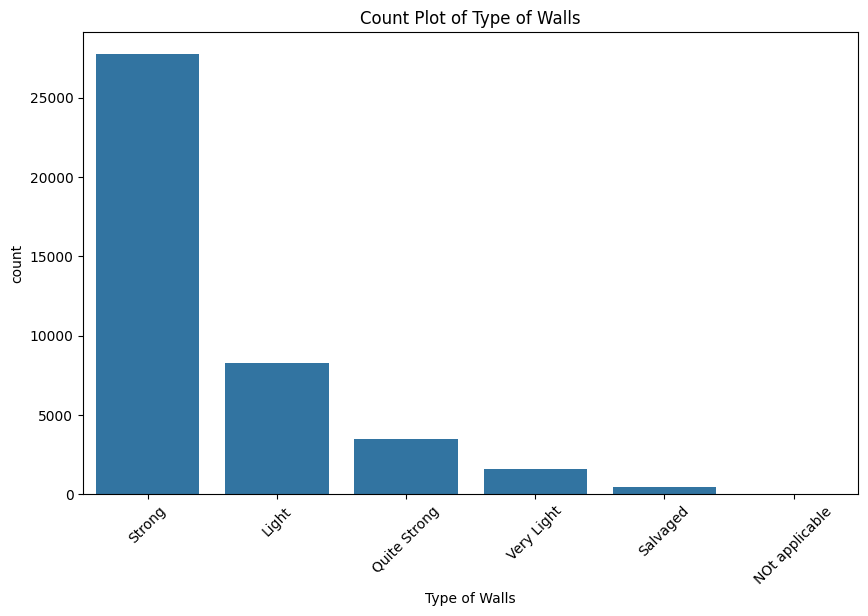

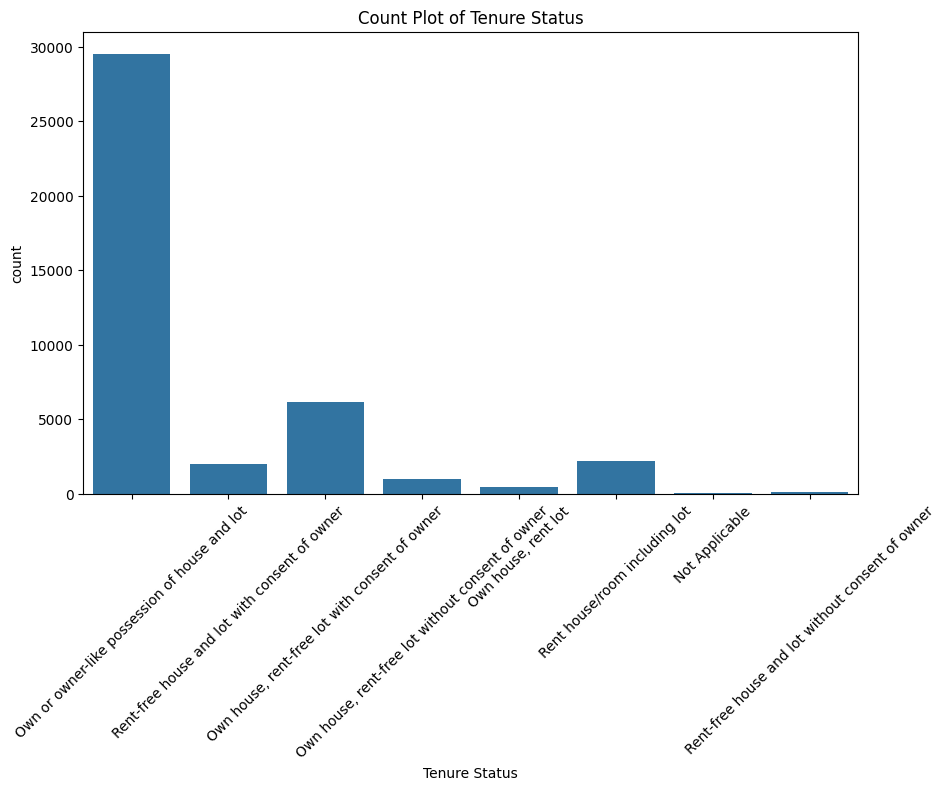

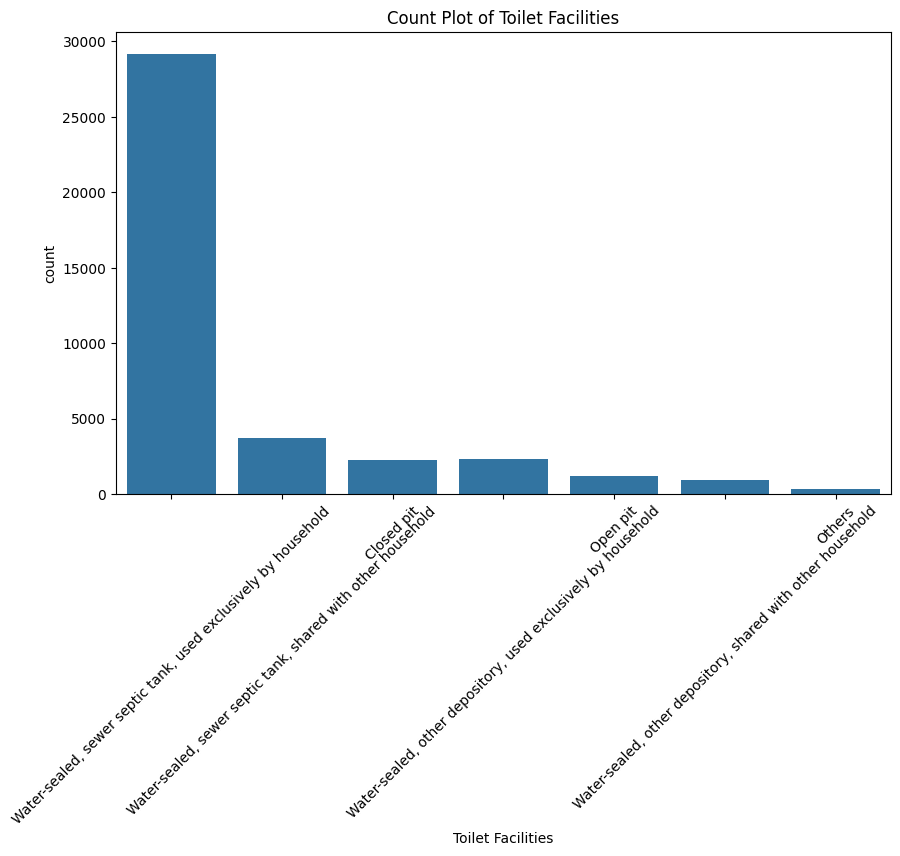

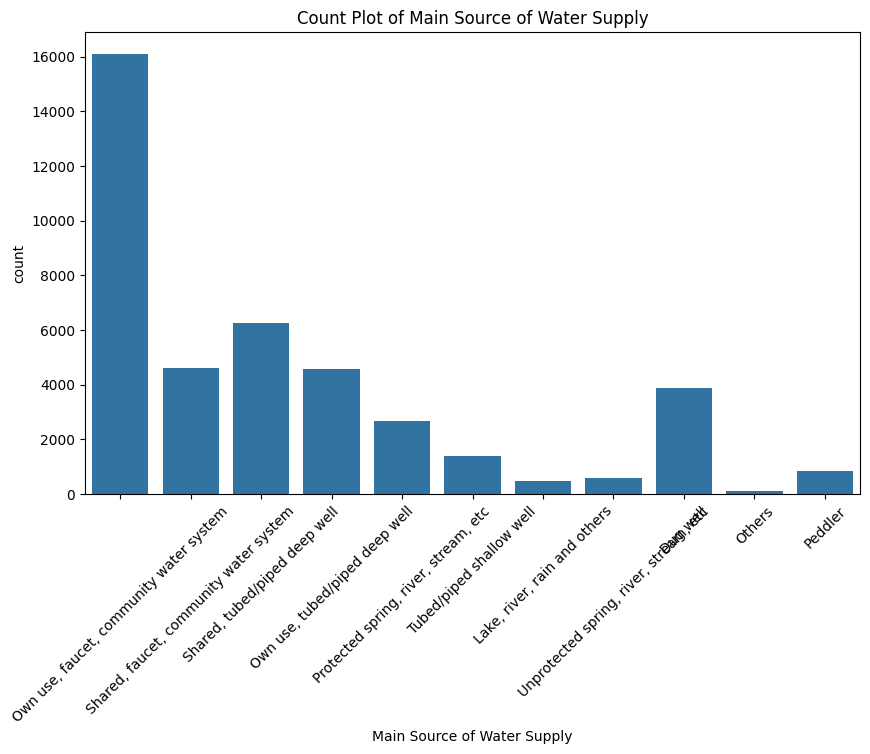

In [258]:
# Plot categorical columns. Tilt x values
for col in categorical_columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col)
    plt.xticks(rotation=45)
    plt.title(f'Count Plot of {col}')

In [259]:
# Unique Values of Null Columns : Household Head Occupation, Household Head Class of Worker, Toilet Facilities
null_columns = df.columns[df.isna().any()]
null_columns

Index(['Household Head Occupation', 'Household Head Class of Worker',
       'Toilet Facilities'],
      dtype='object')

In [260]:
# Print unique values for each null column
for column in null_columns:
    unique_values = df[column].unique()
    print(f"Unique values for {column}: {unique_values}")

Unique values for Household Head Occupation: ['General elementary education teaching professionals'
 'Transport conductors' 'Farmhands and laborers' 'Rice farmers'
 'General managers/managing proprietors in transportation, storage and communications'
 'Heavy truck and lorry drivers' nan 'Hog raising farmers'
 'Vegetable farmers'
 'General managers/managing proprietors in wholesale and retail trade'
 'Stocks clerks' 'Justices' 'Other social science professionals'
 'Protective services workers n. e. c.' 'Secretaries'
 'Electronics mechanics and servicers' 'Foresters and related scientists'
 'Shop salespersons and demonstrators'
 'College, university and higher education teaching professionals'
 'General managers/managing proprietors of restaurants and hotels'
 'Welders and flamecutters' 'Car, taxi and van drivers'
 'Motor vehicle mechanics and related trades workers'
 'Traditional chiefs and heads of villages' 'Motorcycle drivers'
 'Statistical, mathematical and related associate profess

In [261]:
df['Household Head Occupation'].value_counts()

,count
Household Head Occupation,
Farmhands and laborers,3478
Rice farmers,2849
General managers/managing proprietors in wholesale and retail trade,2028
"General managers/managing proprietors in transportation, storage and communications",1932
Corn farmers,1724
...,...
Petroleum and natural gas refining plant operators,1
Builders (traditional materials),1
"Personal care and related workers, n. e. c.",1


In [262]:
df['Household Head Highest Grade Completed'].value_counts()

,count
Household Head Highest Grade Completed,
High School Graduate,9628
Elementary Graduate,7640
Grade 4,2282
Grade 5,2123
Second Year High School,2104
Grade 3,1994
Third Year High School,1545
Business and Administration Programs,1344
Second Year College,1343


In [263]:
df['Household Head Class of Worker'].value_counts()

,count
Household Head Class of Worker,
Self-employed wihout any employee,13766
Worked for private establishment,13731
Worked for government/government corporation,2820
Employer in own family-operated farm or business,2581
Worked for private household,811
Worked without pay in own family-operated farm or business,285
Worked with pay in own family-operated farm or business,14


In [264]:
# Regions of Rows with Null Columns
df[df['Household Head Occupation'].isna()]['Region'].value_counts() # 7536 Null Values

,count
Region,
NCR,1021
IVA - CALABARZON,924
III - Central Luzon,804
I - Ilocos Region,553
VI - Western Visayas,548
VII - Central Visayas,449
V - Bicol Region,411
VIII - Eastern Visayas,370
XI - Davao Region,366


In [265]:
df[df['Household Head Class of Worker'].isna()]['Region'].value_counts() #7536 Null Values

,count
Region,
NCR,1021
IVA - CALABARZON,924
III - Central Luzon,804
I - Ilocos Region,553
VI - Western Visayas,548
VII - Central Visayas,449
V - Bicol Region,411
VIII - Eastern Visayas,370
XI - Davao Region,366


In [266]:
# Regions of Rows with Null 'Household Head Occupation' and 'Household Head Class of Worker'
df[(df['Household Head Occupation'].isna()) & (df['Household Head Class of Worker'].isna())]['Region'].value_counts() # 7536 Null Values

,count
Region,
NCR,1021
IVA - CALABARZON,924
III - Central Luzon,804
I - Ilocos Region,553
VI - Western Visayas,548
VII - Central Visayas,449
V - Bicol Region,411
VIII - Eastern Visayas,370
XI - Davao Region,366


> Key Insights from numerical columns
- Household Distribution based on Region is not well-distributed and well-represented. Omit the feature
- Occupation and Educational Attainment contains too many values for model training and may introduce noise
- Null Values (n = 7536) is too many to be dropped. Impute with "Unknown"
- Repetitive values could be further simplified in some categories (e.g. Tenure Status, Source of Water)


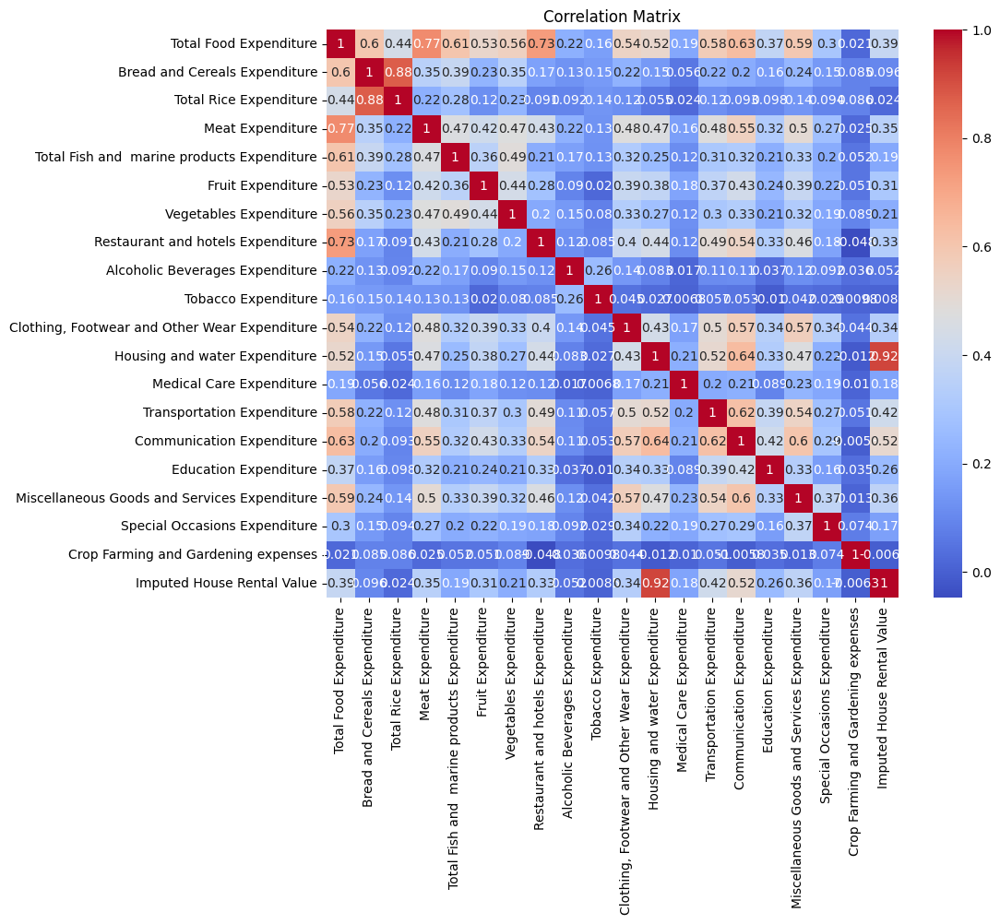

In [267]:
# Plot Correlation Matrix for Numerical Values
plt.figure(figsize=(10, 8))
sns.heatmap(df[expenditure_columns].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Feature Engineering

In [268]:
# Due to underrepresentation of households per region, omit region
df.drop(columns=['Region'], inplace=True)

In [269]:
# Get Unaccounted Bread and Cereals Expenditure by Subtracting Total Rice Expenditure from Bread and Cereals Expenditure
df['Other Bread and Cereals Expenditure'] = df['Bread and Cereals Expenditure'] - df['Total Rice Expenditure']

In [270]:
# Include Other Bread and Cereals Expenditure
expenditure_columns = np.append(expenditure_columns, 'Other Bread and Cereals Expenditure')

In [271]:
expenditure_columns

array(['Total Food Expenditure', 'Bread and Cereals Expenditure',
       'Total Rice Expenditure', 'Meat Expenditure',
       'Total Fish and  marine products Expenditure', 'Fruit Expenditure',
       'Vegetables Expenditure', 'Restaurant and hotels Expenditure',
       'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',
       'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Medical Care Expenditure',
       'Transportation Expenditure', 'Communication Expenditure',
       'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure',
       'Crop Farming and Gardening expenses',
       'Imputed House Rental Value',
       'Other Bread and Cereals Expenditure'], dtype=object)

In [272]:
# Aggregate Essential Spending
essential_cols = ['Total Food Expenditure', 'Housing and water Expenditure',
                  'Medical Care Expenditure',
                  'Communication Expenditure']

df['Total_Essential_Spending'] = df[essential_cols].sum(axis=1)

In [273]:
# Aggregate Non-Essential Spending
non_essential_cols = [
    'Restaurant and hotels Expenditure', 'Alcoholic Beverages Expenditure',
    'Education Expenditure', 'Transportation Expenditure',
    'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
    'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure',
    'Crop Farming and Gardening expenses'
]

df['Total_NonEssential_Spending'] = df[non_essential_cols].sum(axis=1)

In [274]:
df['Total Expenditure'] = df['Total_Essential_Spending'] + df['Total_NonEssential_Spending']

In [275]:
df['Total_Essential_NonFood_Spending'] = df['Total_Essential_Spending'] - df['Total Food Expenditure']
df['Total_NonFood_Spending'] = df['Total_NonEssential_Spending'] + df['Total_NonEssential_Spending']

In [276]:
# Create Ratios to Normalize and Understand Expenditure Distribution per Household
ratio_list = []

In [277]:
# Food Ratios
df['Meat Ratio'] = df['Meat Expenditure'] / df['Total Food Expenditure']
df['Fish Ratio'] = df['Total Fish and  marine products Expenditure'] / df['Total Food Expenditure']
df['Fruit Ratio'] = df['Fruit Expenditure'] / df['Total Food Expenditure']
df['Vegetables Ratio'] = df['Vegetables Expenditure'] / df['Total Food Expenditure']
df['Bread and Cereals Ratio'] = df['Bread and Cereals Expenditure'] / df['Total Food Expenditure']
df['Rice Ratio'] = df['Total Rice Expenditure'] / df['Total Food Expenditure']
df['Other Bread and Cereals Ratio'] = df['Other Bread and Cereals Expenditure'] / df['Total Food Expenditure']

In [278]:
ratio_list.append('Meat Ratio')
ratio_list.append('Fish Ratio')
ratio_list.append('Fruit Ratio')
ratio_list.append('Vegetables Ratio')
ratio_list.append('Bread and Cereals Ratio')
ratio_list.append('Rice Ratio')
ratio_list.append('Other Food Ratio')

In [279]:
# Non-Food Ratios to Total Expenditure
df['Food Ratio'] = df['Total Food Expenditure'] / df['Total Expenditure']
df['Housing and water Ratio'] = df['Housing and water Expenditure'] / df['Total Expenditure']
df['Alcoholic Beverages Ratio'] = df['Alcoholic Beverages Expenditure'] / df['Total Expenditure']
df['Tobacco Ratio'] = df['Tobacco Expenditure'] / df['Total Expenditure']
df['Clothing and Footwear Ratio'] = df['Clothing, Footwear and Other Wear Expenditure'] / df['Total Expenditure']
df['Miscellaneous Goods and Services Ratio'] = df['Miscellaneous Goods and Services Expenditure'] / df['Total Expenditure']
df['Special Occasions Ratio'] = df['Special Occasions Expenditure'] / df['Total Expenditure']
df['Restaurant and hotels Ratio'] = df['Restaurant and hotels Expenditure'] / df['Total Expenditure']
df['Crop Farming and Gardening Ratio'] = df['Crop Farming and Gardening expenses'] / df['Total Expenditure']
df['Medical Care Ratio'] = df['Medical Care Expenditure'] / df['Total Expenditure']
df['Education Ratio'] = df['Education Expenditure'] / df['Total Expenditure']
df['Communication Ratio'] = df['Communication Expenditure'] / df['Total Expenditure']
df['Transportation Ratio'] = df['Transportation Expenditure'] / df['Total Expenditure']
df['House Rental Ratio'] = df['Imputed House Rental Value'] / df['Total Expenditure']

In [280]:
ratio_list.append('Food Ratio')
ratio_list.append('Housing and water Ratio')
ratio_list.append('Alcoholic Beverages Ratio')
ratio_list.append('Tobacco Ratio')
ratio_list.append('Clothing and Footwear Ratio')
ratio_list.append('Miscellaneous Goods and Services Ratio')
ratio_list.append('Special Occasions Ratio')
ratio_list.append('Restaurant and hotels Ratio')
ratio_list.append('Crop Farming and Gardening Ratio')
ratio_list.append('Medical Care Ratio')
ratio_list.append('Education Ratio')
ratio_list.append('Communication Ratio')
ratio_list.append('Transportation Ratio')
ratio_list.append('House Rental Ratio')

In [281]:
# Income minus Expenditure
df['Diff_Income_Expenditure'] = df['Total Household Income'] - df['Total Expenditure']

In [282]:
# Count rows where Diff_Income Expenditures > 0
df[df['Diff_Income_Expenditure'] > 0].shape

(24952, 87)

In [283]:
# Create Remaining_Income column where Diff_Income_Expenditure is greater than 0, else 0
df['Remaining_Income'] = np.where(df['Diff_Income_Expenditure'] > 0, df['Diff_Income_Expenditure'], 0)

In [284]:
# Create Amount_Outside_Income where Diff_Income_Expenditure is less than 0, else 0
df['Amount_Outside_Income'] = np.where(df['Diff_Income_Expenditure'] < 0, df['Diff_Income_Expenditure'], 0)

In [285]:
# Convert to Positive Value 'Amount_Outside_Income'
df['Amount_Outside_Income'] = df['Amount_Outside_Income'].abs()

In [286]:
df['Debt to Income Ratio'] = df['Amount_Outside_Income'] / df['Total Household Income']
df['Savings to Income Ratio'] = df['Remaining_Income'] / df['Total Household Income']

In [287]:
df["Per Capita Income"] = df["Total Household Income"] / df["Total Number of Family members"]
df["Per Capita Expenditure"] = df["Total Expenditure"] / df["Total Number of Family members"]

In [288]:
df['Expenditure to Income Ratio'] = df['Total Expenditure'] / df['Total Household Income']

In [289]:
df['Essential Spending to Expenditure'] = df['Total_Essential_Spending'] / df['Total Expenditure']
df['NonEssential Spending to Expenditure'] = df['Total_NonEssential_Spending'] / df['Total Expenditure']
df['Essential Non Food Spending to Expenditure'] = df['Total_Essential_NonFood_Spending'] / df['Total Expenditure']
df['NonFood Spending to Expenditure'] = df['Total_NonFood_Spending'] / df['Total Expenditure']

In [290]:
ratio_list.append('Expenditure to Income Ratio')
ratio_list.append('Per Capita Income')
ratio_list.append('Per Capita Expenditure')
ratio_list.append('Essential Spending to Expenditure')
ratio_list.append('NonEssential Spending to Expenditure')
ratio_list.append('Essential Non Food Spending to Expenditure')
ratio_list.append('NonFood Spending to Expenditure')

In [291]:
ratio_list.append('Debt to Income Ratio')
ratio_list.append('Savings to Income Ratio')

In [292]:
# Drop Diff_Income_Expenditure
df.drop(columns=['Diff_Income_Expenditure'], inplace=True)

In [293]:
# Add Essential and Non-Essential Spending to expenditure columns
expenditure_columns = np.append(expenditure_columns, 'Total_Essential_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total_NonEssential_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total Expenditure')
expenditure_columns = np.append(expenditure_columns, 'Total_Essential_NonFood_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total_NonFood_Spending')
expenditure_columns

array(['Total Food Expenditure', 'Bread and Cereals Expenditure',
       'Total Rice Expenditure', 'Meat Expenditure',
       'Total Fish and  marine products Expenditure', 'Fruit Expenditure',
       'Vegetables Expenditure', 'Restaurant and hotels Expenditure',
       'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',
       'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Medical Care Expenditure',
       'Transportation Expenditure', 'Communication Expenditure',
       'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure',
       'Crop Farming and Gardening expenses',
       'Imputed House Rental Value',
       'Other Bread and Cereals Expenditure', 'Total_Essential_Spending',
       'Total_NonEssential_Spending', 'Total Expenditure',
       'Total_Essential_NonFood_Spending', 'Total_NonFood_Spending'],
      dtype=object)

In [294]:
# Drop raw expenditure columns from df
df.drop(columns=expenditure_columns, inplace=True)

In [295]:
# Add Newly Created Income Columns to Income Columns
income_columns = np.append(income_columns, 'Remaining_Income')
income_columns = np.append(income_columns, 'Amount_Outside_Income')
income_columns

array(['Total Household Income',
       'Total Income from Entrepreneurial Acitivites', 'Remaining_Income',
       'Amount_Outside_Income'], dtype=object)

In [296]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 71 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Total Household Income                        41544 non-null  int64  
 1   Main Source of Income                         41544 non-null  object 
 2   Agricultural Household indicator              41544 non-null  int64  
 3   Total Income from Entrepreneurial Acitivites  41544 non-null  int64  
 4   Household Head Sex                            41544 non-null  object 
 5   Household Head Age                            41544 non-null  int64  
 6   Household Head Marital Status                 41544 non-null  object 
 7   Household Head Highest Grade Completed        41544 non-null  object 
 8   Household Head Job or Business Indicator      41544 non-null  object 
 9   Household Head Occupation                     34008 non-null 

In [297]:
individual_assets = ['Number of Television',
       'Number of CD/VCD/DVD', 'Number of Component/Stereo set',
       'Number of Refrigerator/Freezer', 'Number of Washing Machine',
       'Number of Airconditioner', 'Number of Car, Jeep, Van',
       'Number of Landline/wireless telephones', 'Number of Cellular phone',
       'Number of Personal Computer', 'Number of Stove with Oven/Gas Range',
       'Number of Motorized Banca', 'Number of Motorcycle/Tricycle',]

In [298]:
# Drop all individual assets as they are irrelevant to the research goal
df.drop(columns=individual_assets, inplace=True)

In [299]:
df.columns

Index(['Total Household Income', 'Main Source of Income',
       'Agricultural Household indicator',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Sex',
       'Household Head Age', 'Household Head Marital Status',
       'Household Head Highest Grade Completed',
       'Household Head Job or Business Indicator', 'Household Head Occupation',
       'Household Head Class of Worker', 'Type of Household',
       'Total Number of Family members',
       'Members with age less than 5 year old',
       'Members with age 5 - 17 years old',
       'Total number of family members employed', 'Type of Building/House',
       'Type of Roof', 'Type of Walls', 'House Floor Area', 'House Age',
       'Number of bedrooms', 'Tenure Status', 'Toilet Facilities',
       'Electricity', 'Main Source of Water Supply', 'Meat Ratio',
       'Fish Ratio', 'Fruit Ratio', 'Vegetables Ratio',
       'Bread and Cereals Ratio', 'Rice Ratio',
       'Other Bread and Cereals Ratio', 'Food Rat

In [300]:
house_characteristics = ['Type of Building/House',
       'Type of Roof', 'Type of Walls', 'House Floor Area', 'House Age',
       'Number of bedrooms', 'Tenure Status', 'Toilet Facilities',
       'Electricity', 'Main Source of Water Supply']

In [301]:
# Drop house characteristics as they are not relevant to the research goals
df.drop(columns=house_characteristics, inplace=True)

In [302]:
# Capture number of unemployed people
df['Number of Unemployed'] = df['Total Number of Family members'] - df['Total number of family members employed']

In [303]:
# If Number of Unemployed is Negative, change it to 0
df['Number of Unemployed'] = df['Number of Unemployed'].apply(lambda x: 0 if x < 0 else x)

In [304]:
# Capture number of Kids
df['Number of Kids'] = df['Members with age less than 5 year old'] + df['Members with age 5 - 17 years old']

In [305]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 50 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Total Household Income                        41544 non-null  int64  
 1   Main Source of Income                         41544 non-null  object 
 2   Agricultural Household indicator              41544 non-null  int64  
 3   Total Income from Entrepreneurial Acitivites  41544 non-null  int64  
 4   Household Head Sex                            41544 non-null  object 
 5   Household Head Age                            41544 non-null  int64  
 6   Household Head Marital Status                 41544 non-null  object 
 7   Household Head Highest Grade Completed        41544 non-null  object 
 8   Household Head Job or Business Indicator      41544 non-null  object 
 9   Household Head Occupation                     34008 non-null 

In [306]:
# Refresh numerical columns
numerical_columns = df.select_dtypes(include=[np.number]).columns
numerical_columns

Index(['Total Household Income', 'Agricultural Household indicator',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Age',
       'Total Number of Family members',
       'Members with age less than 5 year old',
       'Members with age 5 - 17 years old',
       'Total number of family members employed', 'Meat Ratio', 'Fish Ratio',
       'Fruit Ratio', 'Vegetables Ratio', 'Bread and Cereals Ratio',
       'Rice Ratio', 'Other Bread and Cereals Ratio', 'Food Ratio',
       'Housing and water Ratio', 'Alcoholic Beverages Ratio', 'Tobacco Ratio',
       'Clothing and Footwear Ratio', 'Miscellaneous Goods and Services Ratio',
       'Special Occasions Ratio', 'Restaurant and hotels Ratio',
       'Crop Farming and Gardening Ratio', 'Medical Care Ratio',
       'Education Ratio', 'Communication Ratio', 'Transportation Ratio',
       'House Rental Ratio', 'Remaining_Income', 'Amount_Outside_Income',
       'Debt to Income Ratio', 'Savings to Income Ratio', 'Per Capita

In [307]:
# Remove Electricity and Agricultural Household Indicator
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Electricity'))
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Agricultural Household indicator'))
numerical_columns

Index(['Total Household Income',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Age',
       'Total Number of Family members',
       'Members with age less than 5 year old',
       'Members with age 5 - 17 years old',
       'Total number of family members employed', 'Meat Ratio', 'Fish Ratio',
       'Fruit Ratio', 'Vegetables Ratio', 'Bread and Cereals Ratio',
       'Rice Ratio', 'Other Bread and Cereals Ratio', 'Food Ratio',
       'Housing and water Ratio', 'Alcoholic Beverages Ratio', 'Tobacco Ratio',
       'Clothing and Footwear Ratio', 'Miscellaneous Goods and Services Ratio',
       'Special Occasions Ratio', 'Restaurant and hotels Ratio',
       'Crop Farming and Gardening Ratio', 'Medical Care Ratio',
       'Education Ratio', 'Communication Ratio', 'Transportation Ratio',
       'House Rental Ratio', 'Remaining_Income', 'Amount_Outside_Income',
       'Debt to Income Ratio', 'Savings to Income Ratio', 'Per Capita Income',
       'Per Capita Expendi

In [308]:
# Refresh null columns
null_columns = df.columns[df.isna().any()]

In [309]:
# Fill Null Columns with 'Unknown'
df[null_columns] = df[null_columns].fillna('Unknown')

In [310]:
# Dictionary to map occupations to industry sectors
industry_categories = {
    "Managers":[
        'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in wholesale and retail trade', 'General managers/managing proprietors of restaurants and hotels', 'Traditional chiefs and heads of villages', 'General managers/managing proprietors in manufacturing', 'General managers/managing proprietors n. e. c.', 'Production and operations managers in agriculture, hunting, forestry and fishery', 'School supervisors and principals', 'General managers/managing proprietors of business services', 'School principals', 'Government administrators (including career executive service officers)', 'Production supervisors and general foremen', 'Production and operations managers in restaurant and hotels', 'General managers/managing proprietors in agriculture, hunting, forestry and fishing', 'General managers/managing proprietors in personal care, cleaning and relative services', 'Directors and chief executives of corporations', 'General managers/managing proprietors in construction', 'Personnel and industrial relations managers', 'Production and operations managers in transport, storage and communications', 'Sales and marketing managers', 'Production and operations managers in manufacturing', 'Research and development managers', 'Production and operations managers in personal care, cleaning and relative services', 'Other specialized managers', 'Production and operations managers in wholesale and retail trade', 'Staff officers', 'Finance and administration managers', 'Commanding officers', 'Production and operations managers in construction', 'Senior officials of humanitarian and other special-interest organizations', 'Production and operations managers in business services', 'Supply and distribution managers', 'Officers, n. e. c.', 'Advertising and public relations managers'
    ],
    "Professionals":[
        'General elementary education teaching professionals', 'Justices', 'Other social science professionals', 'Foresters and related scientists', 'College, university and higher education teaching professionals', 'Legislative officials', 'Medical technologists', 'Civil engineers', 'Religious professionals', 'General secondary education teaching professionals', 'Vocational education teaching professionals', 'Choreographers and dancers', 'Accountants and auditors', 'Mechanical engineers', 'Agronomists and related scientists', 'Other computer professionals', 'Professional nurses', 'Professional, technical and related officers', 'Athletes and related workers', 'Decorators and commercial designers', 'Computer programmers', 'Pharmacists', 'Architects', 'Nutritionists-dietitians', 'Professional midwives', 'Street, nightclub and related musicians, singers and dancers', 'Electrical Engineers', 'Computer engineers and related professionals', 'Other business professionals', 'Economists', 'Chemists', 'Composers, musicians and singers', 'Photographers and image and sound recording equipment operators', 'Statisticians', 'Electronics and communications engineers', 'Fashion and other models', 'Personnel and human resource development professionals', 'Systems analysts and designers', 'Librarians, archivists and curators', 'Town planners and related professionals', 'Education methods specialists', 'Sculptors, painters and related artists', 'Medical doctors', 'Industrial engineers', 'Lawyers', 'Dentists', 'Pre-elementary education teaching professionals', 'Social work professionals', 'Technical and vocational instructors/trainors', 'Radio, television and other announcers', 'Other health professionals (except nursing)', 'Nonformal education teaching professionals other than technical and vocational trainors/instructors', 'Authors, journalists and other writers', 'Chemical engineers', 'Science and mathematics teaching professionals', 'Science and mathematics elementary education teaching professionals', 'Geodetic engineers and related professionals', 'Other creative or performing artists', 'Other teaching professionals', 'Other engineers and related professionals', 'Physiotherapists', 'Optometrists and opticians', 'Veterinarians'
    ],
    "Technicians and associate professionals" : [
        'Statistical, mathematical and related associate professionals', 'Social work associate professionals', 'Mechanical engineering technicians', 'Statistical and finance clerks', 'Non-ordained religious associate professionals', 'Other administrative associate professionals', 'Bookkeepers', 'Midwifery associate professionals', 'Safety, health and quality inspectors (vehicles, processes and products)', 'Veterinary assistants', 'Administrative secretaries and related associate professionals', 'Teaching associate professionals', 'Mining and metallurgical engineering technicians', 'Draftsmen', 'Other life science technicians', 'Legal and related business associate professionals', 'Farm technicians', 'Civil engineering technicians', 'Other health associate professionals (except nursing)', 'Medical assistants', 'Electronics and communications engineering technicians', 'Ship and aircraft controllers and technicians', 'Air traffic safety technicians', 'Other physical science and engineering technicians', 'Building and fire inspectors', 'Dental assistants', 'Other government associate professionals', 'Other finance and sales associate professionals', 'Life science technicians', 'Pharmaceutical assistants', 'Medical equipment operators', 'Nursing associate professionals', 'Electrical engineering technicians'
    ],
    "Clerical support workers" : [
        'Stocks clerks', 'Secretaries', 'Other office clerks', 'Tellers and other counter clerks', 'Accounting and bookkeeping clerks', 'Data entry operators', 'Transport clerks', 'Library and filing clerks', 'Receptionists and information clerks', 'Government tax and excise officials', 'Mail carriers and sorting clerks', 'Word processor and related operators', 'Production clerks', 'Customs and immigration inspectors', 'Government licensing officials', 'Stenographers and typists', 'Computer assistants', 'Coding, proof-reading and related clerks', 'Telephone switchboard operators', 'Government social benefits officials'
    ],
    "Service and sales workers" : [
        'Transport conductors', 'Protective services workers n. e. c.', 'Shop salespersons and demonstrators', 'Door-to-door and telephone salespersons', 'Police inspectors and detectives', 'Prison guards', 'Street ambulant vendors', 'Other supervisors, n. e. c.', 'Doorkeepers, watchpersons and related workers', 'Waiters, waitresses and bartenders', 'Child care workers', 'Police officers', 'Bet bookmakers and croupiers', 'Institution-based personal care workers', 'Market and sidewalk stall vendors', 'Debt collectors and related workers', 'Pawnbrokers and money lenders', 'Stall and market salespersons', 'Firefighters', 'Undertakers and embalmers', 'Hairdressers, barbers, beauticians and related workers', 'Cashiers and ticket clerks', 'Personal care and related workers, n. e. c.', 'Labor contractors and employment agents', 'Transport and communications service supervisors n. e. c.', 'Estate agents', 'Technical and commercial sales representatives', 'Housekeepers and related workers', 'Appraisers and valuers', 'Insurance representatives', 'Other personal services workers, n. e. c.', 'Sales supervisors in retail trade', 'Home-based personal care workers', 'Buyers', 'Faith healers', 'Travel consultants and organizers', 'Air transport service supervisors', 'Companions and valets', 'Travel guides', 'Trade brokers', 'Sales supervisors in wholesale trade', 'Other sales supervisors', 'Postal service supervisors', 'Maritime transport service supervisors', 'Service and related workers', 'Other business services and trade brokers'
    ],
    "Skilled agricultural, forestry and fishery workers" : [
        'Rice farmers', 'Hog raising farmers', 'Vegetable farmers', 'Inland and coastal waters fishermen', 'Corn farmers', 'Coconut farmers', 'Root crops farmers', 'Fruit tree farmers', 'Coffee and cacao farmers', 'Other orchard farmers', 'Duck raisers', 'Cotton and fiber crops farmers', 'Forest tree planters', 'Concessionaires and loggers', 'Minor forest products gatherers', 'Chicken farmers', 'Fish-farm cultivators (excluding prawns)', 'Ornamental plant growers', 'Cattle and dairy farmers', 'Other livestock farmers', 'Deep-sea fishermen', 'Other field crop farmers', 'Sugarcane farmers', 'Other poultry farmers', 'Field legumes farmers', 'Other plant growers', 'Seaweeds cultivators', 'Fishermen n. e. c.', 'Other animal raisers', 'Hunters and trappers', 'Other aqua products cultivators', 'Tree nut farmers'
    ],
    "Craft and related trades workers" : [
        'Electronics mechanics and servicers', 'Welders and flamecutters', 'Motor vehicle mechanics and related trades workers', 'Lineman, line installers and cable splicers', 'Carpenters and joiners', 'Masons and related concrete finishers', 'Painters and related workers', 'Cooks', 'Tailors, dressmakers and hatters', 'Wood and related products assemblers', 'Plumbers, pipe fitters and other related workers', 'Food preservers', 'Basketry weavers, brush makers and related workers', 'Wood products machine operators', 'Building and related electricians', 'Cabinet/furniture makers and related workers', 'Blacksmiths, hammersmiths, and forging-press workers', 'Butchers, fishmongers and related food preparers', 'Bakers, pastry cooks and confectionery makers', 'Rattan, bamboo and other wicker furniture makers', 'Sheet-metal workers', 'Handicraft workers in wood and related materials', 'Weavers, knitters and related workers', 'Traditional medicine practitioners', 'Silk-screen, block and textile printers', 'Varnishers and related painters', 'Structural-metal preparers, erectors and related workers', 'Sewers, Embroiderers and related workers', 'Electronic equipment assemblers', 'Textile, leather and related patternmakers and cutters', 'Roofers', 'Metal-wheel grinders, polishers and tool sharpeners', 'Electrical mechanics and fitters', 'Glass makers, cutters, grinders and finishers', 'Tool-makers and related workers', 'Riggers and cable splicers', 'Dairy products makers', 'Building frame and related trades workers n. e. c.', 'Mechanical machinery assemblers', 'Metal drawers and extruders', 'Floor layers and tile setters', 'Precision instrument makers and repairers', 'Compositors, typesetters and related workers', 'Electrical equipment assemblers', 'Metal, rubber and plastic products assemblers', 'Metal molders and coremakers', 'Marine craft mechanics', 'Bookbinders and related workers', 'Jewelry and precious metal workers', 'Musical instrument makers and tuners', 'Machine-tool setters and setter operators', 'Stone splitters, cutters and carvers', 'Photographic and related workers', 'Aircraft engine mechanics and fitters', 'Woodworking machine setters and setter-operators', 'Food and beverage tasters and graders', 'Pressman letterpresses and related workers', 'Shoemakers and related workers', 'Agricultural or industrial machinery mechanics and fitters', 'Upholsterers and related workers', 'Insulation workers', 'Machine tool operators', 'Technician, skilled, semi-skilled workers', 'Tobacco preparers and tobacco products makers', 'Paperboard, textile and related products assemblers', 'Telecommunication equipment installers and repairers', 'Business machines mechanics and repairers', 'Builders (traditional materials)', 'Electronics fitters', 'Potters and related clay and abrasive formers', 'Fiber preparers', 'Tanners', 'Wood treaters'
    ],
    "Plant and machine operators and assemblers" : [
        'Heavy truck and lorry drivers', 'Car, taxi and van drivers', 'Motorcycle drivers', "Ship's deck crews and related workers", "Ships' deck officers and pilots", 'Earth-moving and related plant operators', 'Motorized farm and forestry plant operators', 'Broadcasting and telecommunications equipment operators', 'Chemical processing plant operators n. e. c.', 'Wood processing plant operators', 'Fruit, vegetable and nut processing machine operators', 'Lifting truck operators', 'Photographic products machine operators', 'Mining-plant operators', 'Rubber products machine operators', 'Cement and other mineral products machine operators', 'Grain and spice milling machine operators', 'Computer equipment operators', 'Other machine operators and assemblers', 'Power production plant operators', 'Metal finishing, plating and coating machine operators', 'Automated assembly-line operators', 'Sugar production machine operators', 'Bus drivers', 'Meat and fish processing machine operators', 'Crane, hoist and related plant operators', 'Hand or pedal vehicle drivers', 'Metal melters, caster and rolling mill operators', 'Weaving and knitting machine operators', 'Incinerator, water treatment and related plant operators', 'Baked goods and cereal and chocolate products machine operators', 'Mineral ore and stone-processing plant operators', 'Brewers and wine and other beverage machine operators', 'Papermaking plant operators', 'Pharmaceutical and toiletry products machine operators', 'Plastic products machine operators', 'Industrial robot operators', 'Dairy products machine operators', 'Drivers of animal-drawn vehicles and machinery', 'Bleaching, dyeing and cleaning machine operators', 'Petroleum and natural gas refining plant operators', 'Fiber preparing, spinning and winding machine operators', 'Shoemaking and related machine operators', 'Glass and ceramics kiln and related machine operators', 'Textile and leather products machine operators n. e. c.', 'Locomotive engine drivers', 'Chemical products machine operators n. e. c.', 'Paper pulp plant operators', 'Sewing machine operators', 'Aircraft pilots, navigators and flight engineers', 'Glass, ceramics and related plant operators n. e. c.'
    ],
    "Elementary occupations" : [
        'Farmhands and laborers', 'Building construction laborers', 'Construction and maintenance laborers: roads, dams and similar constructions', 'Helpers and cleaners in offices, hotels and other establishments', 'Messengers, package and luggage porters and deliverers', 'Hand packers and other manufacturing laborers', 'Hand launderers and pressers', 'Sweepers and related laborers', 'Forestry laborers', 'Assembling laborers', 'Building caretakers', 'Mining and quarrying laborers', 'Domestic helpers and cleaners', 'Freight handlers', 'Fishery laborers and helpers', 'Miners and quarry workers', 'Shotfirers and blasters', 'Shoe cleaning and other street services elementary occupations', 'Garbage collectors', 'Charcoal makers and related workers', 'Well drillers and borers and related workers', 'Workers reporting occupations unidentifiable or inadequately defined', 'Hunting and trapping laborers', 'Vehicle, window and related cleaners'
    ],
    "Armed forces occupations" : [
        'Enlisted personnel n. e. c.', 'Combat soldiers'
    ]
}

In [311]:
# Reverse mapping for faster lookup
occupation_to_industry = {}
for industry, occupations in industry_categories.items():
    for occupation in occupations:
        occupation_to_industry[occupation] = industry

In [312]:
# Categorizing the jobs
categorized_jobs = {industry: [] for industry in industry_categories}
for job in df['Household Head Occupation']:
    category = occupation_to_industry.get(job, 'Uncategorized')
    if category in categorized_jobs:
        categorized_jobs[category].append(job)
    else:
        categorized_jobs['Uncategorized'] = [job]

In [313]:
# Printing the categorized jobs before applying to DataFrame
for category, jobs in categorized_jobs.items():
    print(f"{category}:")
    print(jobs)
    print('-' * 40)

Managers:
['General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in wholesale and retail trade', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in wholesale and retail trade', 'General managers/managing proprietors in wholesale and retail trade', 'General managers/managing proprietors of restaurants and hotels', 'Traditional chiefs and heads of villages', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in wholesale and 

In [314]:
# Define function 'categorize_occupation'
def categorize_occupation(occupation):
    for industry, occupations in industry_categories.items():
        if occupation in occupations:
            return industry
    return 'Uncategorized'

In [315]:
df['Household Head Occupation'] = df['Household Head Occupation'].apply(categorize_occupation)

In [316]:
df['Household Head Occupation'].value_counts()

,count
Household Head Occupation,
"Skilled agricultural, forestry and fishery workers",9042
Uncategorized,7536
Elementary occupations,7177
Managers,6963
Service and sales workers,3555
Craft and related trades workers,3085
Plant and machine operators and assemblers,2172
Professionals,971
Clerical support workers,564


In [317]:
highest_educational_attainment = {
    0 : [
        'No Grade Completed'
    ],
    1 : [
        'Preschool'
    ],
    2 :[
        'Grade 4','Grade 5', 'Grade 3', 'Grade 2', 'Grade 1', 'Grade 6'
    ],
    3 :[
        'Elementary Graduate'
    ],
    4 :[
        'Second Year High School', 'Third Year High School', 'First Year High School'
    ],
    5 :[
        'High School Graduate'
    ],
    6 :[
        'Third Year College', 'First Year College', 'Second Year College', 'First Year Post Secondary',
        'Second Year Post Secondary', 'Fourth Year College',
        'Other Programs in Education at the Third Level, First Stage, of the Type that Leads to an Award not Equivalent to a First University or Baccalaureate Degree',
        'Other Programs of Education at the Third Level, First Stage, of the Type that Leads to a Baccalaureate or First University/Professional Degree (HIgher Education Level, First Stage, or Collegiate Education Level)'
    ],
    7 : [
        'Business and Administration Programs', 'Teacher Training and Education Sciences Programs',
        'Engineering and Engineering Trades Programs', 'Engineering and Engineering trades Programs',
        'Health Programs', 'Computing/Information Technology Programs', 'Security Services Programs',
        'Agriculture, Forestry, and Fishery Programs', 'Transport Services Programs',
        'Social and Behavioral Science Programs', 'Personal Services Programs', 'Humanities Programs',
        'Law Programs', 'Basic Programs', 'Architecture and Building Programs', 'Journalism and Information Programs',
        'Arts Programs', 'Life Sciences Programs', 'Manufacturing and Processing Programs', 'Mathematics and Statistics Programs',
        'Social Services Programs', 'Physical Sciences Programs', 'Veterinary Programs', 'Environmental Protection Programs'
    ],
    8 : [
        'Post Baccalaureate'
    ]
}

In [318]:
print(type(highest_educational_attainment))  # Should be <class 'dict'>
print(highest_educational_attainment)        # Check its contents

<class 'dict'>
{0: ['No Grade Completed'], 1: ['Preschool'], 2: ['Grade 4', 'Grade 5', 'Grade 3', 'Grade 2', 'Grade 1', 'Grade 6'], 3: ['Elementary Graduate'], 4: ['Second Year High School', 'Third Year High School', 'First Year High School'], 5: ['High School Graduate'], 6: ['Third Year College', 'First Year College', 'Second Year College', 'First Year Post Secondary', 'Second Year Post Secondary', 'Fourth Year College', 'Other Programs in Education at the Third Level, First Stage, of the Type that Leads to an Award not Equivalent to a First University or Baccalaureate Degree', 'Other Programs of Education at the Third Level, First Stage, of the Type that Leads to a Baccalaureate or First University/Professional Degree (HIgher Education Level, First Stage, or Collegiate Education Level)'], 7: ['Business and Administration Programs', 'Teacher Training and Education Sciences Programs', 'Engineering and Engineering Trades Programs', 'Engineering and Engineering trades Programs', 'Health 

In [319]:
def check_education_categorization(df, column_name, highest_educational_attainment):
    # Reverse mapping: Create a lookup dictionary for fast categorization
    education_to_category = {}
    for category, levels in highest_educational_attainment.items():
        for level in levels:
            education_to_category[level] = category

    # Dictionary to store categorized entries
    categorized_levels = {category: [] for category in highest_educational_attainment}
    categorized_levels["Uncategorized"] = []  # To capture unmatched entries

    # Categorize each entry in the DataFrame
    for edu in df[column_name]:
        category = education_to_category.get(edu, "Uncategorized")
        categorized_levels[category].append(edu)

    # Print categorized results for validation
    for category, levels in categorized_levels.items():
        print(f"{category} ({len(levels)} entries):")
        print(levels[:10])  # Show a sample of 10 for readability
        print('-' * 50)

    # Return categorized results (optional)
    return categorized_levels

In [320]:
categorized_results = check_education_categorization(df, 'Household Head Highest Grade Completed', highest_educational_attainment)

0 (1228 entries):
['No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed']
--------------------------------------------------
1 (15 entries):
['Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool']
--------------------------------------------------
2 (8821 entries):
['Grade 3', 'Grade 6', 'Grade 4', 'Grade 3', 'Grade 2', 'Grade 5', 'Grade 3', 'Grade 4', 'Grade 4', 'Grade 4']
--------------------------------------------------
3 (7640 entries):
['Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate']
--------------------------------------------------
4 (4896 entries):
['Second Year 

In [321]:
# Define function 'Household Highest Educational Attaintment'
def categorize_highest_educational_attainment(education):
    for category, educational_levels in highest_educational_attainment.items():
        if education in educational_levels:
            return category
    return 'Uncategorized'

In [322]:
# Apply to 'Household Head Highest Grade Completed'
df['Household Head Highest Grade Completed'] = df['Household Head Highest Grade Completed'].apply(categorize_highest_educational_attainment)

In [323]:
df['Household Head Highest Grade Completed'].value_counts()

,count
Household Head Highest Grade Completed,
5,9628
2,8821
3,7640
7,5441
4,4896
6,3628
0,1228
8,247
1,15


In [324]:
worker_class_mapping = {
    "Formal Employment":[
        'Worked for government/government corporation', 'Worked for private establishment'
    ],
    "Entrepreneurial":[
        'Self-employed wihout any employee', 'Employer in own family-operated farm or business'
    ],
    "Informal Employment":[
        'Worked for private household', 'Worked with pay in own family-operated farm or business'
    ],
    "Unpaid Worker":[
        'Worked without pay in own family-operated farm or business'
    ]
}

In [325]:
def categorize_worker_class(worker_class):
    for category, worker_classes in worker_class_mapping.items():
        if worker_class in worker_classes:
            return category
    return 'Uncategorized'

In [326]:
df['Household Head Class of Worker'] = df['Household Head Class of Worker'].apply(categorize_worker_class)

In [327]:
df['Household Head Class of Worker'].value_counts()

,count
Household Head Class of Worker,
Formal Employment,16551
Entrepreneurial,16347
Uncategorized,7536
Informal Employment,825
Unpaid Worker,285


In [328]:
df_copy = df.copy()

In [329]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 50 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Total Household Income                        41544 non-null  int64  
 1   Main Source of Income                         41544 non-null  object 
 2   Agricultural Household indicator              41544 non-null  int64  
 3   Total Income from Entrepreneurial Acitivites  41544 non-null  int64  
 4   Household Head Sex                            41544 non-null  object 
 5   Household Head Age                            41544 non-null  int64  
 6   Household Head Marital Status                 41544 non-null  object 
 7   Household Head Highest Grade Completed        41544 non-null  int64  
 8   Household Head Job or Business Indicator      41544 non-null  object 
 9   Household Head Occupation                     41544 non-null 

In [330]:
# One Hot Selected Columns
df_copy = pd.get_dummies(df_copy, columns=['Main Source of Income',
                                           'Household Head Sex',
                                           'Household Head Job or Business Indicator',
                                           'Type of Household'], drop_first=True)

In [331]:
''' Label Encode Selected Columns :'Region', 'Household Head Occupation ''Household Head Marital Status', 'Tenure Status', 'Type of Building/House',
                                           'Household Head Class of Worker' '''

" Label Encode Selected Columns :'Region', 'Household Head Occupation ''Household Head Marital Status', 'Tenure Status', 'Type of Building/House',\n                                           'Household Head Class of Worker' "

In [333]:
label_encoder = LabelEncoder()
df_copy['Household Head Marital Status'] = label_encoder.fit_transform(df_copy['Household Head Marital Status'])
df_copy['Household Head Class of Worker'] = label_encoder.fit_transform(df_copy['Household Head Class of Worker'])
df_copy['Household Head Occupation'] = label_encoder.fit_transform(df_copy['Household Head Occupation'])

In [334]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 52 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   Total Household Income                                      41544 non-null  int64  
 1   Agricultural Household indicator                            41544 non-null  int64  
 2   Total Income from Entrepreneurial Acitivites                41544 non-null  int64  
 3   Household Head Age                                          41544 non-null  int64  
 4   Household Head Marital Status                               41544 non-null  int64  
 5   Household Head Highest Grade Completed                      41544 non-null  int64  
 6   Household Head Occupation                                   41544 non-null  int64  
 7   Household Head Class of Worker                              41544 non-null  int64  
 

# Dataset Treatments

*   Original Dataset with Manual feature selection
*   Original Dataset with Automated feature selection
*   Original Dataset with PCA and manual feature selection
*   Original Dataset with Feature Selection and PCA

*   Extract Non-Outliers with Manual Feature Selection
*   Extract Non-Outliers with Automated Feature Selection
*   Extract Non-Outliers with PCA and Manual Feature Selection
*   Extract Non-Outliers with PCA and Automated Feature Selection


In [335]:
df_orig = df_copy.copy()

<ipython-input-336-195efde704fb>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15, 5))


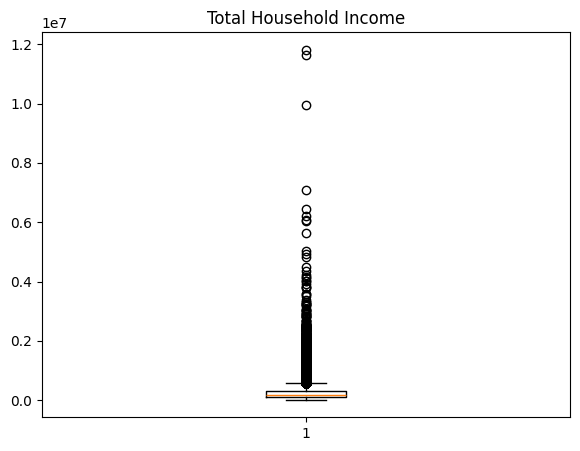

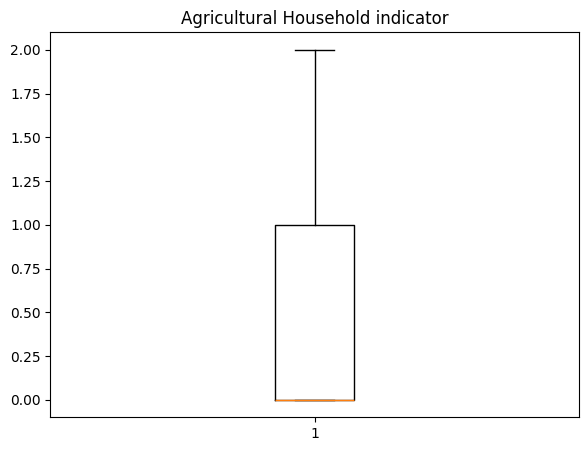

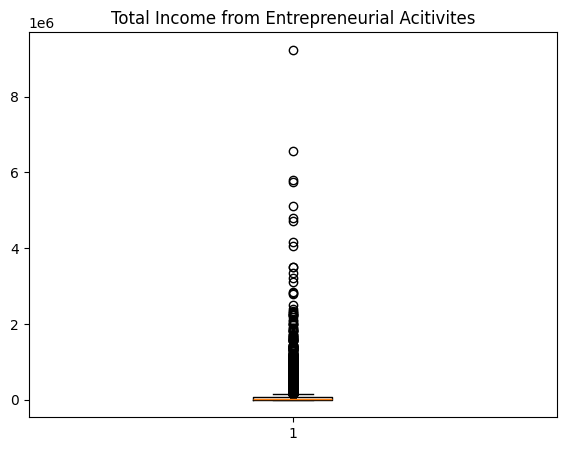

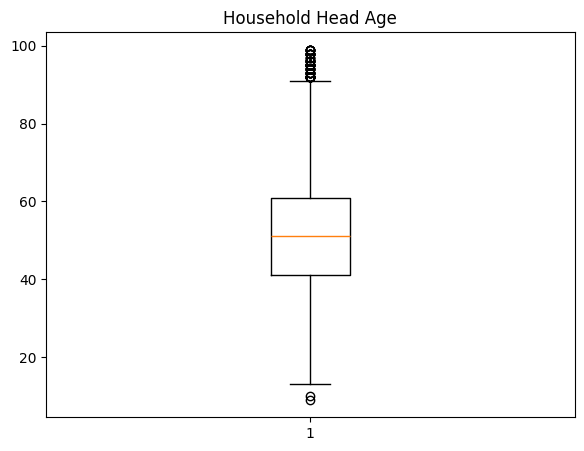

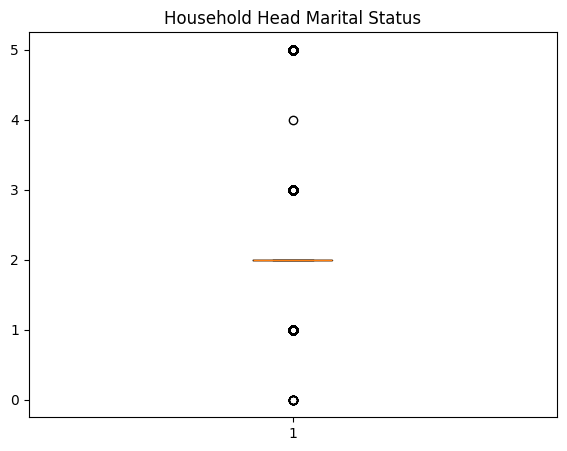

...

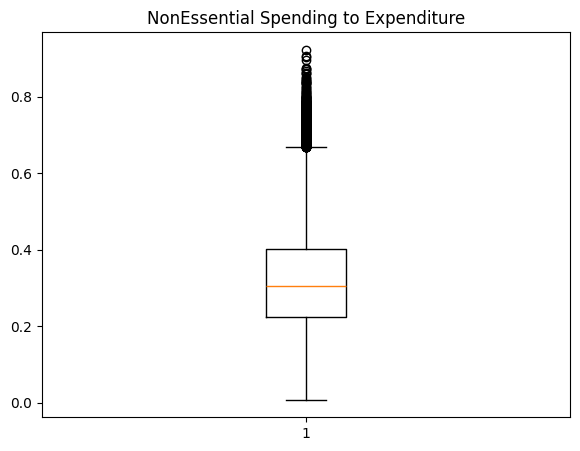

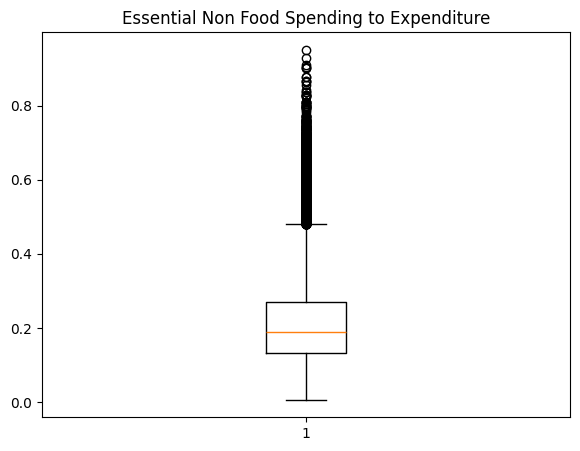

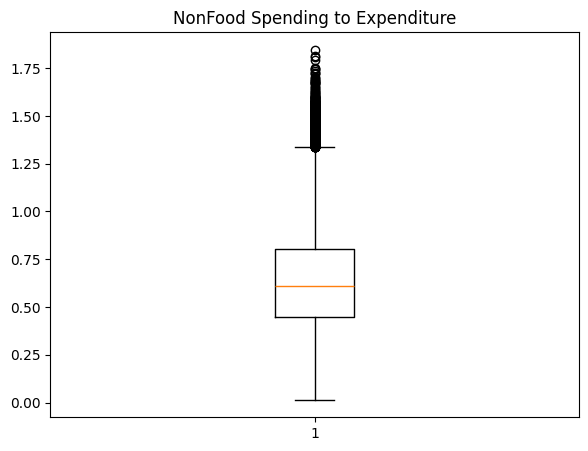

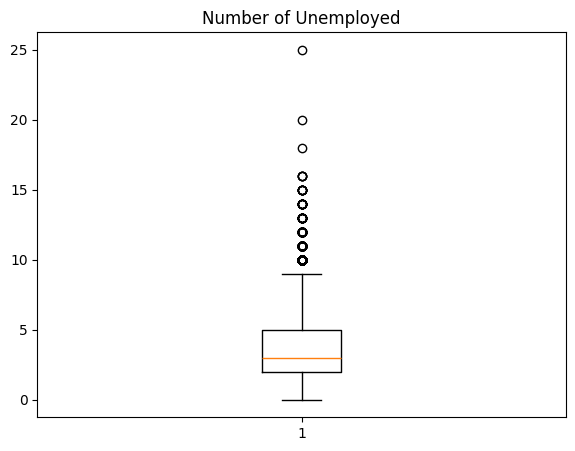

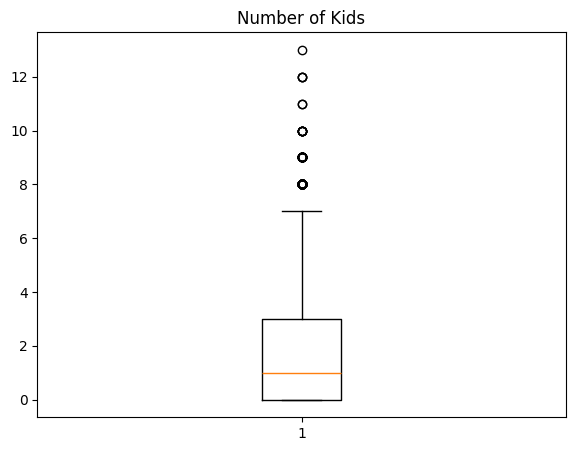

In [336]:
# Plot Numerical Features
for column in df_orig.select_dtypes(include=['int64', 'float64']):
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    plt.boxplot(df_orig[column])
    plt.title(column)

In [337]:
df_orig.describe()

,Total Household Income,Agricultural Household indicator,Total Income from Entrepreneurial Acitivites,Household Head Age,Household Head Marital Status,Household Head Highest Grade Completed,Household Head Occupation,Household Head Class of Worker,Total Number of Family members,Members with age less than 5 year old,...,Savings to Income Ratio,Per Capita Income,Per Capita Expenditure,Expenditure to Income Ratio,Essential Spending to Expenditure,NonEssential Spending to Expenditure,Essential Non Food Spending to Expenditure,NonFood Spending to Expenditure,Number of Unemployed,Number of Kids
count,4.154400e+04,41544.000000,4.154400e+04,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,...,41544.000000,4.154400e+04,4.154400e+04,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000
mean,2.475556e+05,0.429858,5.437624e+04,51.381451,2.504309,4.095224,5.991310,1.009749,4.635182,0.410216,...,0.132814,6.416664e+04,5.355108e+04,0.975204,0.678898,0.321102,0.215942,0.642204,3.364168,1.772795
std,2.868805e+05,0.676666,1.471428e+05,14.166081,1.142341,1.831761,2.797259,1.095725,2.280252,0.694390,...,0.164214,8.391248e+04,5.261856e+04,0.350638,0.134195,0.134195,0.116535,0.268390,2.092840,1.652286
min,1.128500e+04,0.000000,0.000000e+00,9.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,0.000000,3.065833e+03,4.686571e+03,0.084867,0.076762,0.007144,0.006500,0.014288,0.000000,0.000000
25%,1.048950e+05,0.000000,0.000000e+00,41.000000,2.000000,3.000000,3.000000,0.000000,3.000000,0.000000,...,0.000000,2.423658e+04,2.425281e+04,0.770356,0.598617,0.223677,0.132532,0.447354,2.000000,0.000000
50%,1.640795e+05,0.000000,1.922200e+04,51.000000,2.000000,4.000000,6.000000,1.000000,4.000000,0.000000,...,0.062539,4.033562e+04,3.824775e+04,0.937461,0.693762,0.306238,0.190323,0.612477,3.000000,1.000000
75%,2.911385e+05,1.000000,6.596875e+04,61.000000,2.000000,5.000000,8.000000,1.000000,6.000000,1.000000,...,0.229644,7.325274e+04,6.393138e+04,1.117088,0.776323,0.401383,0.271546,0.802766,5.000000,3.000000
max,1.181599e+07,2.000000,9.234485e+06,99.000000,5.000000,8.000000,10.000000,4.000000,26.000000,5.000000,...,0.915133,2.572904e+06,1.825732e+06,17.649014,0.992856,0.923238,0.950706,1.846476,25.000000,13.000000


# Outlier Detection

In [338]:
# import counter
def IQR_method(df, n, features):
    """
    Takes a dataframe and returns an index list corresponding to the observations
    containing more than n outliers according to the Tukey IQR method.
    """
    outlier_list = []

    for column in features:  # Iterate over numerical columns only

        # 1st quartile (25%)
        Q1 = np.percentile(df[column], 25)
        # 3rd quartile (75%)
        Q3 = np.percentile(df[column], 75)

        # Interquartile range (IQR)
        IQR = Q3 - Q1

        # outlier step
        outlier_step = 1.5 * IQR

        # Determining a list of indices of outliers
        outlier_list_column = df[(df[column] < Q1 - outlier_step) | (df[column] > Q3 + outlier_step)].index

        # appending the list of outliers
        outlier_list.extend(outlier_list_column)

    # selecting observations containing more than x outliers
    outlier_list = Counter(outlier_list)
    multiple_outliers = list(k for k, v in outlier_list.items() if v > n)

    # Calculate the number of records below and above lower and above bound value respectively
    df1 = df[df[column] < Q1 - outlier_step]
    df2 = df[df[column] > Q3 + outlier_step]

    print('Total number of outliers is:', df1.shape[0] + df2.shape[0])

    return multiple_outliers

In [339]:
outlier_detection_column = ['Total Household Income']

In [340]:
Outliers_IQR = IQR_method(df_copy, 0, outlier_detection_column)

Total number of outliers is: 3151


In [341]:
# Store non-outliers detected in IQR by dropping outliers from Outliers_IQR, not in place
df_non_outliers_IQR = df_copy.drop(Outliers_IQR, axis=0).reset_index(drop=True)

In [342]:
# Store outliers detected by keeping outliers from Outliers_IQR
df_outliers_IQR = df_copy.loc[df_copy.index.isin(Outliers_IQR)]

In [343]:
model=IsolationForest(n_estimators=200, max_samples='auto', contamination=float(0.1), max_features=1.0)
model.fit(df_copy)

IsolationForest(contamination=0.1, n_estimators=200)

In [344]:
scores=model.decision_function(df_copy)
anomaly=model.predict(df_copy)

df_copy['scores']=scores
df_copy['anomaly']=anomaly

In [345]:
anomaly = df_copy.loc[df_copy['anomaly']==-1]
anomaly_index = list(anomaly.index)
print('Total number of outliers is:', len(anomaly))

Total number of outliers is: 4155


In [346]:
# Remove anomaly and scores
df_copy.drop(['scores', 'anomaly'], axis=1, inplace=True)

In [347]:
# Store non-outliers in Iso Forest
df_non_outliers_iso_forest = df_copy.drop(anomaly_index, axis = 0).reset_index(drop=True)

In [348]:
# Store outliers in Iso Forest
df_outliers_iso_forest = df_copy.loc[df_copy.index.isin(anomaly_index)]

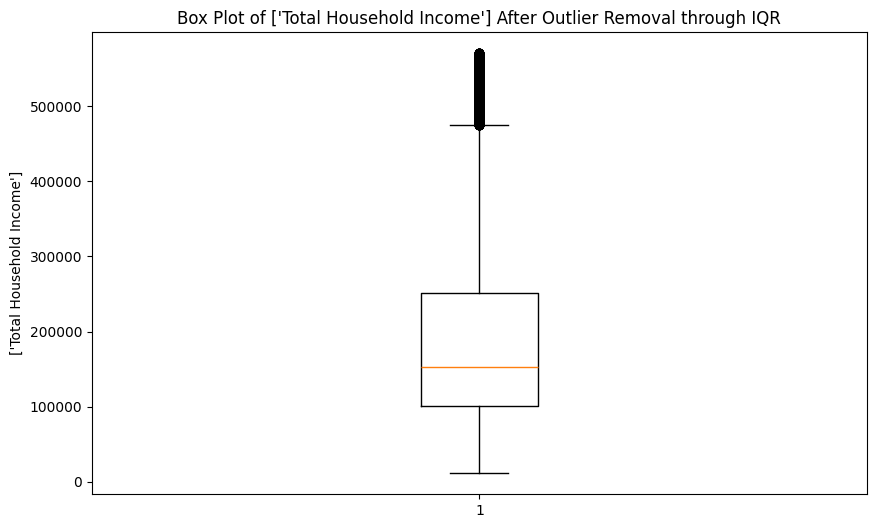

In [349]:
# Box Plot of the extracted non_outliers using matplotlib
plt.figure(figsize=(10, 6))
plt.boxplot(df_non_outliers_IQR[outlier_detection_column])
plt.title(f'Box Plot of {outlier_detection_column} After Outlier Removal through IQR')
plt.ylabel(outlier_detection_column)
plt.show()

In [350]:
df_non_outliers_IQR['Total Household Income'].describe()

,Total Household Income
count,38393.000000
mean,189885.704556
std,120551.516456
min,11285.000000
25%,101150.000000
50%,153175.000000
75%,250795.000000
max,570492.000000


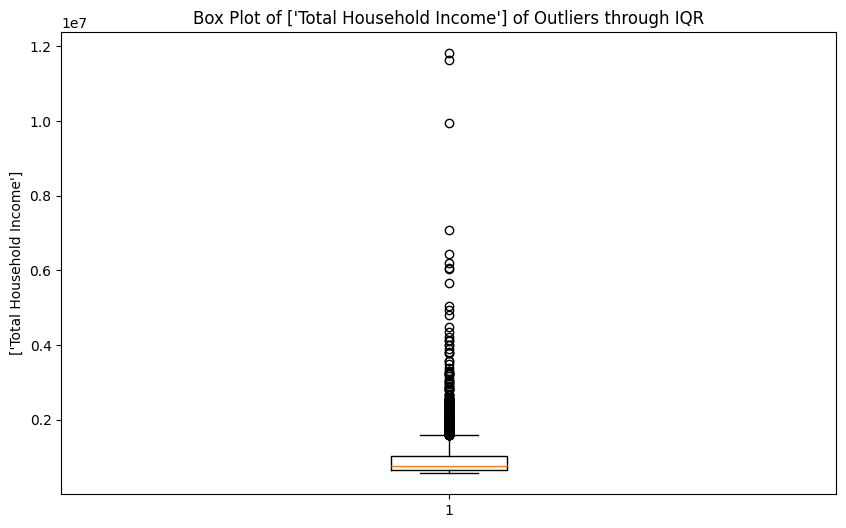

In [351]:
# Box Plot of the extracted outliers using matplotlib
plt.figure(figsize=(10, 6))
plt.boxplot(df_outliers_IQR[outlier_detection_column])
plt.title(f'Box Plot of {outlier_detection_column} of Outliers through IQR')
plt.ylabel(outlier_detection_column)
plt.show()

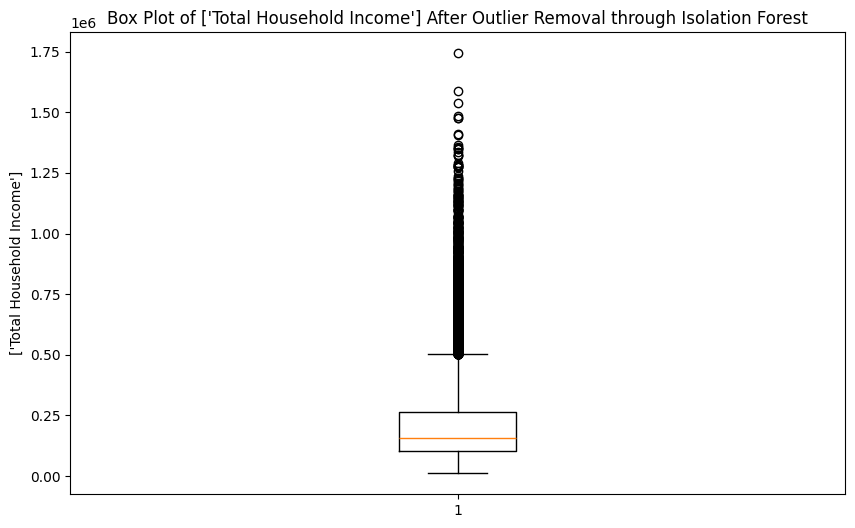

In [352]:
# Boxplot of Non_outliers detected in Isolation Forest
plt.figure(figsize=(10, 6))
plt.boxplot(df_non_outliers_iso_forest[outlier_detection_column])
plt.title(f'Box Plot of {outlier_detection_column} After Outlier Removal through Isolation Forest')
plt.ylabel(outlier_detection_column)
plt.show()

In [353]:
df_non_outliers_iso_forest['Total Household Income'].describe()

,Total Household Income
count,3.738900e+04
mean,2.091321e+05
std,1.629466e+05
min,1.128500e+04
25%,1.024600e+05
50%,1.562780e+05
75%,2.623100e+05
max,1.743278e+06


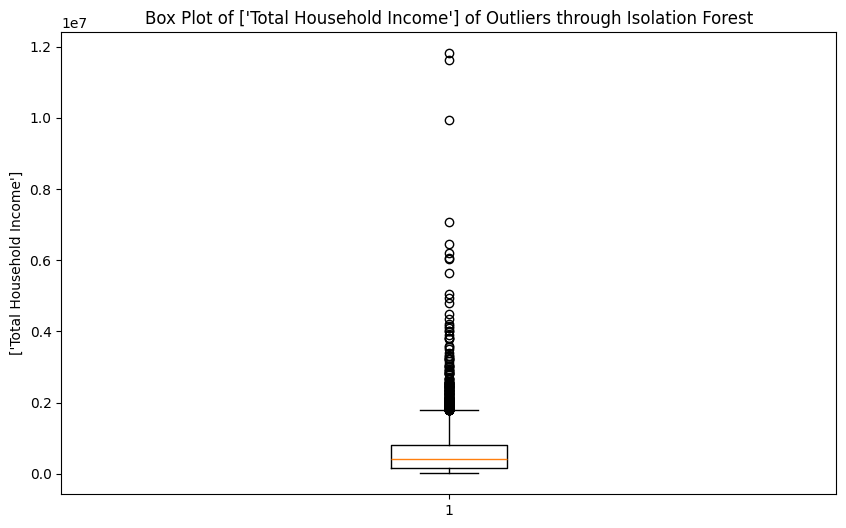

In [354]:
# Boxplot of Outliers detected in Isolation Forest
plt.figure(figsize=(10, 6))
plt.boxplot(df_outliers_iso_forest[outlier_detection_column])
plt.title(f'Box Plot of {outlier_detection_column} of Outliers through Isolation Forest')
plt.ylabel(outlier_detection_column)
plt.show()

> Key Insights from Outlier Detection
- IQR caps the income values to less than 600,000
- Isolation Forest has income values from 0 to 160,000
- IQR handles outlier better than Isolation Forest when it comes to covering more families from varying income levels that are not overly extreme.
- Final selected outlier removal step: IQR

## Data Scaling and Transformations

In [355]:
# Power Transform to Reduce Skewness
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='yeo-johnson')
df_orig[numerical_columns] = pt.fit_transform(df_orig[numerical_columns])
df_non_outliers_IQR[numerical_columns] = pt.fit_transform(df_non_outliers_IQR[numerical_columns])

In [356]:
# Scale numerical Features for clustering Analysis
scaler = StandardScaler()
# scaler = MinMaxScaler()
df_orig[numerical_columns] = scaler.fit_transform(df_orig[numerical_columns])
df_non_outliers_IQR[numerical_columns] = scaler.fit_transform(df_non_outliers_IQR[numerical_columns])

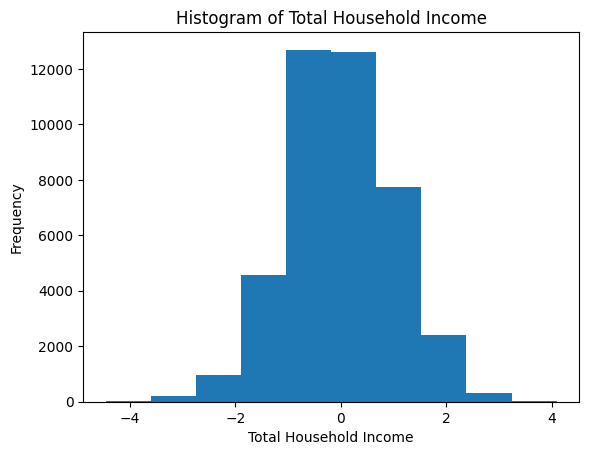

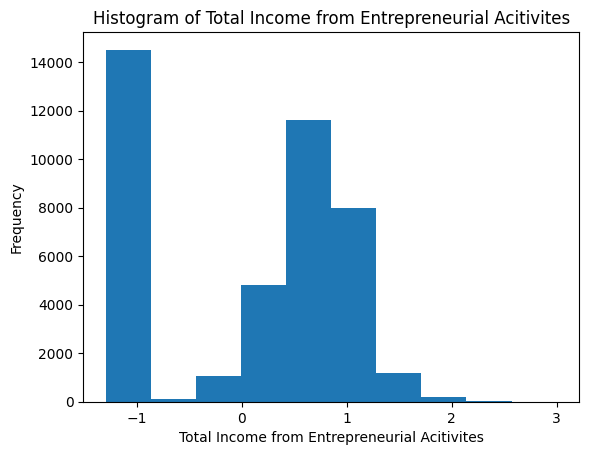

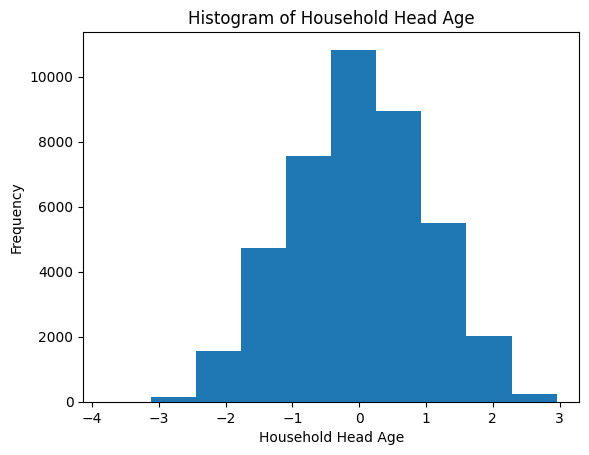

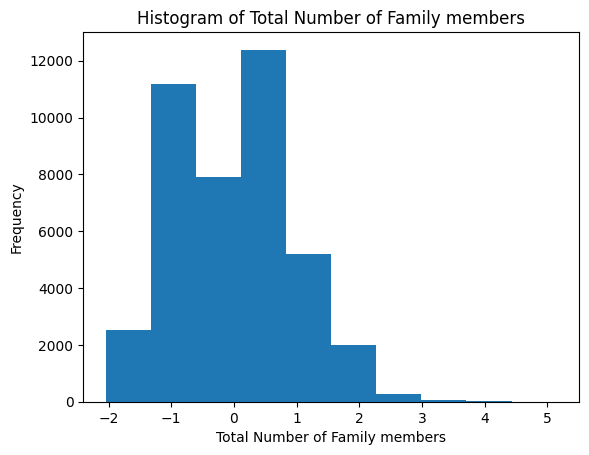

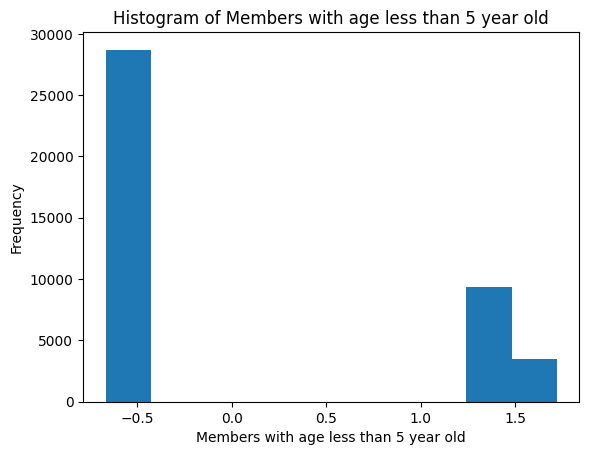

...

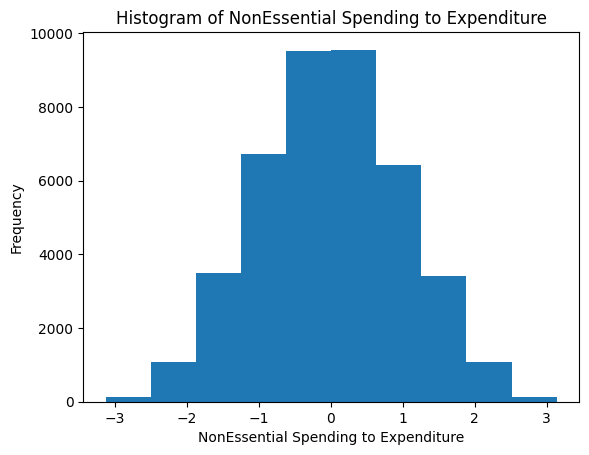

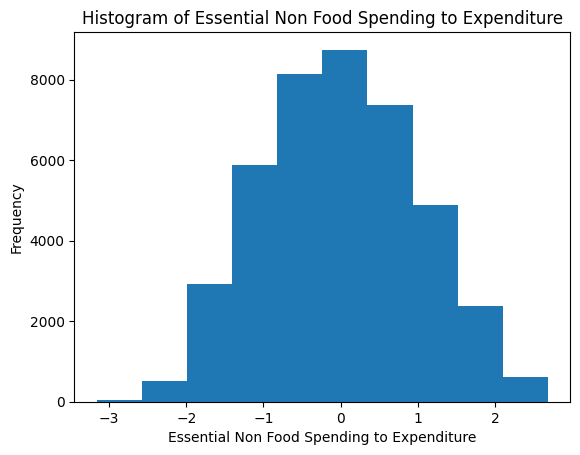

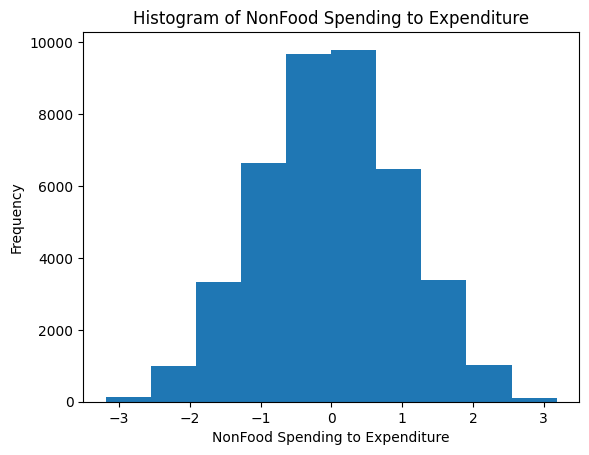

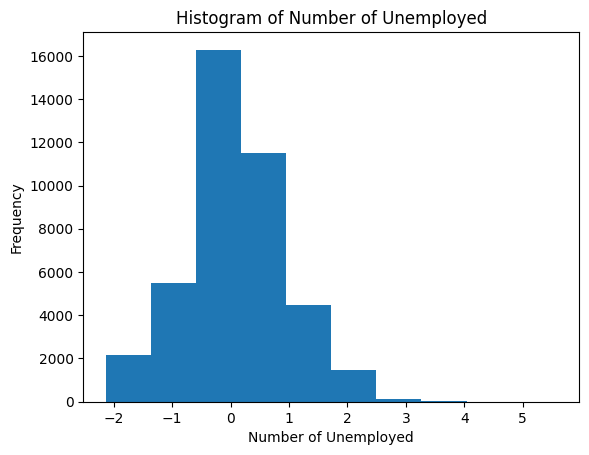

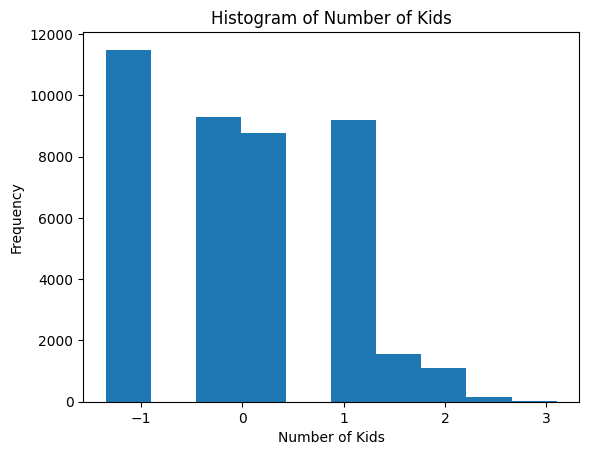

In [357]:
# Histogram for all Numerical Columns, individually
for col in numerical_columns:
    plt.hist(df_orig[col])
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

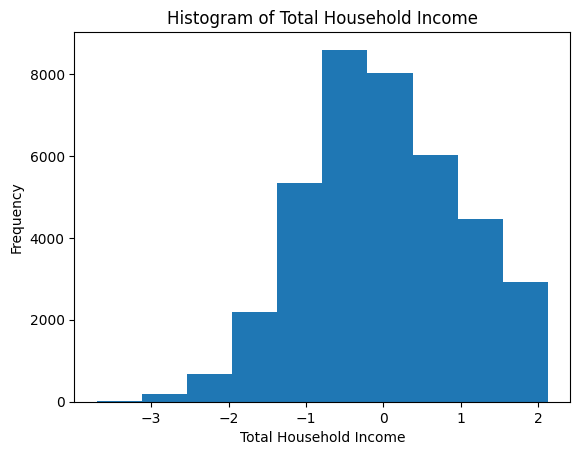

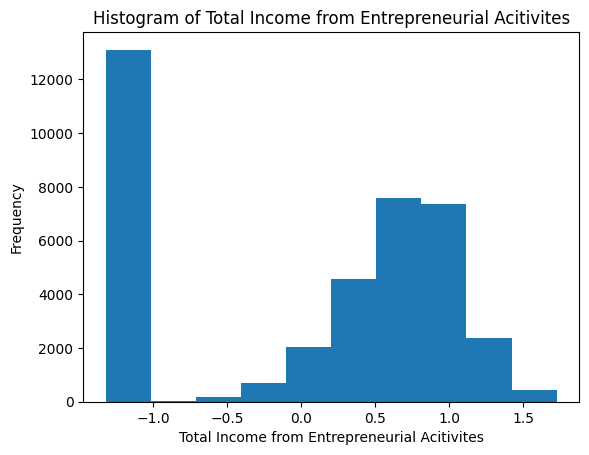

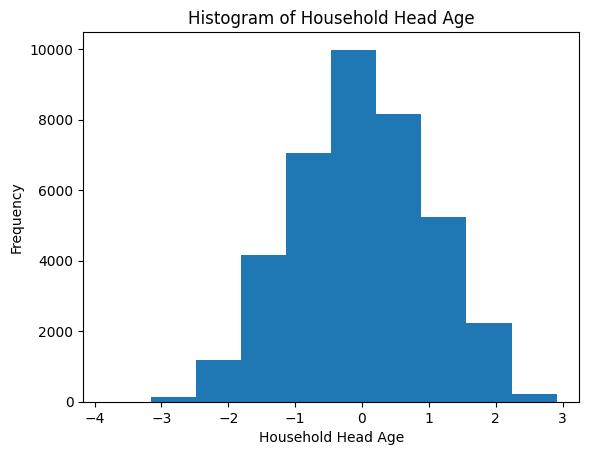

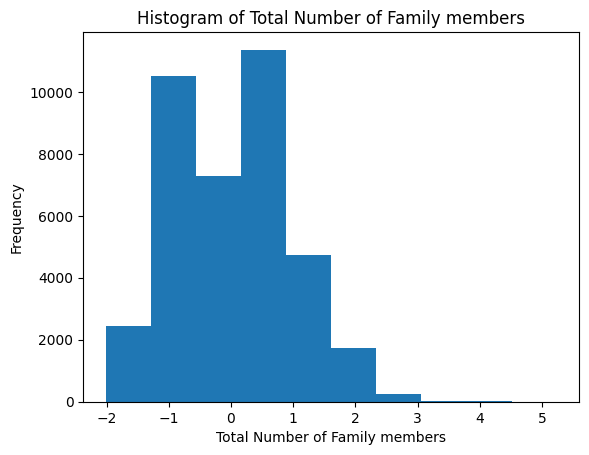

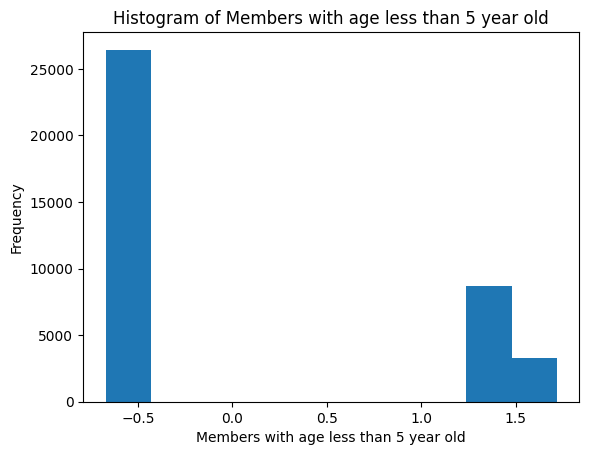

...

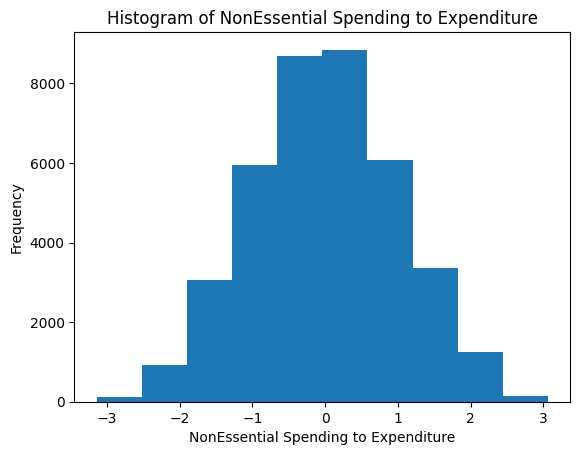

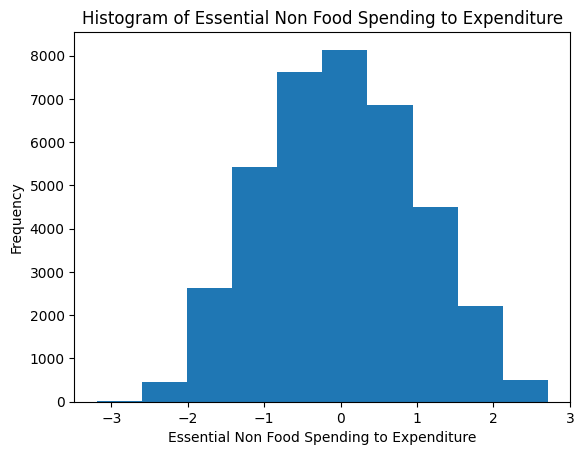

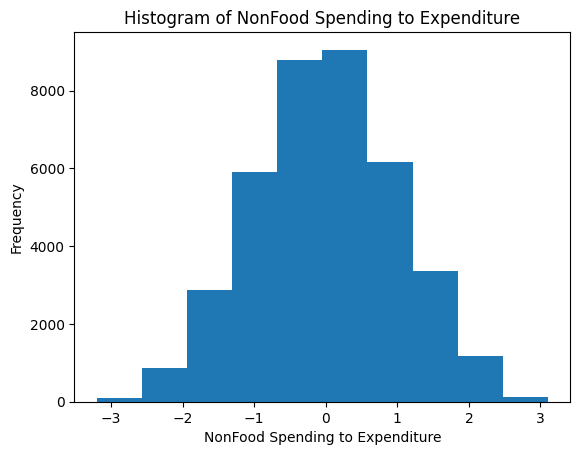

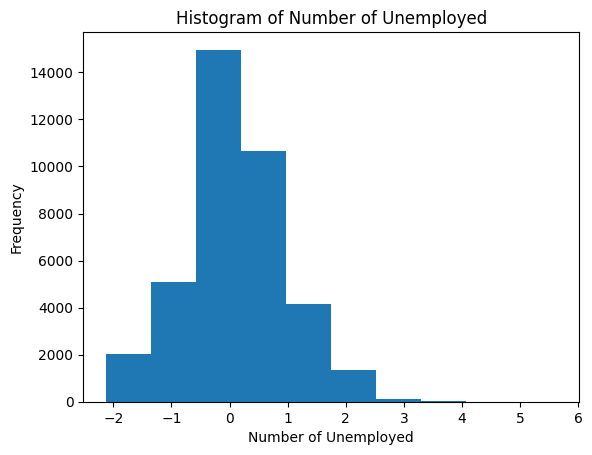

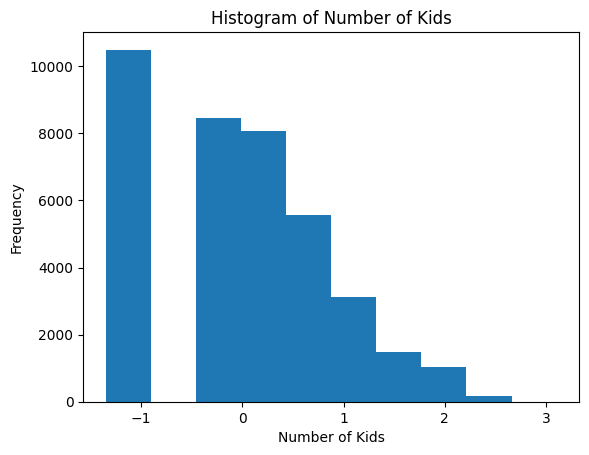

In [358]:
# Histogram for all Numerical Columns, individually
for col in numerical_columns:
    plt.hist(df_non_outliers_IQR[col])
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

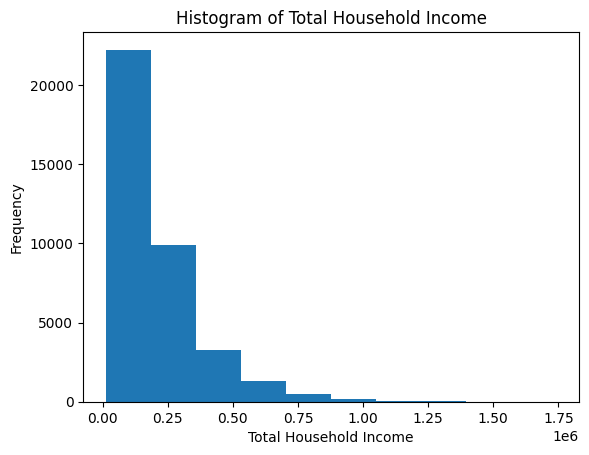

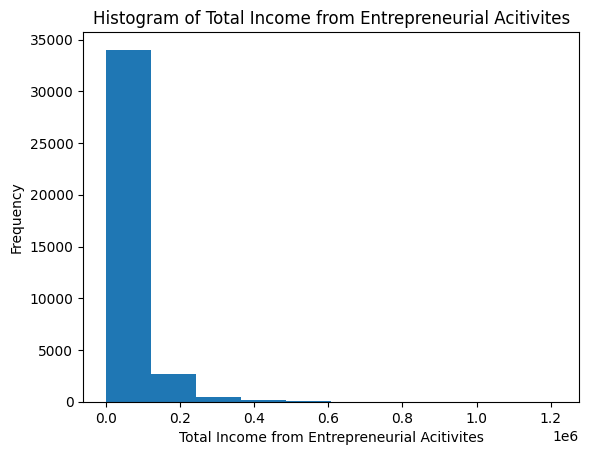

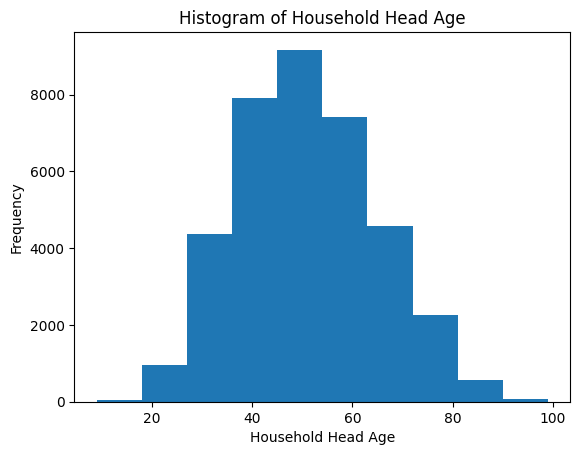

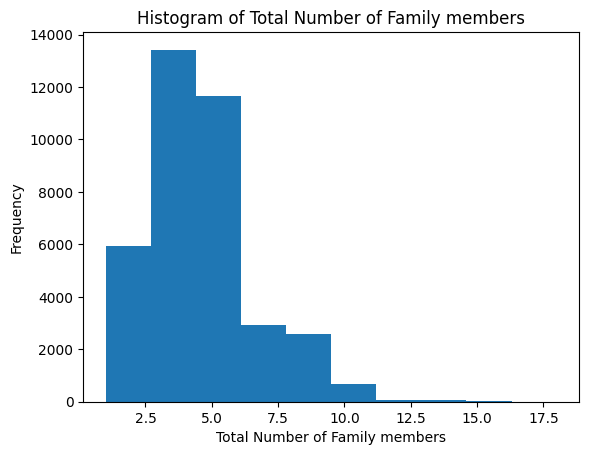

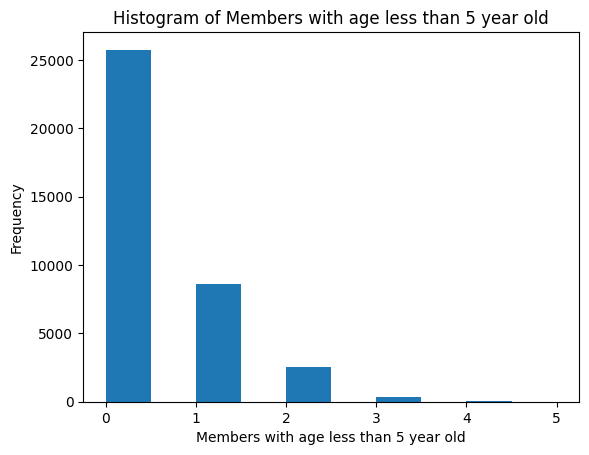

...

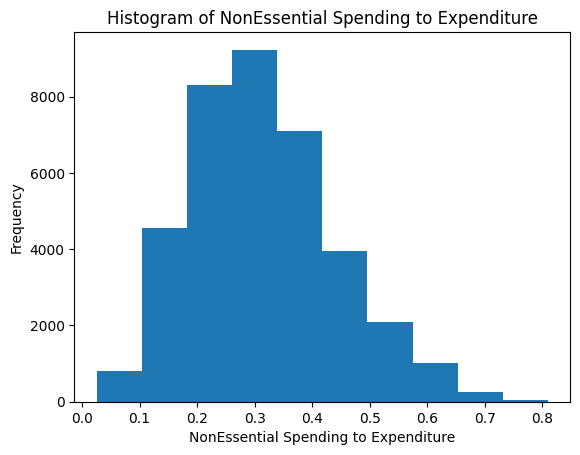

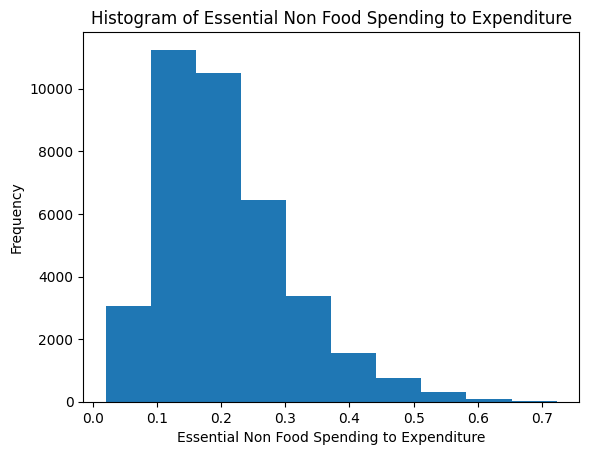

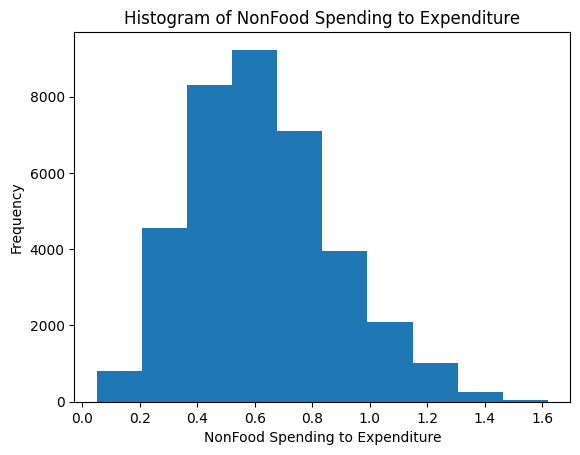

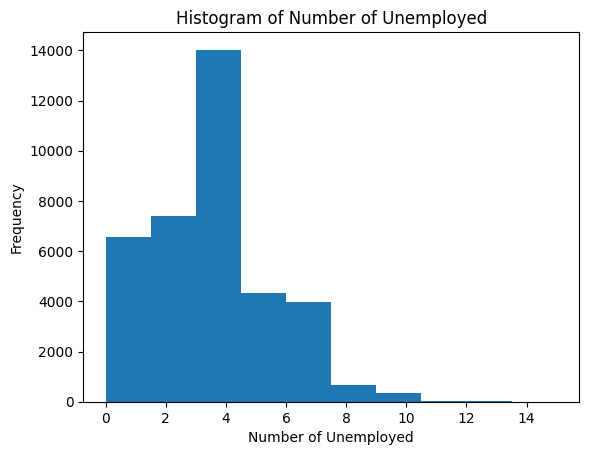

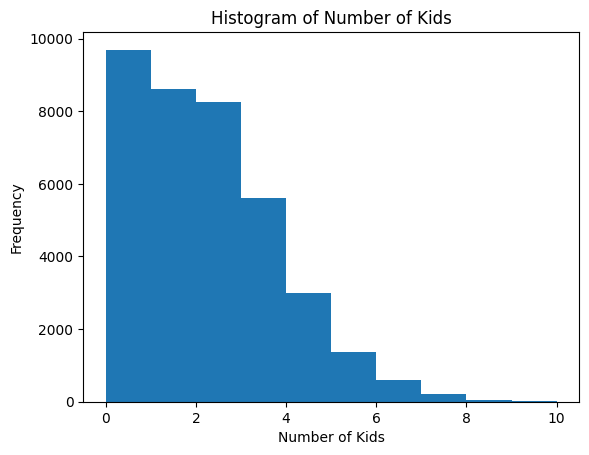

In [359]:
# Histogram for all Numerical Columns, individually
for col in numerical_columns:
    plt.hist(df_non_outliers_iso_forest[col])
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [360]:
categorical_columns

Index(['Region', 'Main Source of Income', 'Household Head Sex',
       'Household Head Marital Status',
       'Household Head Highest Grade Completed',
       'Household Head Job or Business Indicator', 'Household Head Occupation',
       'Household Head Class of Worker', 'Type of Household',
       'Type of Building/House', 'Type of Roof', 'Type of Walls',
       'Tenure Status', 'Toilet Facilities', 'Main Source of Water Supply'],
      dtype='object')

In [361]:
df_copy.columns

Index(['Total Household Income', 'Agricultural Household indicator',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Age',
       'Household Head Marital Status',
       'Household Head Highest Grade Completed', 'Household Head Occupation',
       'Household Head Class of Worker', 'Total Number of Family members',
       'Members with age less than 5 year old',
       'Members with age 5 - 17 years old',
       'Total number of family members employed', 'Meat Ratio', 'Fish Ratio',
       'Fruit Ratio', 'Vegetables Ratio', 'Bread and Cereals Ratio',
       'Rice Ratio', 'Other Bread and Cereals Ratio', 'Food Ratio',
       'Housing and water Ratio', 'Alcoholic Beverages Ratio', 'Tobacco Ratio',
       'Clothing and Footwear Ratio', 'Miscellaneous Goods and Services Ratio',
       'Special Occasions Ratio', 'Restaurant and hotels Ratio',
       'Crop Farming and Gardening Ratio', 'Medical Care Ratio',
       'Education Ratio', 'Communication Ratio', 'Transportation

In [363]:
# Fetch feature engineered cat columns. Include Binary Indicators
feature_engineered_cat_columns = ['Household Head Marital Status',
       'Household Head Highest Grade Completed', 'Household Head Occupation',
       'Household Head Class of Worker', 'Main Source of Income_Other sources of Income',
       'Main Source of Income_Wage/Salaries', 'Household Head Sex_Male',
       'Household Head Job or Business Indicator_With Job/Business',
       'Type of Household_Single Family',
       'Type of Household_Two or More Nonrelated Persons/Members']

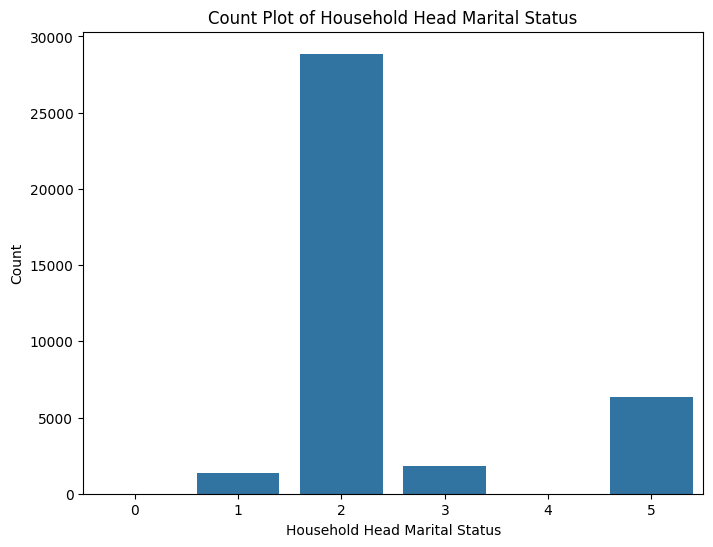

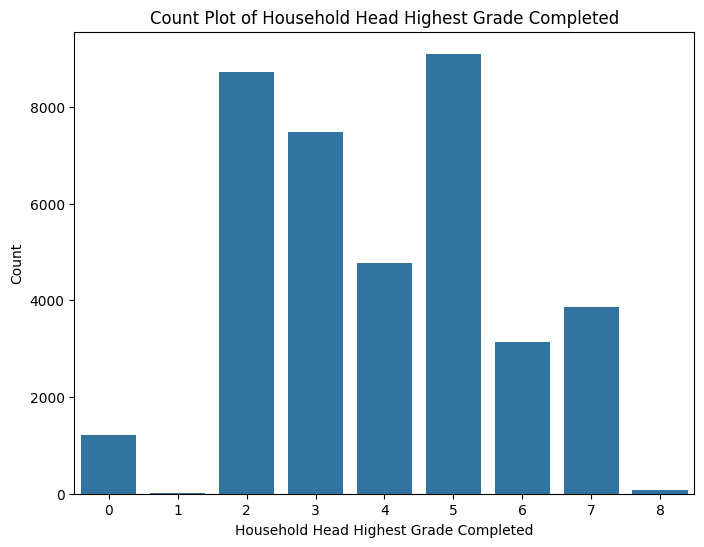

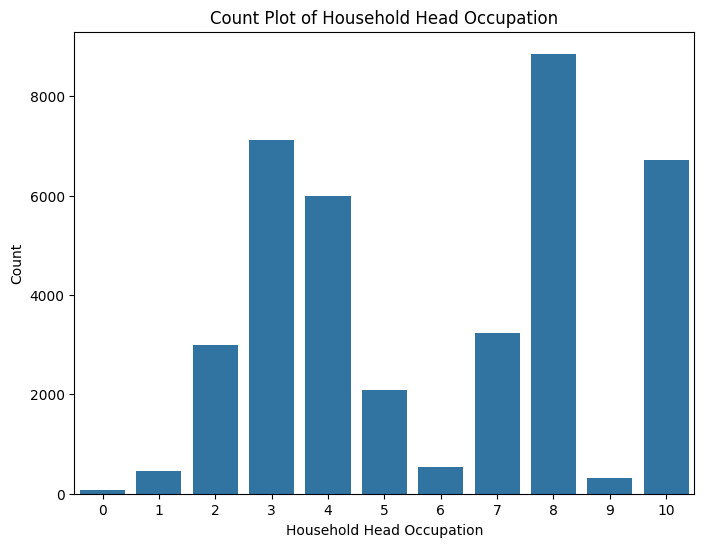

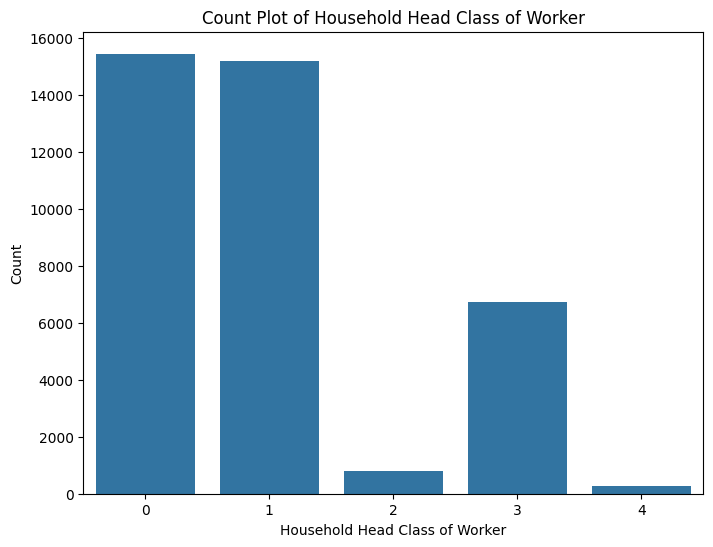

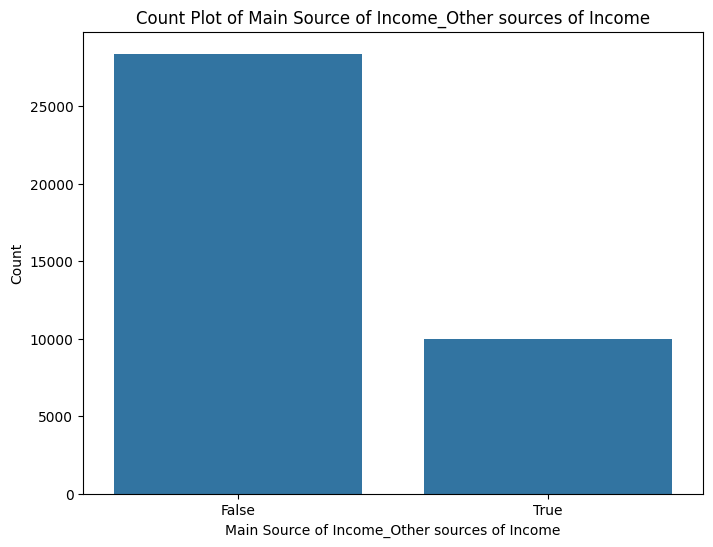

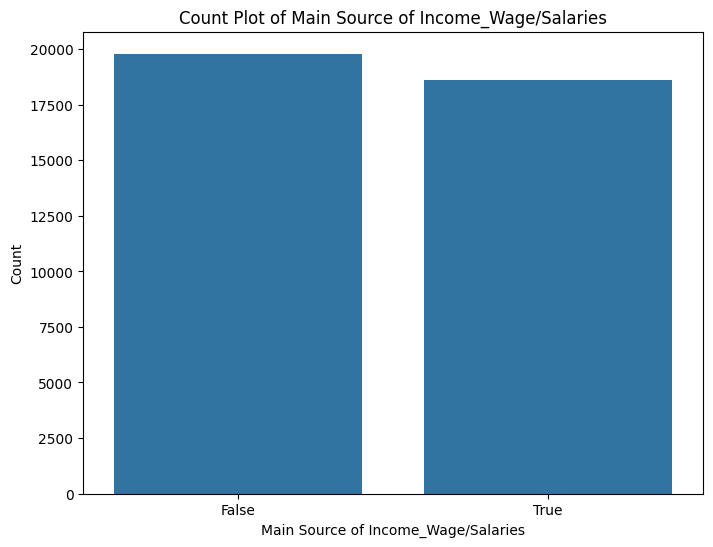

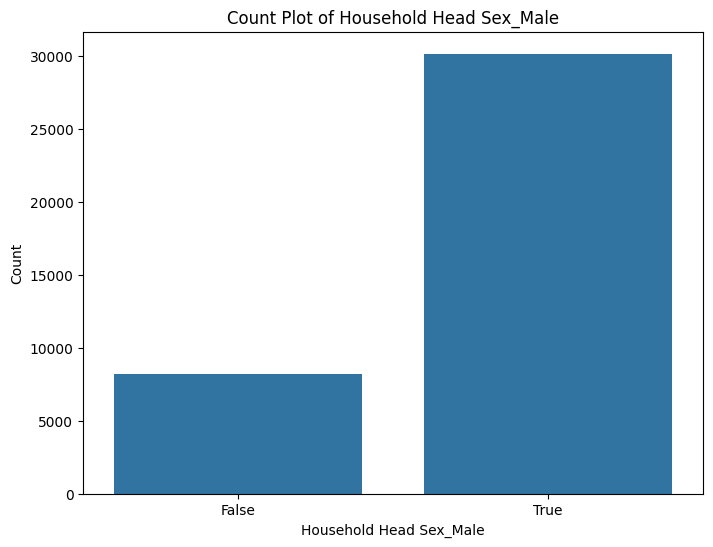

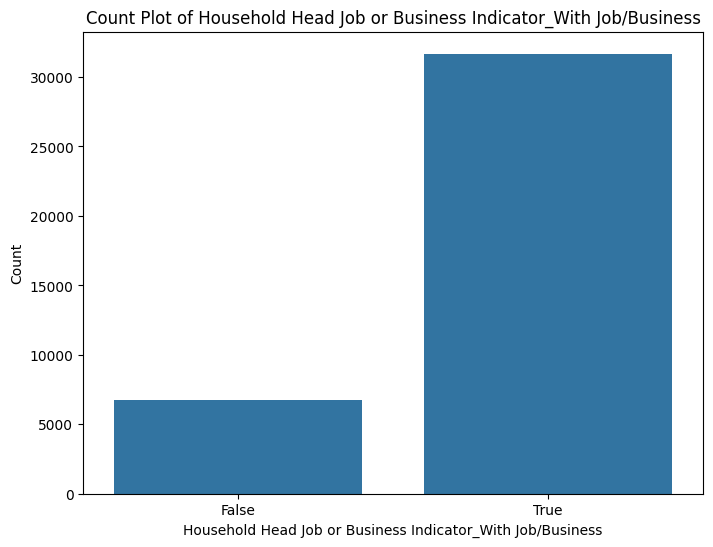

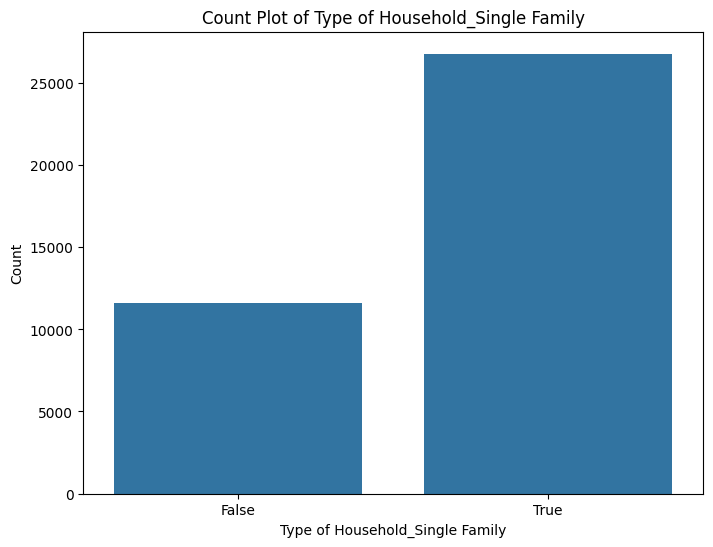

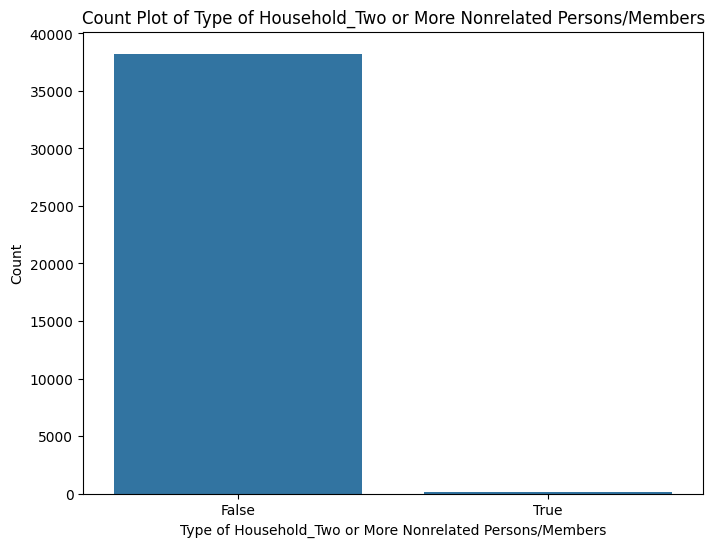

In [364]:
for col in feature_engineered_cat_columns:
    plt.figure(figsize=(8, 6))
    sns.countplot(data=df_non_outliers_IQR, x=col)
    plt.title(f'Count Plot of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')



> Key Insights after Feature Engineering
- Skew from some numerical columns have been transformed.
- Some numerical columns have no clear distribution or are Zero-inflated despite Yeo-Johnson Transformation. Included Categorical Binning in Feature Engineering
- Toilet Facilities, Tenure Status, Type of Walls, Type of Roof, and Main Source of Water Supply have one or two defining features that overwhelm their counterparts. Binned to a general group but could possibly be omitted


# Automated Feature Selection

Original Number of Features = 60

Original Expenditure Features = 20

Original Income Features = 2

In [365]:
selected_features_rfevc = []
selected_features_mutual_info = []
selected_features_rfr = []
number_of_features_to_check = []

In [366]:
X = df_orig.drop('Total Household Income', axis=1)
y = df_orig['Total Household Income']
X_IQR = df_non_outliers_IQR.drop('Total Household Income', axis=1)
y_IQR = df_non_outliers_IQR['Total Household Income']
X_iso = df_non_outliers_iso_forest.drop('Total Household Income', axis=1)
y_iso = df_non_outliers_iso_forest['Total Household Income']

In [367]:
# Use Regression Model for Feature Selection
def rfevc_features_selected(X, y, features_to_select):
  print(f'Test DF')
  min_features_to_select = features_to_select  # Minimum number of features to consider
  clf = Ridge()
  cv = KFold(5) # Changed to KFold which is suitable for regression

  rfecv = RFECV(
      estimator=clf,
      step=1,
      cv=cv,
      scoring="neg_mean_squared_error", # Changed scoring metric to a suitable one for Regression
      min_features_to_select=min_features_to_select,
      n_jobs=2,
  )
  rfecv.fit(X, y)
  selected_inc_features = X.columns[rfecv.support_]
  selected_features_rfevc.append(selected_inc_features)
  print(f"Optimal number of features: {rfecv.n_features_}")
  number_of_features_to_check.append(rfecv.n_features_)
  min_features_to_select = rfecv.n_features_ + 1

In [368]:
rfevc_features_selected(X, y, 5)
rfevc_features_selected(X_IQR, y_IQR, 5)
rfevc_features_selected(X_iso, y_iso, 5)

Test DF
Optimal number of features: 51
Test DF
Optimal number of features: 50
Test DF
Optimal number of features: 51


In [369]:
number_of_features_to_check

[51, 50, 51]

In [370]:
def mutual_info_features_selected(X, y, number_of_features):
  print(f"Number of Features to Check: {number_of_features}")
  threshold = number_of_features  # the number of most relevant features
  high_score_features = []
  feature_scores = mutual_info_regression(X, y, random_state=0)
  for score, f_name in sorted(zip(feature_scores, X.columns), reverse=True)[:threshold]:
    high_score_features.append(f_name)
  selected_df = X[high_score_features]
  selected_features_mutual_info.append(selected_df.columns)

In [371]:
print('Original Data')
mutual_info_features_selected(X, y, number_of_features_to_check[0])
print("- " * 20)
print('Non-Outlier Data - IQR')
mutual_info_features_selected(X_IQR, y_IQR, number_of_features_to_check[1])
print("- " * 20)
print('Non-Outlier Data - Isolation Forest')
mutual_info_features_selected(X_iso, y_iso, number_of_features_to_check[2])

Original Data
Number of Features to Check: 51
- - - - - - - - - - - - - - - - - - - - 
Non-Outlier Data - IQR
Number of Features to Check: 50
- - - - - - - - - - - - - - - - - - - - 
Non-Outlier Data - Isolation Forest
Number of Features to Check: 51


In [372]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

model_rf = RandomForestRegressor(random_state=42)
'''
param_grid = {
    'n_estimators': [100, 200, 500],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
}

grid_search = GridSearchCV(
    estimator=model_rf,
    param_grid=param_grid,
    cv=5,  # 5-fold cross-validation
    n_jobs=-1,  # Use all available CPU cores
    verbose=2
)

grid_search.fit(X, y)
print(grid_search.best_params_)'''

"\nparam_grid = {\n    'n_estimators': [100, 200, 500],  \n    'max_depth': [None, 10, 20],  \n    'min_samples_split': [2, 5],  \n    'min_samples_leaf': [1, 2],  \n}\n\ngrid_search = GridSearchCV(\n    estimator=model_rf,\n    param_grid=param_grid,\n    cv=5,  # 5-fold cross-validation\n    n_jobs=-1,  # Use all available CPU cores\n    verbose=2\n)\n\ngrid_search.fit(X, y)\nprint(grid_search.best_params_)"

In [ ]:
# print(grid_search.best_params_)

{'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


In [373]:
model_rf = RandomForestRegressor(max_depth= None, min_samples_leaf = 1, min_samples_split = 2, n_estimators=  100)
model_rf.fit(X, y)

sel_sfm = SelectFromModel(model_rf, prefit=True)
sel_sfm_index = sel_sfm.get_support()
selected_rfe_features = X.iloc[:, sel_sfm_index]
print(selected_rfe_features.columns)
selected_features_rfr.append(selected_rfe_features.columns)

Index(['Total Number of Family members', 'Remaining_Income',
       'Per Capita Income'],
      dtype='object')


In [374]:
# Check accuracy of model
from sklearn.metrics import mean_squared_error, r2_score

y_pred = model_rf.predict(X)
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print("Mean Squared Error:", mse)
rmse = mse ** 0.5
print("Root Mean Squared Error:", rmse)
print("R-squared:", r2)

Mean Squared Error: 4.415147228468718e-05
Root Mean Squared Error: 0.006644657424178253
R-squared: 0.9999558485277154


In [375]:
model_rf = RandomForestRegressor(max_depth= None, min_samples_leaf = 1, min_samples_split = 2, n_estimators=  100)
model_rf.fit(X_IQR, y_IQR)

sel_sfm = SelectFromModel(model_rf, prefit=True)
sel_sfm_index = sel_sfm.get_support()
selected_rfe_features = X_IQR.iloc[:, sel_sfm_index]
print(selected_rfe_features.columns)
selected_features_rfr.append(selected_rfe_features.columns)

Index(['Total Number of Family members', 'Per Capita Income'], dtype='object')


In [376]:
# Check accuracy of model
from sklearn.metrics import mean_squared_error, r2_score

y_pred = model_rf.predict(X_IQR)
mse = mean_squared_error(y_IQR, y_pred)
r2 = r2_score(y_IQR, y_pred)

print("Mean Squared Error:", mse)
rmse = mse ** 0.5
print("Root Mean Squared Error:", rmse)
print("R-squared:", r2)

Mean Squared Error: 2.9110285854670576e-05
Root Mean Squared Error: 0.005395394874767793
R-squared: 0.9999708897141454


In [379]:
model_rf = RandomForestRegressor(max_depth= None, min_samples_leaf = 1, min_samples_split = 2, n_estimators=  100)
model_rf.fit(X_iso, y_iso)

sel_sfm = SelectFromModel(model_rf, prefit=True)
sel_sfm_index = sel_sfm.get_support()
selected_rfe_features = X_iso.iloc[:, sel_sfm_index]
print(selected_rfe_features.columns)
selected_features_rfr.append(selected_rfe_features.columns)

Index(['Total Number of Family members', 'Remaining_Income',
       'Savings to Income Ratio', 'Per Capita Income',
       'Expenditure to Income Ratio'],
      dtype='object')


In [380]:
# Check accuracy of model
from sklearn.metrics import mean_squared_error, r2_score

y_pred = model_rf.predict(X_iso)
mse = mean_squared_error(y_iso, y_pred)
r2 = r2_score(y_iso, y_pred)

print("Mean Squared Error:", mse)
rmse = mse ** 0.5
print("Root Mean Squared Error:", rmse)
print("R-squared:", r2)

Mean Squared Error: 9597852.618655225
Root Mean Squared Error: 3098.0401254107774
R-squared: 0.999638511160653


In [381]:
# Check for intersection of columns extracted for rfevc, skb, and mutual_info
print(set(selected_features_rfevc[0]) & set(selected_features_mutual_info[0]))

{'Essential Spending to Expenditure', 'Special Occasions Ratio', 'Restaurant and hotels Ratio', 'Total number of family members employed', 'Amount_Outside_Income', 'Per Capita Expenditure', 'Household Head Job or Business Indicator_With Job/Business', 'Type of Household_Two or More Nonrelated Persons/Members', 'Main Source of Income_Wage/Salaries', 'Fish Ratio', 'Other Bread and Cereals Ratio', 'Education Ratio', 'Household Head Age', 'Remaining_Income', 'Meat Ratio', 'Household Head Sex_Male', 'Household Head Highest Grade Completed', 'Alcoholic Beverages Ratio', 'Agricultural Household indicator', 'Housing and water Ratio', 'House Rental Ratio', 'NonEssential Spending to Expenditure', 'Medical Care Ratio', 'Bread and Cereals Ratio', 'Transportation Ratio', 'NonFood Spending to Expenditure', 'Number of Unemployed', 'Debt to Income Ratio', 'Number of Kids', 'Food Ratio', 'Savings to Income Ratio', 'Household Head Occupation', 'Per Capita Income', 'Members with age 5 - 17 years old', 'T

In [382]:
common_features_rfevc_mutual_info = []

In [383]:
for i in range(len(selected_features_rfevc)):
  print(set(selected_features_rfevc[i]) & set(selected_features_mutual_info[i]))
  common_features_rfevc_mutual_info.append(set(selected_features_rfevc[i]) & set(selected_features_mutual_info[i]))

{'Essential Spending to Expenditure', 'Special Occasions Ratio', 'Restaurant and hotels Ratio', 'Total number of family members employed', 'Amount_Outside_Income', 'Per Capita Expenditure', 'Household Head Job or Business Indicator_With Job/Business', 'Type of Household_Two or More Nonrelated Persons/Members', 'Main Source of Income_Wage/Salaries', 'Fish Ratio', 'Other Bread and Cereals Ratio', 'Education Ratio', 'Household Head Age', 'Remaining_Income', 'Meat Ratio', 'Household Head Sex_Male', 'Household Head Highest Grade Completed', 'Alcoholic Beverages Ratio', 'Agricultural Household indicator', 'Housing and water Ratio', 'House Rental Ratio', 'NonEssential Spending to Expenditure', 'Medical Care Ratio', 'Bread and Cereals Ratio', 'Transportation Ratio', 'NonFood Spending to Expenditure', 'Number of Unemployed', 'Debt to Income Ratio', 'Number of Kids', 'Food Ratio', 'Savings to Income Ratio', 'Household Head Occupation', 'Per Capita Income', 'Members with age 5 - 17 years old', 'T

In [384]:
# Check number of features per intersecting sets
for i in range(len(common_features_rfevc_mutual_info)):
  print(len(common_features_rfevc_mutual_info[i]))

51
49
51


In [385]:
df_orig_feature_rfevc = df_orig[list(selected_features_rfevc[0])]
df_orig_feature_rfr = df_orig[list(selected_features_rfr[0])]
df_orig_feature_mutual_info = df_orig[list(selected_features_mutual_info[0])]

df_non_outliers_IQR_feature_rfevc = df_non_outliers_IQR[list(selected_features_rfevc[1])]
df_non_outliers_IQR_feature_rfr = df_non_outliers_IQR[list(selected_features_rfr[1])]
df_non_outliers_IQR_feature_mutual_info = df_non_outliers_IQR[list(selected_features_mutual_info[1])]

df_non_outliers_iso_forest_feature_rfevc = df_non_outliers_iso_forest[list(selected_features_rfevc[2])]
df_non_outliers_iso_forest_feature_rfr = df_non_outliers_iso_forest[list(selected_features_rfr[2])]
df_non_outliers_iso_forest_feature_mutual_info = df_non_outliers_iso_forest[list(selected_features_mutual_info[2])]

In [386]:
number_of_features_to_check

[51, 50, 51]

In [388]:
df_orig_combined = df_orig[list(common_features_rfevc_mutual_info[0])]
df_non_outliers_IQR_combined = df_non_outliers_IQR[list(common_features_rfevc_mutual_info[1])]
df_non_outliers_iso_forest_combined = df_non_outliers_iso_forest[list(common_features_rfevc_mutual_info[2])]

In [389]:
df_list_no_pca = [df_orig, df_non_outliers_IQR, df_non_outliers_iso_forest,
                  df_orig_feature_rfevc, df_orig_feature_rfr, df_orig_feature_mutual_info,
                  df_non_outliers_IQR_feature_rfevc, df_non_outliers_IQR_feature_rfr, df_non_outliers_IQR_feature_mutual_info,
                  df_non_outliers_iso_forest_feature_rfevc, df_non_outliers_iso_forest_feature_rfr, df_non_outliers_iso_forest_feature_mutual_info,
                  df_orig_combined,
                  df_non_outliers_IQR_combined, df_non_outliers_iso_forest_combined,
                  ]

In [390]:
df_orig_pca = df_orig.copy()
df_non_outliers_IQR_pca = df_non_outliers_IQR.copy()
df_non_outliers_iso_forest_pca = df_non_outliers_iso_forest.copy()

df_orig_feature_rfevc_pca = df_orig_feature_rfevc.copy()
df_orig_feature_rfr_pca = df_orig_feature_rfr.copy()
df_orig_feature_mutual_info_pca = df_orig_feature_mutual_info.copy()

df_non_outliers_IQR_feature_rfevc_pca = df_non_outliers_IQR_feature_rfevc.copy()
df_non_outliers_IQR_feature_rfr_pca = df_non_outliers_IQR_feature_rfr.copy()
df_non_outliers_IQR_feature_mutual_info_pca = df_non_outliers_IQR_feature_mutual_info.copy()

df_non_outliers_iso_forest_feature_rfevc_pca = df_non_outliers_iso_forest_feature_rfevc.copy()
df_non_outliers_iso_forest_feature_rfr_pca = df_non_outliers_iso_forest_feature_rfr.copy()
df_non_outliers_iso_forest_feature_mutual_info_pca = df_non_outliers_iso_forest_feature_mutual_info.copy()

df_orig_combined_pca = df_orig_combined.copy()
df_non_outliers_IQR_combined_pca = df_non_outliers_IQR_combined.copy()
df_non_outliers_iso_forest_combined_pca = df_non_outliers_iso_forest_combined.copy()

In [391]:
df_list_with_pca = [df_orig_pca, df_non_outliers_IQR_pca, df_non_outliers_iso_forest_pca,
                  df_orig_feature_rfevc_pca, df_orig_feature_rfr_pca, df_orig_feature_mutual_info_pca,
                  df_non_outliers_IQR_feature_rfevc_pca, df_non_outliers_IQR_feature_rfr_pca, df_non_outliers_IQR_feature_mutual_info_pca,
                  df_non_outliers_iso_forest_feature_rfevc_pca, df_non_outliers_iso_forest_feature_rfr_pca, df_non_outliers_iso_forest_feature_mutual_info_pca,
                  df_orig_combined_pca,
                  df_non_outliers_IQR_combined_pca,  df_non_outliers_iso_forest_combined_pca]

In [392]:
len(df_list_no_pca)

15

In [393]:
len(df_list_with_pca)

15

# Dimensionality Reduction

In [394]:
# Use PCA
from sklearn.decomposition import PCA

def conduct_PCA(df, index_of_df):
  print(f"PCA for DataFrame at {index_of_df}")
  pca = PCA(n_components=df.shape[1])
  df_pca = pca.fit_transform(df)
  cumsum = np.cumsum(pca.explained_variance_ratio_)
  print(cumsum)
  d = np.argmax(cumsum >= 0.90) + 1
  print("dimension : ", d)

  explained_variance = pca.explained_variance_ratio_
  cumulative_variance = np.cumsum(explained_variance)
  plt.plot(range(1, len(explained_variance) + 1), cumulative_variance)
  plt.xlabel('Number of Components')
  plt.ylabel('Cumulative Explained Variance')
  plt.title(f'Scree Plot for DataFrame at {index_of_df}')
  plt.show()

  #If d = 1 and cumulative_variance > 90, train final PCA with 2, else if cumulative variance < 90, use d
  if d == 1 and cumulative_variance[-1] > 0.90:
    pca = PCA(n_components=2)
  elif cumulative_variance[-1] < 0.90:
    pca = PCA(n_components=24)
  else:
    pca = PCA(n_components=d)
  df_pca = pca.fit_transform(df)
  df_list_with_pca[index_of_df] = df_pca

PCA for DataFrame at 0
[0.16742566 0.32791204 0.4327442  0.50624761 0.56045859 0.60294627
 0.63434652 0.66182947 0.68652158 0.71098318 0.73143813 0.75137745
 0.77037828 0.78778518 0.80412983 0.8197711  0.83466966 0.84882414
 0.86216782 0.87447358 0.88619291 0.89741924 0.90850759 0.91916129
 0.92904774 0.93813985 0.94579759 0.95318357 0.96004527 0.96567974
 0.97101767 0.97589554 0.98009695 0.98373716 0.98720433 0.99008224
 0.99269368 0.99431754 0.99569675 0.99667723 0.99753865 0.99821118
 0.99863522 0.99901287 0.99937763 0.99968629 0.99981669 0.99989956
 0.99996996 0.99999736 0.99999999 1.        ]
dimension :  23


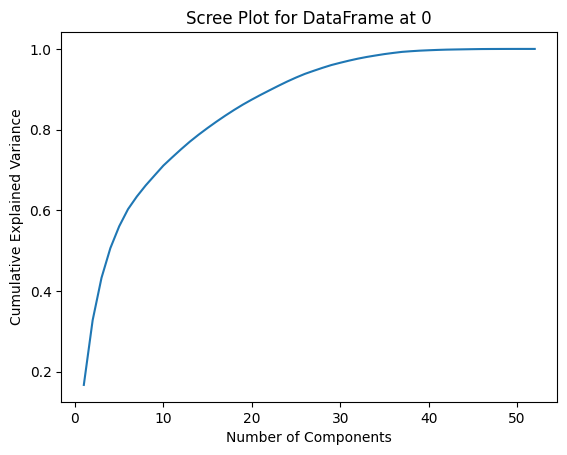

PCA for DataFrame at 1
[0.16738636 0.31934608 0.42376367 0.49835318 0.55349149 0.59608776
 0.62762003 0.65636067 0.68170897 0.70657322 0.72724098 0.74760781
 0.76705204 0.78459353 0.80122965 0.81732173 0.83254027 0.84698658
 0.86041721 0.87290098 0.88489116 0.89640022 0.90757726 0.91844044
 0.92851202 0.93789005 0.94586595 0.95314961 0.95997642 0.96557448
 0.97103977 0.9758654  0.98005765 0.98380358 0.98736352 0.99020098
 0.99278392 0.99436524 0.99575025 0.99677452 0.997639   0.99828678
 0.99872765 0.99908989 0.99944456 0.99974775 0.99986334 0.99993032
 0.99997946 0.99999719 0.99999999 1.        ]
dimension :  23


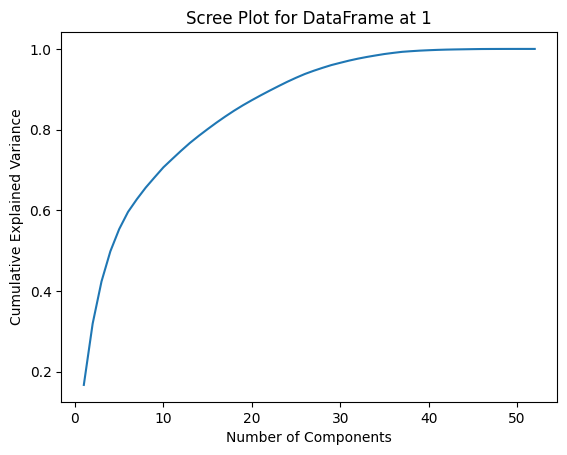

PCA for DataFrame at 2
[0.79580867 0.90036179 0.95064828 0.98634614 0.99922277 0.99999999
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.        ]
dimension :  2


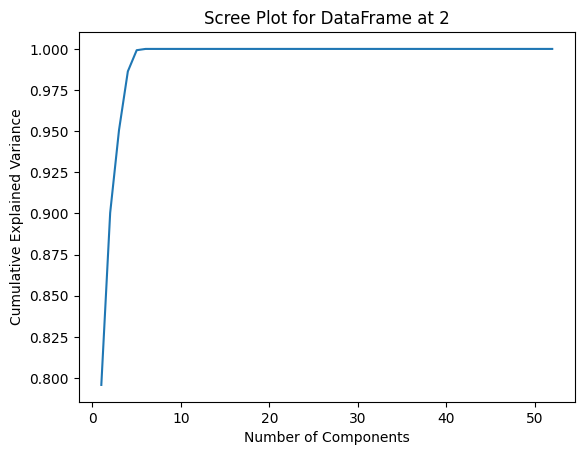

PCA for DataFrame at 3
[0.16604909 0.32647111 0.42977795 0.50234628 0.55726563 0.60051409
 0.63134037 0.6591746  0.68431424 0.70864991 0.72947202 0.74976318
 0.7689217  0.78654596 0.80318664 0.81910096 0.83426861 0.84862289
 0.86213419 0.87461926 0.88651704 0.89791276 0.9091999  0.91980838
 0.92980153 0.93905651 0.94657997 0.95404942 0.96049804 0.96610639
 0.9714311  0.97602039 0.98019649 0.98384369 0.9873489  0.99025577
 0.99287391 0.9945246  0.99592416 0.99691563 0.99778728 0.99846529
 0.99889368 0.99926544 0.99957973 0.99981225 0.99989764 0.99996936
 0.99999728 0.99999999 1.        ]
dimension :  23


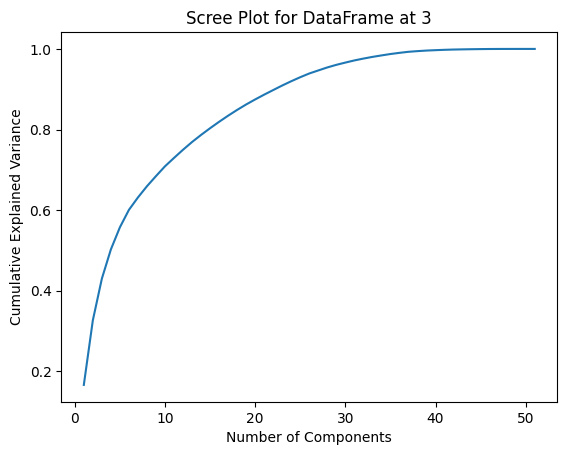

PCA for DataFrame at 4
[0.5461035  0.87403834 1.        ]
dimension :  3


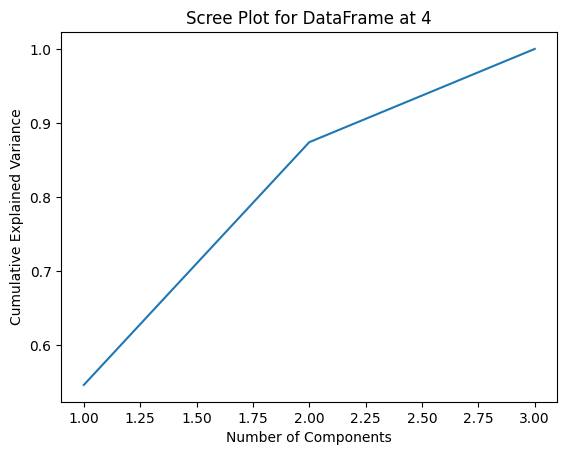

PCA for DataFrame at 5
[0.16604909 0.32647111 0.42977795 0.50234628 0.55726563 0.60051409
 0.63134037 0.6591746  0.68431424 0.70864991 0.72947202 0.74976318
 0.7689217  0.78654596 0.80318664 0.81910096 0.83426861 0.84862289
 0.86213419 0.87461926 0.88651704 0.89791276 0.9091999  0.91980838
 0.92980153 0.93905651 0.94657997 0.95404942 0.96049804 0.96610639
 0.9714311  0.97602039 0.98019649 0.98384369 0.9873489  0.99025577
 0.99287391 0.9945246  0.99592416 0.99691563 0.99778728 0.99846529
 0.99889368 0.99926544 0.99957973 0.99981225 0.99989764 0.99996936
 0.99999728 0.99999999 1.        ]
dimension :  23


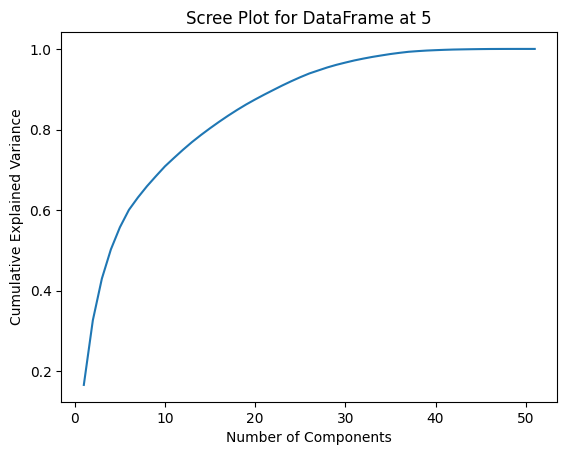

PCA for DataFrame at 6
[0.17839246 0.29913126 0.39685576 0.46189006 0.51304871 0.55553659
 0.58951977 0.62009396 0.64938081 0.67437124 0.69854153 0.72148892
 0.74274811 0.76257255 0.78208047 0.80022839 0.81796778 0.83410037
 0.8494703  0.86415914 0.87829486 0.89175529 0.90479811 0.91736464
 0.92857803 0.93737342 0.94594038 0.953301   0.95993504 0.96636924
 0.97173442 0.97660194 0.98096777 0.98518096 0.98856898 0.99158638
 0.99346796 0.99510686 0.99631257 0.9973434  0.99810277 0.99863354
 0.99914946 0.99957417 0.99983049 0.99991011 0.99997555 0.99999665
 0.99999999 1.        ]
dimension :  23


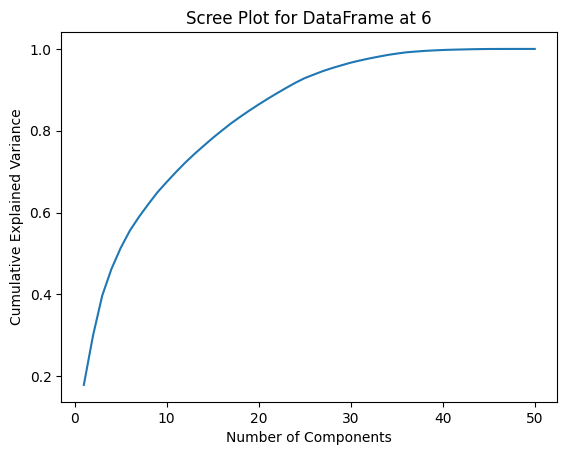

PCA for DataFrame at 7
[0.75363628 1.        ]
dimension :  2


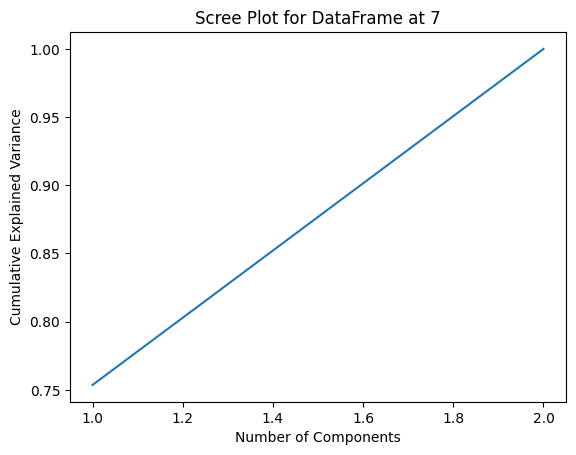

PCA for DataFrame at 8
[0.16944574 0.32095649 0.42333837 0.49561163 0.55121269 0.59458685
 0.62546272 0.65441086 0.68022006 0.70475947 0.72579109 0.74646788
 0.76607152 0.78381136 0.80075183 0.81712437 0.83262019 0.84724609
 0.86079152 0.87341445 0.88558974 0.89724927 0.9085823  0.91946646
 0.92965814 0.9391979  0.94667076 0.95400796 0.9603001  0.96598359
 0.97149481 0.97606472 0.98023237 0.98397035 0.98755836 0.99043013
 0.99300948 0.99461645 0.99602085 0.99705393 0.9979307  0.99858141
 0.99903033 0.99939459 0.99970334 0.99992297 0.99997906 0.99999713
 0.99999999 1.        ]
dimension :  23


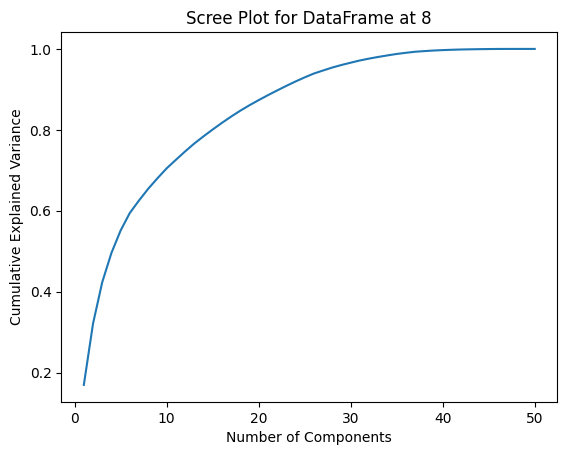

PCA for DataFrame at 9
[0.50217584 0.81122508 0.95498846 0.9969276  0.99999998 1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.        ]
dimension :  3


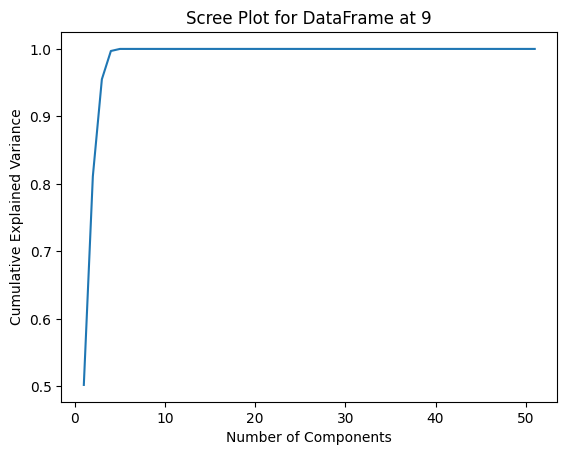

PCA for DataFrame at 10
[0.83478243 1.         1.         1.         1.        ]
dimension :  2


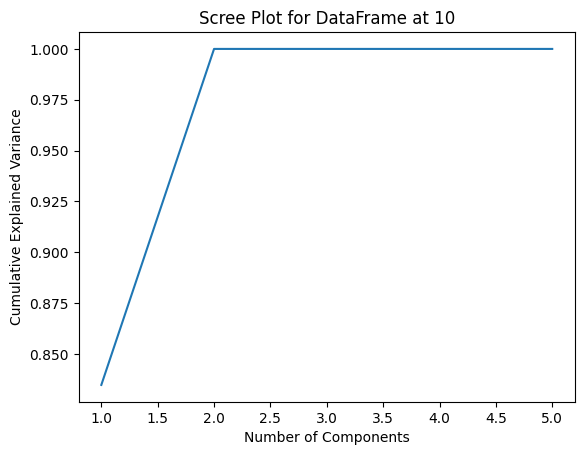

PCA for DataFrame at 11
[0.50217584 0.81122508 0.95498846 0.9969276  0.99999998 1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.        ]
dimension :  3


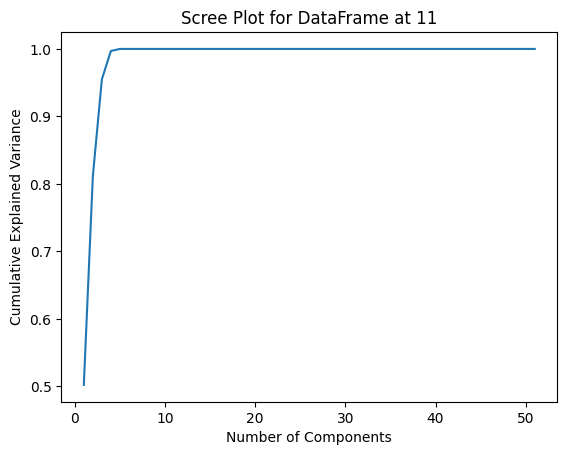

PCA for DataFrame at 12
[0.16604909 0.32647111 0.42977795 0.50234628 0.55726563 0.60051409
 0.63134037 0.6591746  0.68431424 0.70864991 0.72947202 0.74976318
 0.7689217  0.78654596 0.80318664 0.81910096 0.83426861 0.84862289
 0.86213419 0.87461926 0.88651704 0.89791276 0.9091999  0.91980838
 0.92980153 0.93905651 0.94657997 0.95404942 0.96049804 0.96610639
 0.9714311  0.97602039 0.98019649 0.98384369 0.9873489  0.99025577
 0.99287391 0.9945246  0.99592416 0.99691563 0.99778728 0.99846529
 0.99889368 0.99926544 0.99957973 0.99981225 0.99989764 0.99996936
 0.99999728 0.99999999 1.        ]
dimension :  23


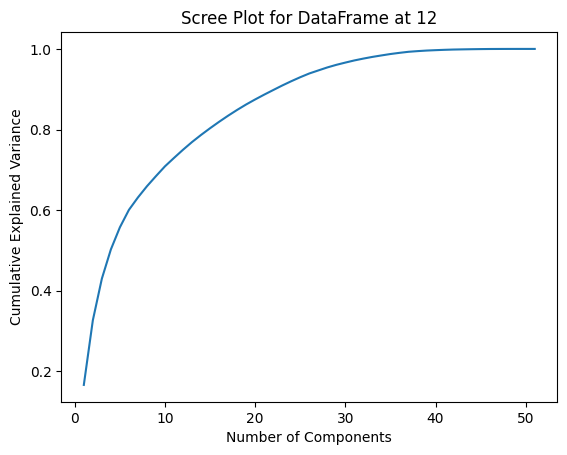

PCA for DataFrame at 13
[0.17840683 0.29915535 0.3968877  0.46192725 0.51309001 0.55558127
 0.58956718 0.62014382 0.64943303 0.67442546 0.6985977  0.72154693
 0.74280783 0.76263385 0.78214332 0.8002927  0.81803352 0.83416741
 0.84953855 0.86422856 0.87836541 0.89182691 0.90487078 0.91743832
 0.92865261 0.93744871 0.94601635 0.95337756 0.96001214 0.96644682
 0.97181241 0.9766803  0.98104645 0.98525986 0.98864803 0.99166534
 0.99354706 0.99518609 0.9963919  0.9974228  0.99818223 0.99871304
 0.999229   0.99965374 0.99991009 0.99997554 0.99999665 0.99999999
 1.        ]
dimension :  23


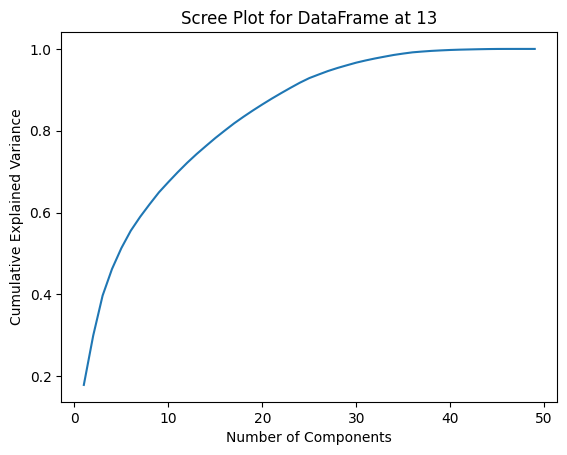

PCA for DataFrame at 14
[0.50217584 0.81122508 0.95498846 0.9969276  0.99999998 1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.        ]
dimension :  3


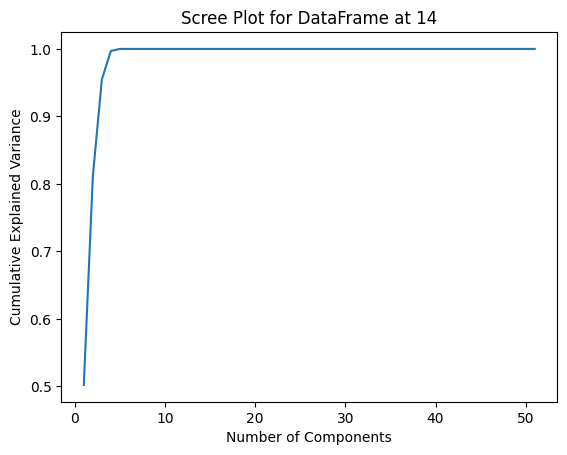

In [395]:
# Iterate over list of dataframes
for i in range(len(df_list_with_pca)):
  conduct_PCA(df_list_with_pca[i], i)

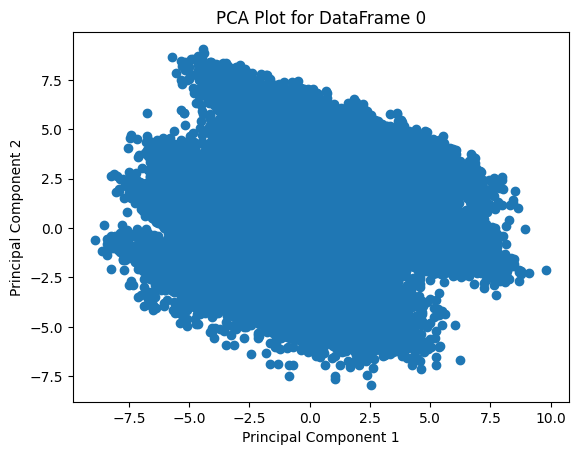

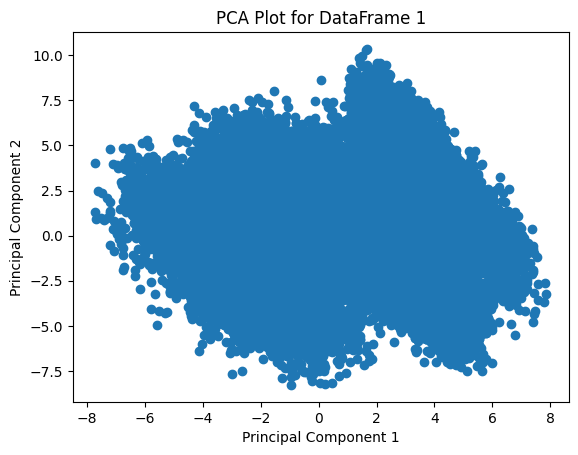

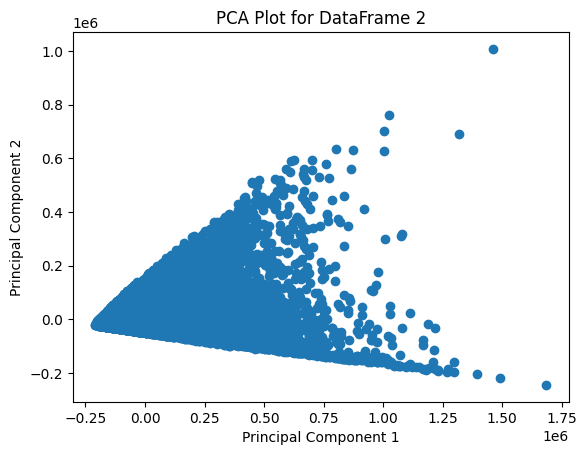

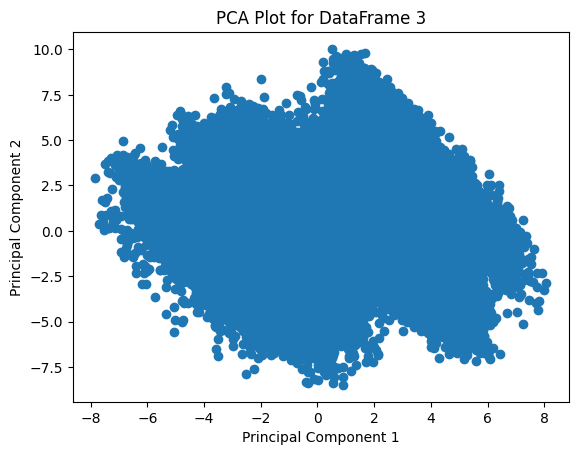

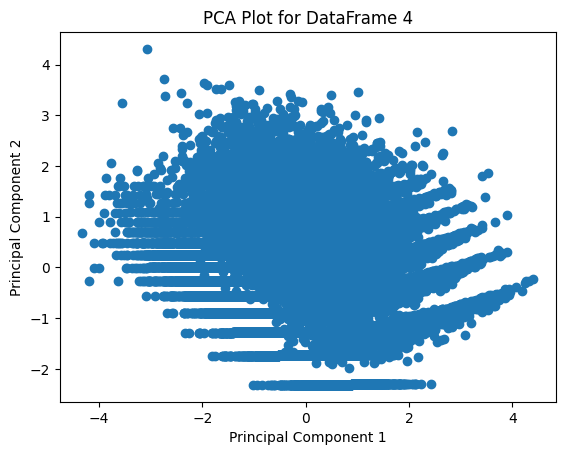

...

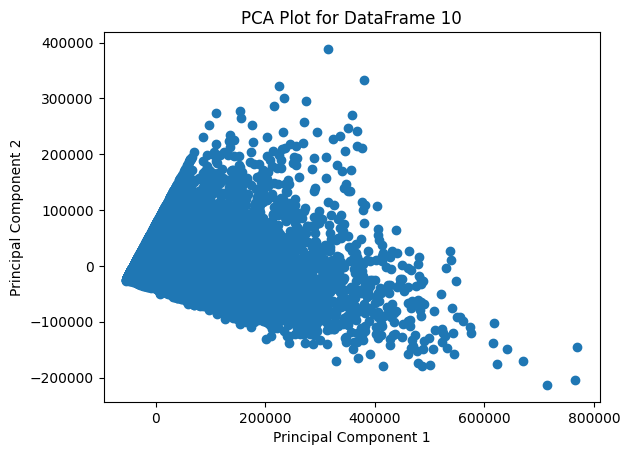

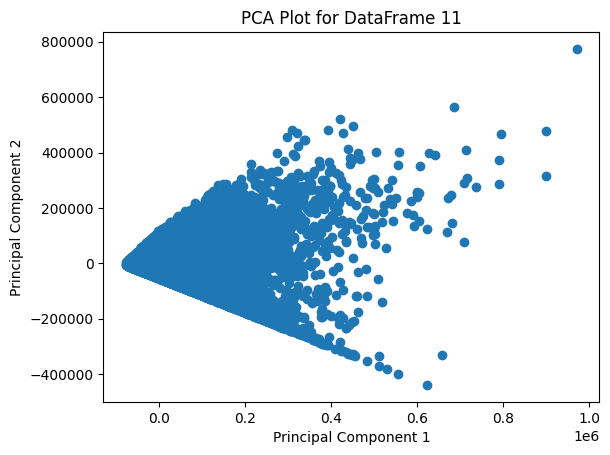

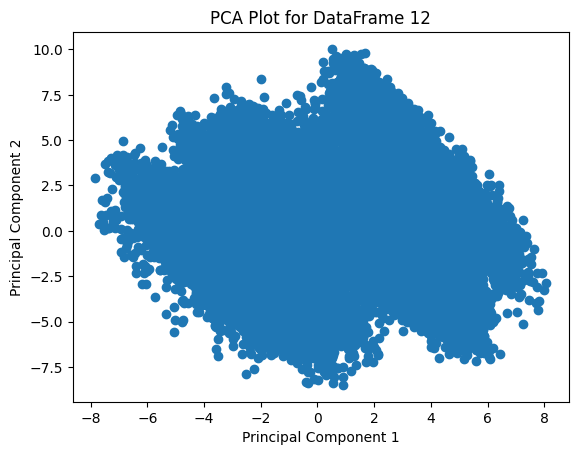

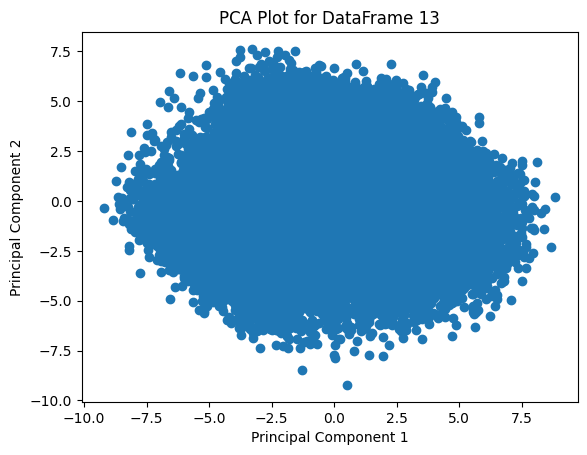

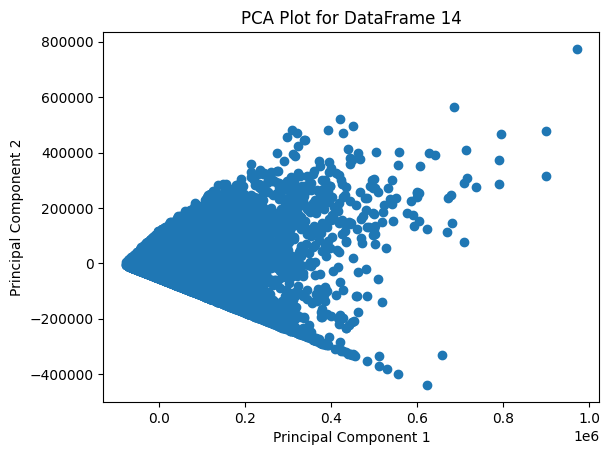

In [396]:
# Plot PCA for df_list_with_pca
for i in range(len(df_list_with_pca)):
  plt.scatter(df_list_with_pca[i][:, 0], df_list_with_pca[i][:, 1])
  plt.xlabel('Principal Component 1')
  plt.ylabel('Principal Component 2')
  plt.title(f'PCA Plot for DataFrame {i}')
  plt.show()

In [397]:
# Keep Possible PCA Plottable where number of columns in df_with_pca_list is 2 or 3
df_final_list_with_pca = []
df_indices_of_2or3PCA = []
for i in range(len(df_list_with_pca)):
  if df_list_with_pca[i].shape[1] in [2, 3]:
    df_final_list_with_pca.append(df_list_no_pca[i])
    df_indices_of_2or3PCA.append(i)

print(len(df_final_list_with_pca))

7


In [398]:
df_indices_of_2or3PCA

[2, 4, 7, 9, 10, 11, 14]

In [401]:
def check_PCA_components(df, index_of_df):
    print(f"PCA for DataFrame at {index_of_df}")
    pca = PCA(n_components=df_list_with_pca[index_of_df].shape[1])
    df_pca = pca.fit_transform(df)
    print(pca.components_)
    print("\nTop feature contributions to principal components:")
    # Change component_names to reflect the number of components
    component_names = [f"PC{i+1}" for i in range(pca.n_components_)]
    # Now component_names will have 15 column names (PC1 to PC15)
    loadings = pd.DataFrame(pca.components_.T, columns=component_names, index=df.columns)
    for i, pc in enumerate(component_names):
        sorted_loadings = loadings[pc].abs().sort_values(ascending=False)
        print(f"\n{pc} explains {pca.explained_variance_ratio_[i]:.2%} of variance")
        print(f"Top contributing features:")
        for j, (feature, loading) in enumerate(sorted_loadings.head(5).items()):
            sign = '+' if loadings.loc[feature, pc] > 0 else '-'
            print(f"  {j+1}. {feature}: {sign}{abs(loadings.loc[feature, pc]):.3f}")

    print("- " * 20)


In [402]:
for i in range(len(df_indices_of_2or3PCA)):
    check_PCA_components(df_list_no_pca[df_indices_of_2or3PCA[i]], df_indices_of_2or3PCA[i])

PCA for DataFrame at 2
[[ 9.23889513e-01 -1.65548851e-07  1.17621651e-01  3.49666165e-06
  -4.78200734e-07  4.57681632e-06 -2.54987999e-07  3.93980688e-07
   2.08920000e-06 -1.13817922e-07 -4.20158859e-07  1.72276514e-06
   1.27299771e-07 -6.69457115e-08  3.75921918e-09 -5.03712158e-08
  -3.35655123e-07 -2.60201656e-07 -7.54534669e-08 -2.95986942e-07
   7.81169471e-08 -5.40284880e-09 -1.90074249e-08  1.74942224e-08
   6.91232167e-08  2.96056712e-08  7.95099718e-08 -1.40037021e-07
   2.96851121e-08  5.98130773e-08  3.88914308e-08  5.81945871e-08
   4.45852427e-08  2.87039870e-01 -1.86064379e-02 -3.06643810e-07
   3.74734816e-07  1.88606071e-01  1.19511417e-01 -6.81378626e-07
  -1.49293452e-07  1.49293452e-07  1.46693490e-07  2.98586904e-07
   3.71389442e-07 -5.33976781e-07 -1.63874404e-07  4.51719366e-07
   8.06672869e-09 -7.06800644e-08 -4.06649033e-07  3.35006005e-09]
 [-9.50413089e-02  4.31523074e-07  9.89419473e-01 -7.78936540e-06
  -1.28761913e-06 -2.58103113e-06  1.43313927e-06 -5

# Model Training

In [403]:
def elbow_method(df, index_of_df):
  wcss=[]
  sse = {}
  for i in range(1, 8):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300,
                    n_init = 10, random_state = 0)
    kmeans.fit(df)
    wcss.append(kmeans.inertia_)
    sse[i] = kmeans.inertia_
    print("For cluster = {}, SSE/WCSS is {}".format(i, sse[i]))

  # Print WCSS plot
  plt.figure(figsize=(10, 6))
  plt.plot(range(1, 8), wcss)
  plt.title(f'The elbow method for DataFrame at index {index_of_df}')
  plt.xlabel('Number of clusters')
  plt.ylabel('WCSS')
  plt.show()

For cluster = 1, SSE/WCSS is 2331646.0003370205
For cluster = 2, SSE/WCSS is 2019249.3597244753
For cluster = 3, SSE/WCSS is 1832959.656459965
For cluster = 4, SSE/WCSS is 1704541.5861104345
For cluster = 5, SSE/WCSS is 1643066.5975713984
For cluster = 6, SSE/WCSS is 1591288.4948670038
For cluster = 7, SSE/WCSS is 1549206.3054256765


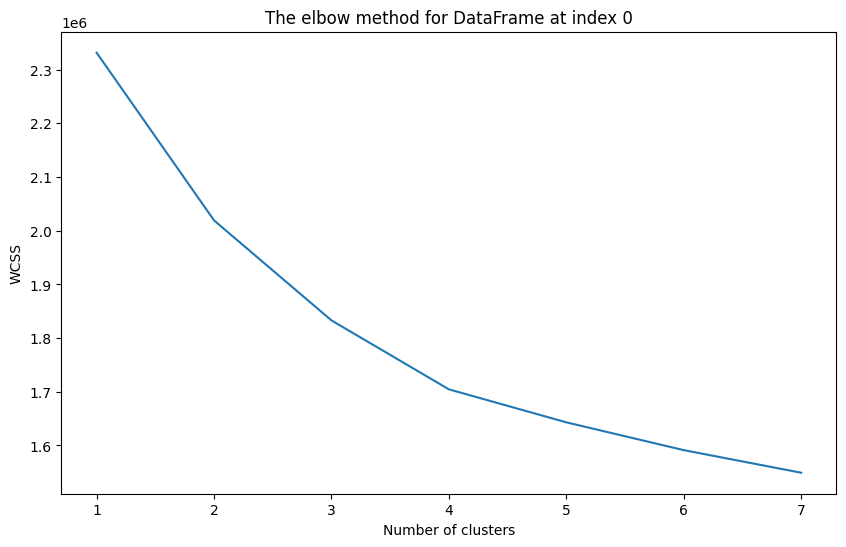

For cluster = 1, SSE/WCSS is 2144843.4310160666
For cluster = 2, SSE/WCSS is 1851219.558558959
For cluster = 3, SSE/WCSS is 1684490.1726660826
For cluster = 4, SSE/WCSS is 1581035.7612196251
For cluster = 5, SSE/WCSS is 1525446.4646575009
For cluster = 6, SSE/WCSS is 1478410.7587851891
For cluster = 7, SSE/WCSS is 1439058.3762818747


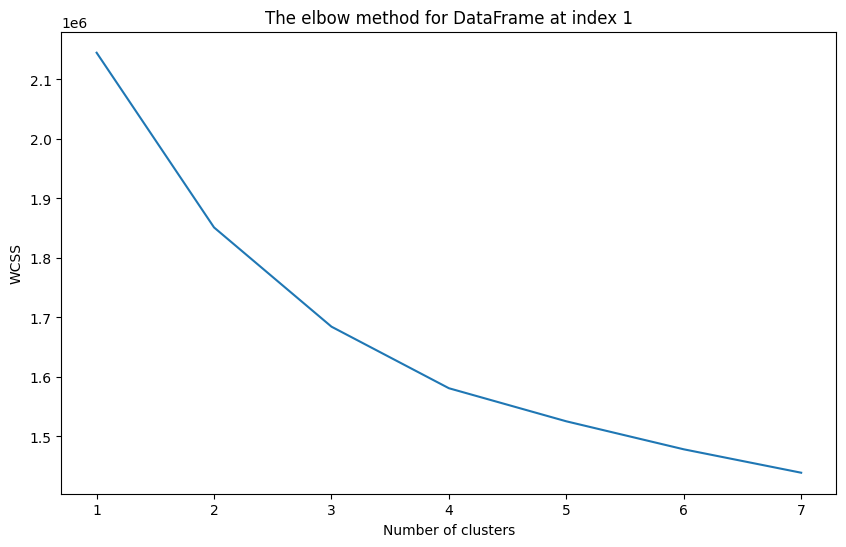

For cluster = 1, SSE/WCSS is 1447775510334671.0
For cluster = 2, SSE/WCSS is 688672239080594.2
For cluster = 3, SSE/WCSS is 493506605569503.94
For cluster = 4, SSE/WCSS is 416416392961696.6
For cluster = 5, SSE/WCSS is 369499312930290.1
For cluster = 6, SSE/WCSS is 330820518717247.0
For cluster = 7, SSE/WCSS is 300041899253115.0


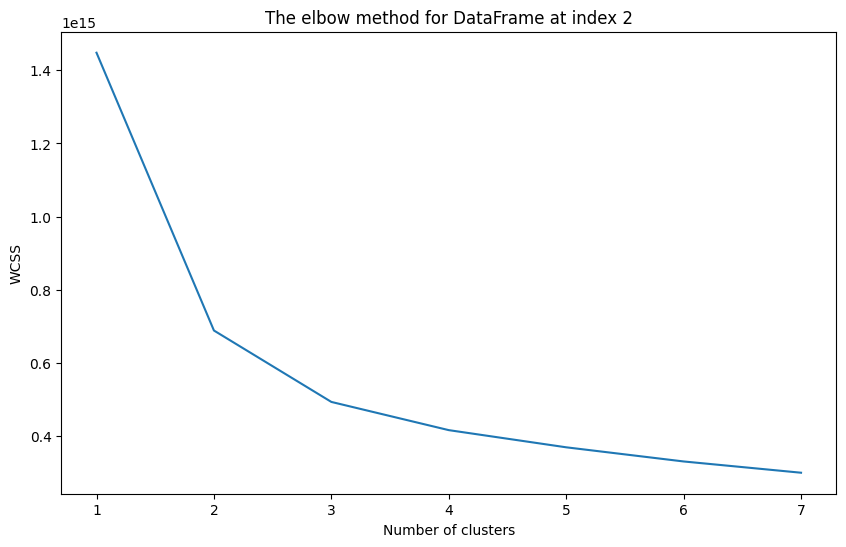

For cluster = 1, SSE/WCSS is 2290102.0003369753
For cluster = 2, SSE/WCSS is 1978665.159218245
For cluster = 3, SSE/WCSS is 1796509.8403605586
For cluster = 4, SSE/WCSS is 1675081.4259633636
For cluster = 5, SSE/WCSS is 1615565.2360280252
For cluster = 6, SSE/WCSS is 1564244.2965422254
For cluster = 7, SSE/WCSS is 1523873.0136696005


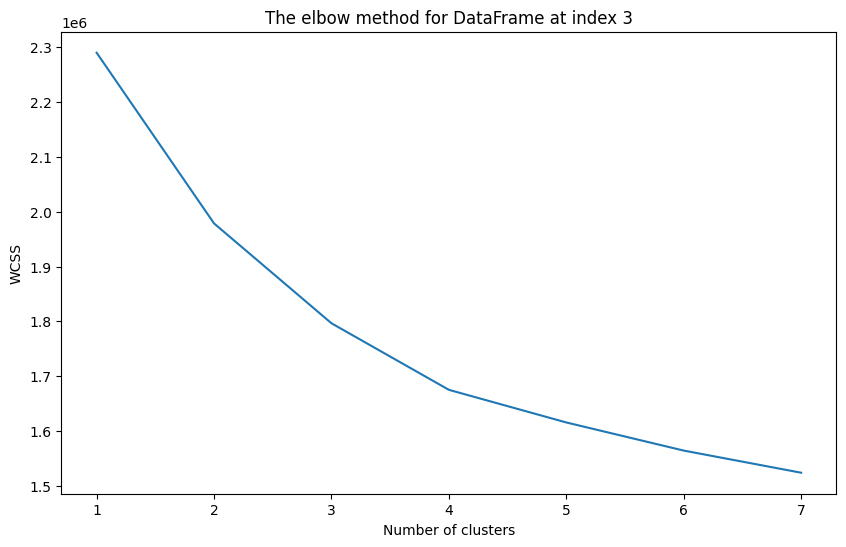

For cluster = 1, SSE/WCSS is 124631.99999999967
For cluster = 2, SSE/WCSS is 78698.36708576685
For cluster = 3, SSE/WCSS is 57613.85984855779
For cluster = 4, SSE/WCSS is 44194.62864168845
For cluster = 5, SSE/WCSS is 37519.32037354912
For cluster = 6, SSE/WCSS is 32516.35943883454
For cluster = 7, SSE/WCSS is 28525.826477889605


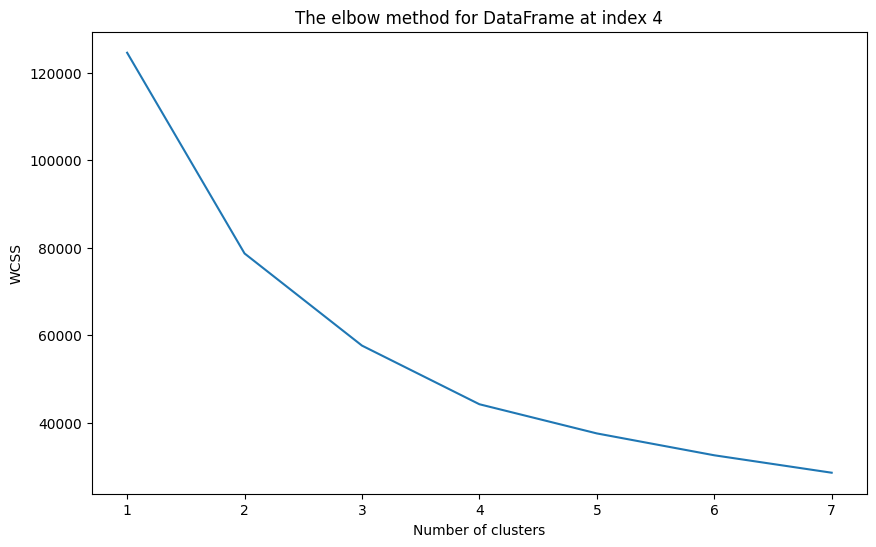

For cluster = 1, SSE/WCSS is 2290102.0003369753
For cluster = 2, SSE/WCSS is 1978665.1592182447
For cluster = 3, SSE/WCSS is 1796509.8403605584
For cluster = 4, SSE/WCSS is 1675081.4259633636
For cluster = 5, SSE/WCSS is 1615565.2360280254
For cluster = 6, SSE/WCSS is 1564244.2965422254
For cluster = 7, SSE/WCSS is 1523873.0136696005


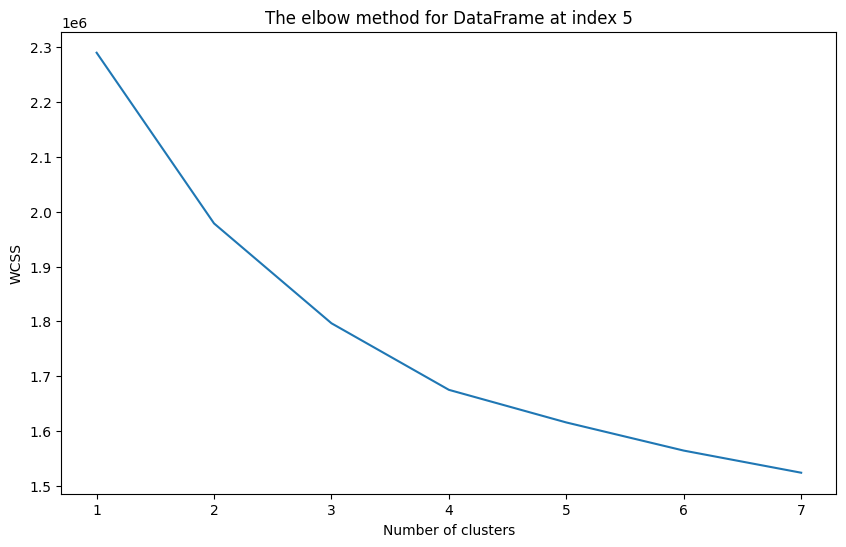

For cluster = 1, SSE/WCSS is 1805030.5719271796
For cluster = 2, SSE/WCSS is 1592723.9446353458
For cluster = 3, SSE/WCSS is 1465877.474606553
For cluster = 4, SSE/WCSS is 1382041.8059152884
For cluster = 5, SSE/WCSS is 1327636.2379876652
For cluster = 6, SSE/WCSS is 1294775.5828490853
For cluster = 7, SSE/WCSS is 1267819.7960091792


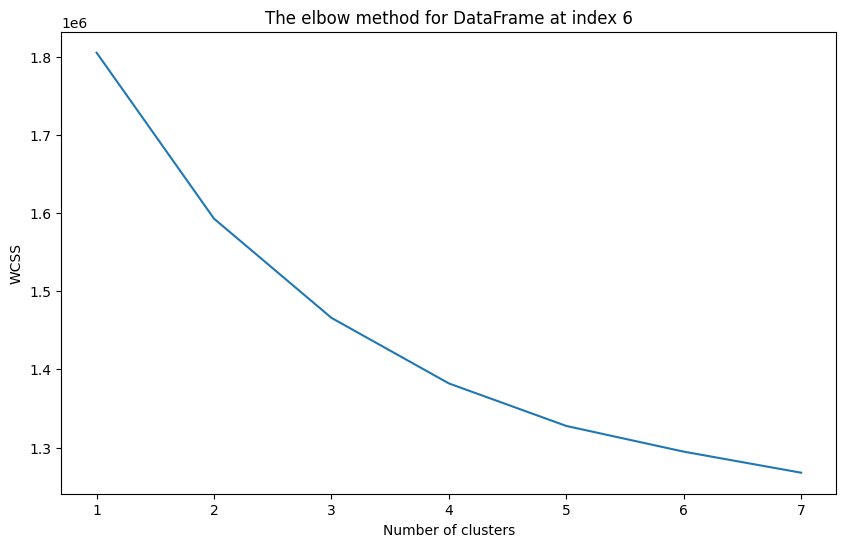

For cluster = 1, SSE/WCSS is 76785.99999999994
For cluster = 2, SSE/WCSS is 39222.54676230729
For cluster = 3, SSE/WCSS is 29259.921603895065
For cluster = 4, SSE/WCSS is 22339.888472933886
For cluster = 5, SSE/WCSS is 18532.931809178604
For cluster = 6, SSE/WCSS is 15525.56003888434
For cluster = 7, SSE/WCSS is 13506.8176998073


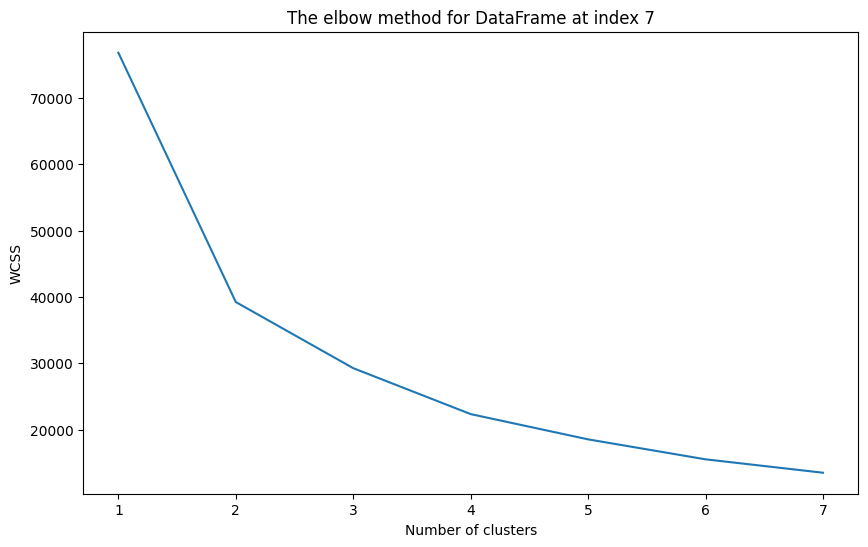

For cluster = 1, SSE/WCSS is 2106304.9862214546
For cluster = 2, SSE/WCSS is 1813397.100816955
For cluster = 3, SSE/WCSS is 1649030.0292381535
For cluster = 4, SSE/WCSS is 1551100.498337848
For cluster = 5, SSE/WCSS is 1495995.2387161902
For cluster = 6, SSE/WCSS is 1449071.6414787201
For cluster = 7, SSE/WCSS is 1411669.3191975052


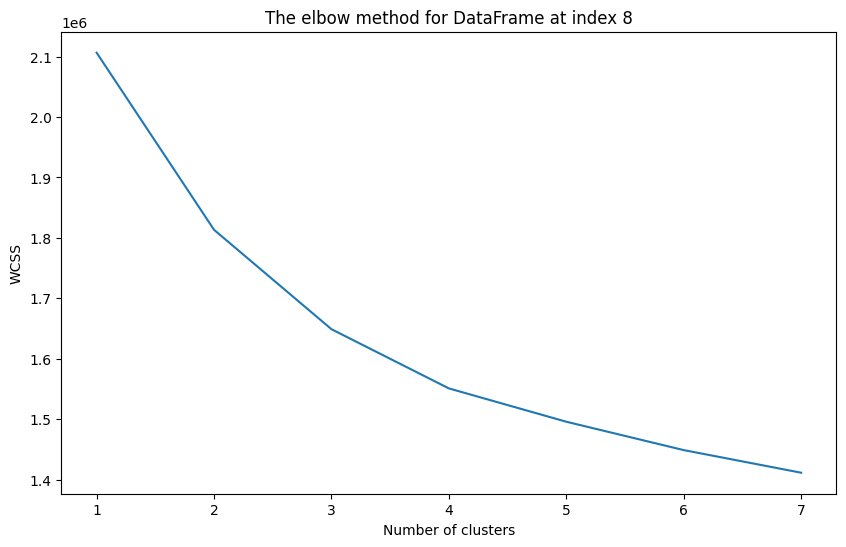

For cluster = 1, SSE/WCSS is 455064055654067.9
For cluster = 2, SSE/WCSS is 308522496854192.3
For cluster = 3, SSE/WCSS is 240658441679963.25
For cluster = 4, SSE/WCSS is 198688135992870.22
For cluster = 5, SSE/WCSS is 167434674922236.28
For cluster = 6, SSE/WCSS is 149108289555361.62
For cluster = 7, SSE/WCSS is 132974588461462.53


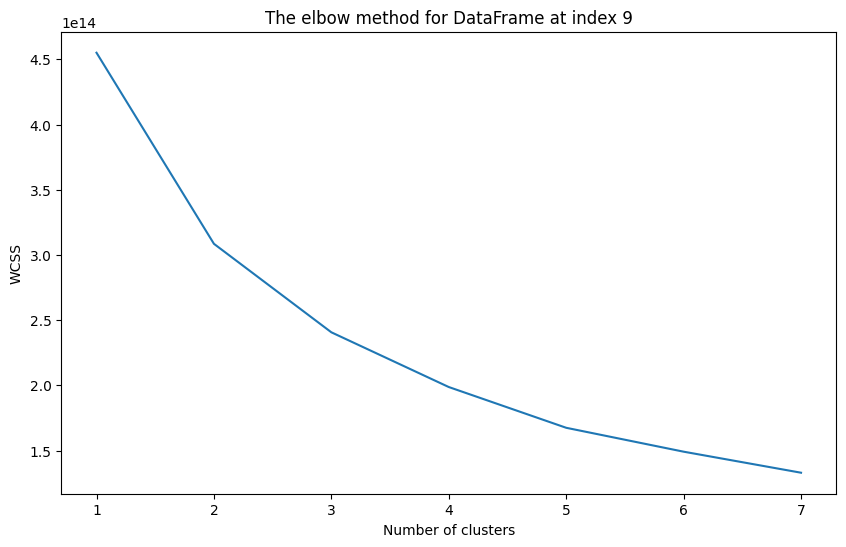

For cluster = 1, SSE/WCSS is 227309700044787.22
For cluster = 2, SSE/WCSS is 100521955728162.06
For cluster = 3, SSE/WCSS is 67850124192139.8
For cluster = 4, SSE/WCSS is 53708497179289.08
For cluster = 5, SSE/WCSS is 42744660194353.71
For cluster = 6, SSE/WCSS is 35683587763382.836
For cluster = 7, SSE/WCSS is 30618423971923.617


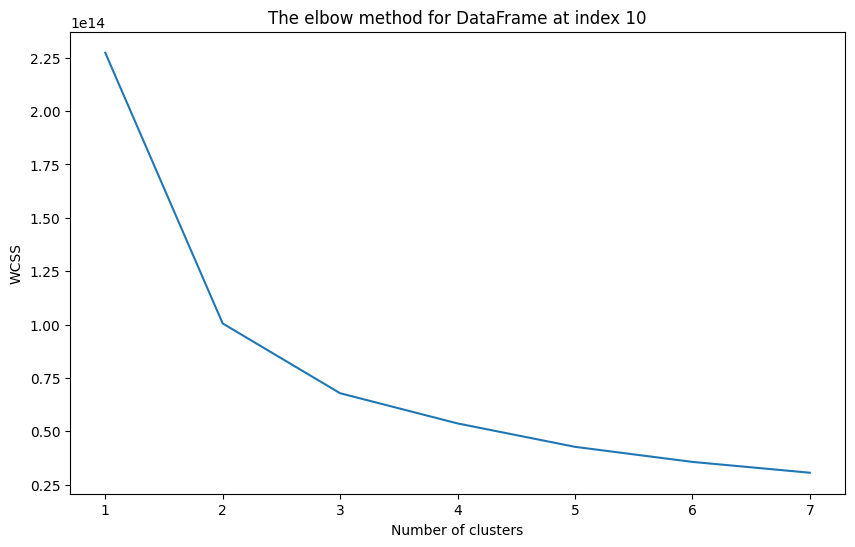

For cluster = 1, SSE/WCSS is 455064055654067.94
For cluster = 2, SSE/WCSS is 308522496854192.3
For cluster = 3, SSE/WCSS is 240658441679963.25
For cluster = 4, SSE/WCSS is 198688135992870.22
For cluster = 5, SSE/WCSS is 167434674922236.34
For cluster = 6, SSE/WCSS is 149108289555361.62
For cluster = 7, SSE/WCSS is 132974588461462.52


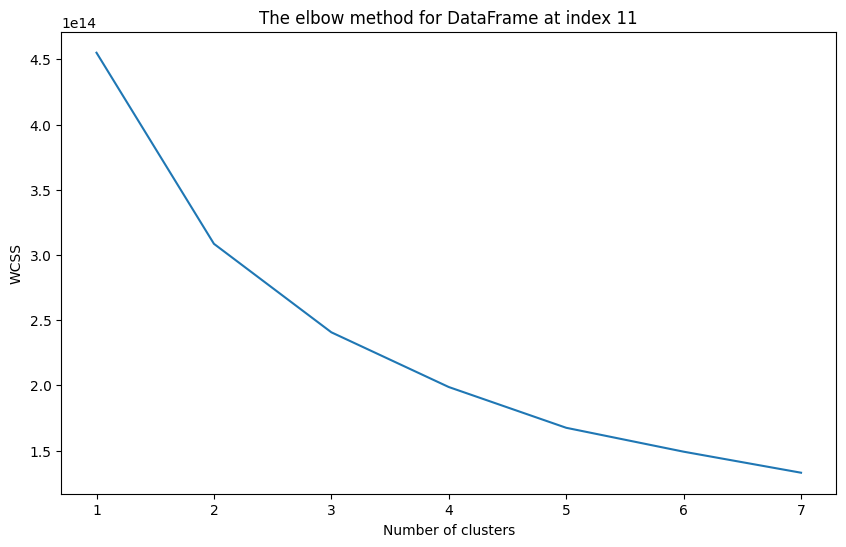

For cluster = 1, SSE/WCSS is 2290102.0003369753
For cluster = 2, SSE/WCSS is 1978665.159218245
For cluster = 3, SSE/WCSS is 1796509.8403605584
For cluster = 4, SSE/WCSS is 1675081.4259633636
For cluster = 5, SSE/WCSS is 1615565.2360280254
For cluster = 6, SSE/WCSS is 1564244.2965422254
For cluster = 7, SSE/WCSS is 1523873.0136696005


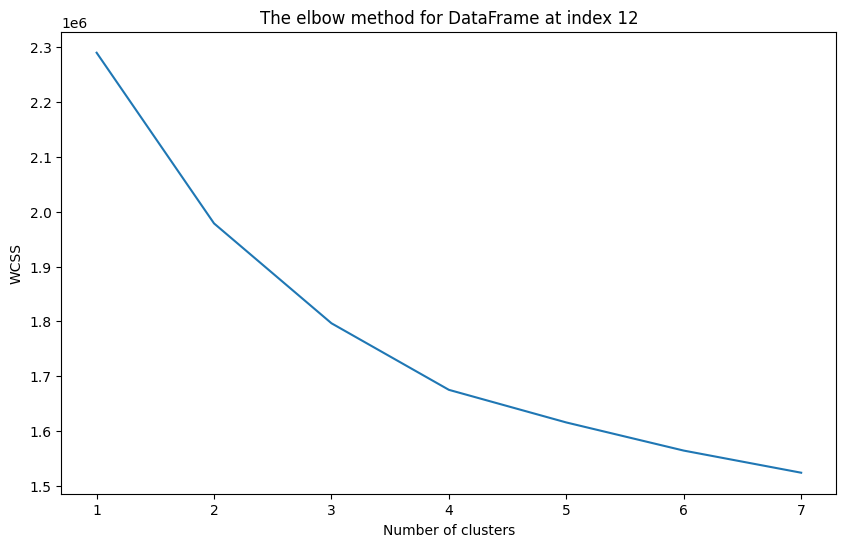

For cluster = 1, SSE/WCSS is 1804885.1271325517
For cluster = 2, SSE/WCSS is 1592578.5054918882
For cluster = 3, SSE/WCSS is 1465732.051140014
For cluster = 4, SSE/WCSS is 1381896.373888607
For cluster = 5, SSE/WCSS is 1327490.810721696
For cluster = 6, SSE/WCSS is 1294629.9054370173
For cluster = 7, SSE/WCSS is 1267678.916956777


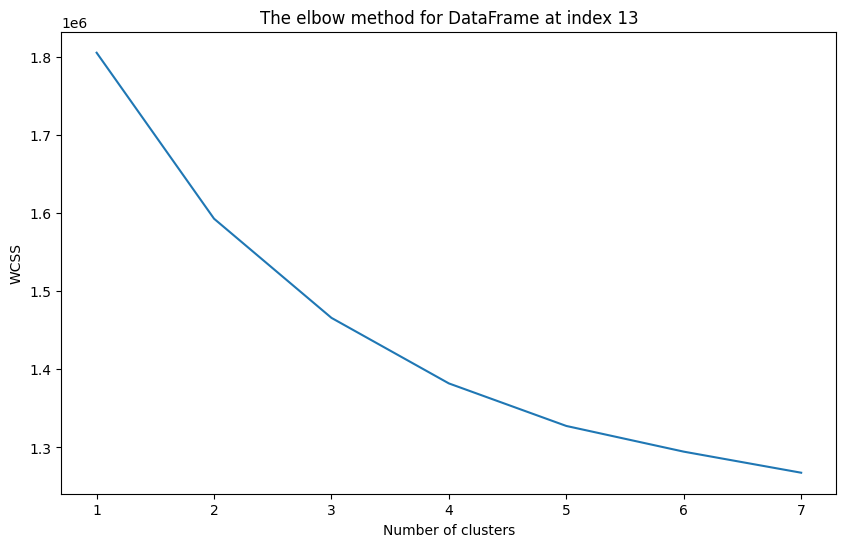

For cluster = 1, SSE/WCSS is 455064055654068.06
For cluster = 2, SSE/WCSS is 308522496854192.3
For cluster = 3, SSE/WCSS is 240658441679963.25
For cluster = 4, SSE/WCSS is 198688135992870.22
For cluster = 5, SSE/WCSS is 167434674922236.28
For cluster = 6, SSE/WCSS is 149108289555361.62
For cluster = 7, SSE/WCSS is 132974588461462.53


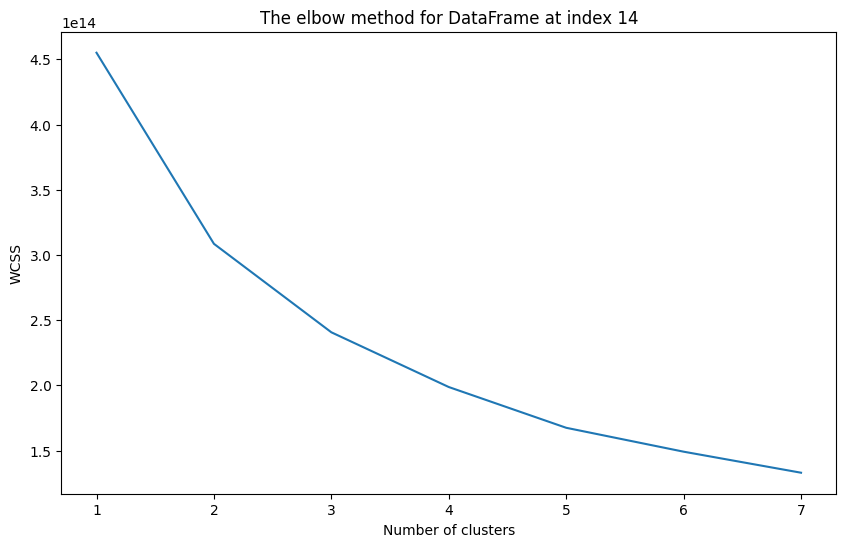

In [404]:
# Iterate over non_df_pca list. Limit as df from automatic feature removal remains the same as 0
for i in range(len(df_list_no_pca)):
  elbow_method(df_list_no_pca[i], i)

For cluster = 1, SSE/WCSS is 2118318.083023829
For cluster = 2, SSE/WCSS is 1806015.6775642345
For cluster = 3, SSE/WCSS is 1620023.9631221897
For cluster = 4, SSE/WCSS is 1492104.5042127578
For cluster = 5, SSE/WCSS is 1431115.5979228758
For cluster = 6, SSE/WCSS is 1380685.9559861843
For cluster = 7, SSE/WCSS is 1338977.6546276312


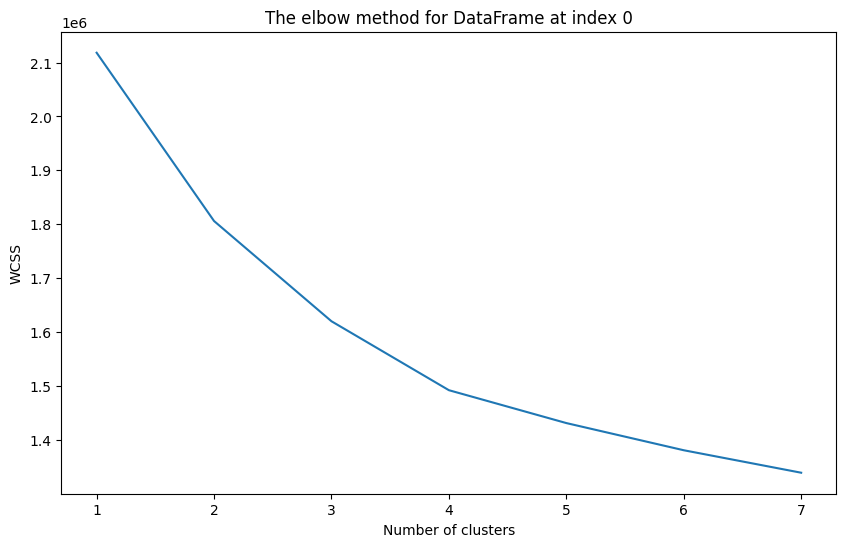

For cluster = 1, SSE/WCSS is 1946611.1229485895
For cluster = 2, SSE/WCSS is 1653109.7923064232
For cluster = 3, SSE/WCSS is 1486599.3703190233
For cluster = 4, SSE/WCSS is 1383528.1449218323
For cluster = 5, SSE/WCSS is 1328786.6547568063
For cluster = 6, SSE/WCSS is 1282190.8833294301
For cluster = 7, SSE/WCSS is 1242652.1622324367


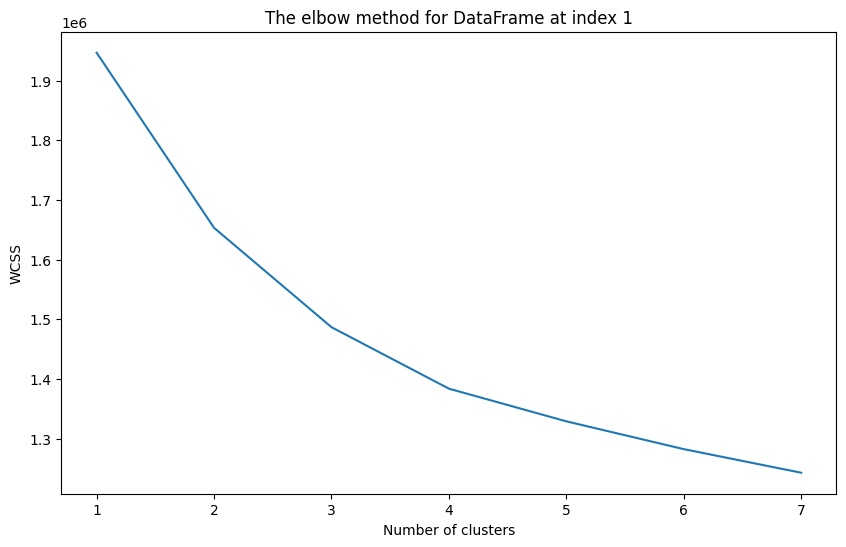

For cluster = 1, SSE/WCSS is 1303521749612302.2
For cluster = 2, SSE/WCSS is 544446290687461.94
For cluster = 3, SSE/WCSS is 351482779751025.2
For cluster = 4, SSE/WCSS is 275434078042504.78
For cluster = 5, SSE/WCSS is 228665825043682.5
For cluster = 6, SSE/WCSS is 190650020146353.5
For cluster = 7, SSE/WCSS is 159769824988826.62


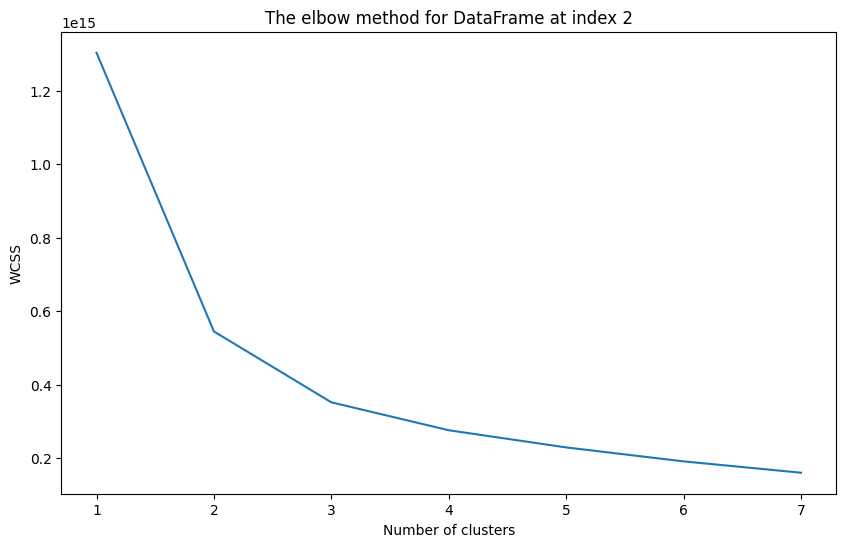

For cluster = 1, SSE/WCSS is 2082160.5048457994
For cluster = 2, SSE/WCSS is 1770825.7677583457
For cluster = 3, SSE/WCSS is 1588952.8571024917
For cluster = 4, SSE/WCSS is 1467990.7208826852
For cluster = 5, SSE/WCSS is 1409292.5693948076
For cluster = 6, SSE/WCSS is 1358761.379956538
For cluster = 7, SSE/WCSS is 1318146.6427437377


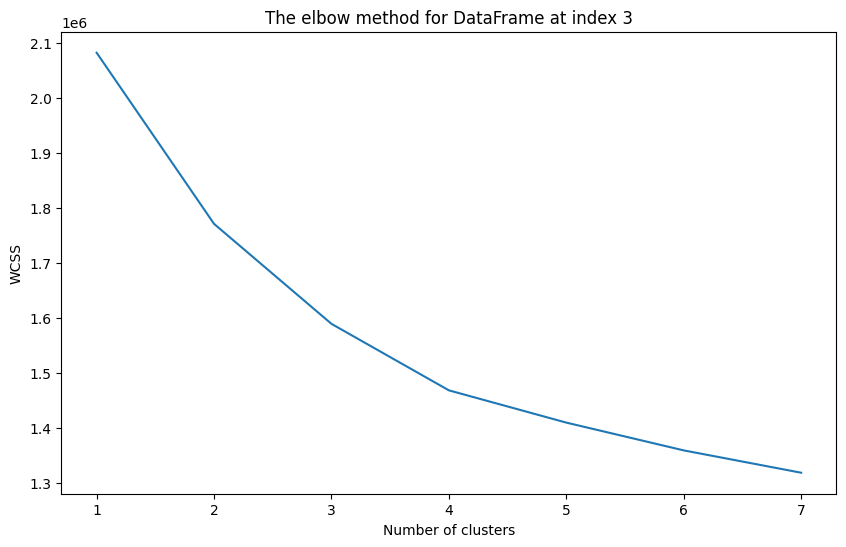

For cluster = 1, SSE/WCSS is 124631.9999999997
For cluster = 2, SSE/WCSS is 78698.36708576663
For cluster = 3, SSE/WCSS is 57613.8598485578
For cluster = 4, SSE/WCSS is 44194.62864168848
For cluster = 5, SSE/WCSS is 37519.32037354922
For cluster = 6, SSE/WCSS is 32516.3594388345
For cluster = 7, SSE/WCSS is 28525.82647788964


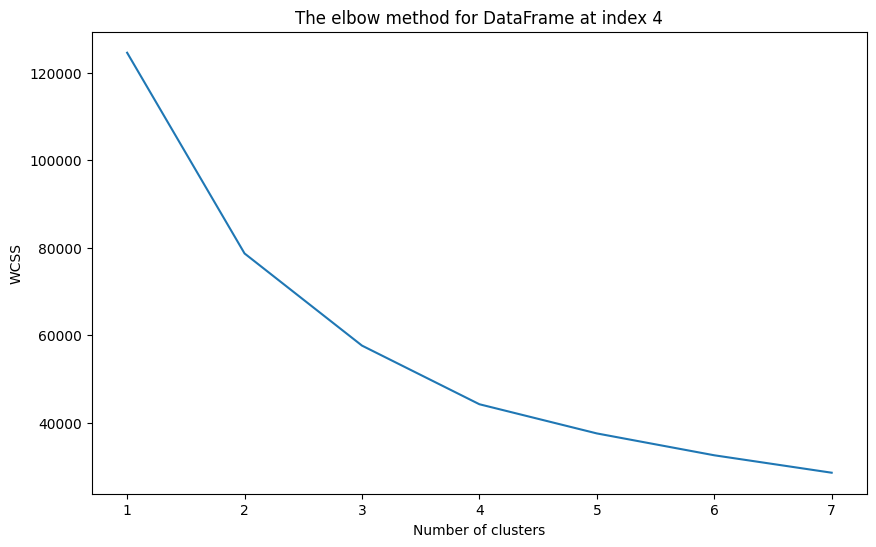

For cluster = 1, SSE/WCSS is 2082160.504845799
For cluster = 2, SSE/WCSS is 1770825.7677583455
For cluster = 3, SSE/WCSS is 1588952.857102492
For cluster = 4, SSE/WCSS is 1467990.7208826852
For cluster = 5, SSE/WCSS is 1409292.5693948076
For cluster = 6, SSE/WCSS is 1358761.3799565388
For cluster = 7, SSE/WCSS is 1318146.642743738


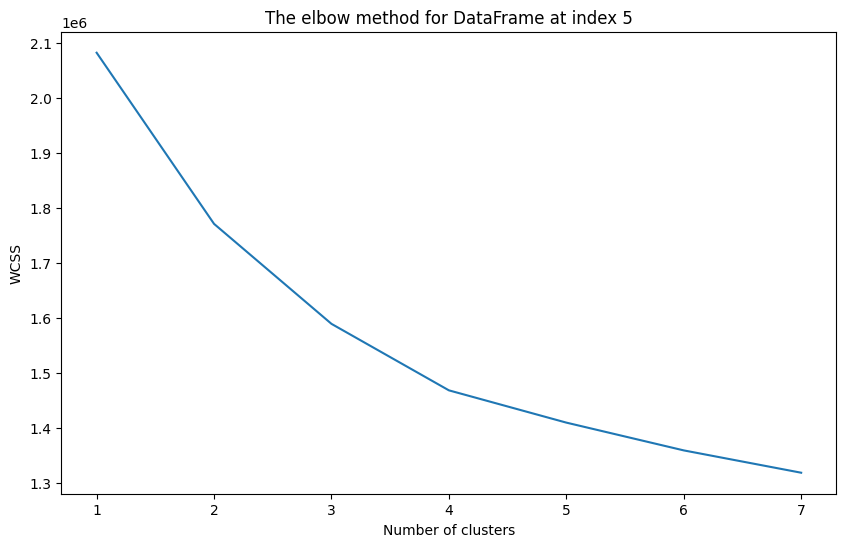

For cluster = 1, SSE/WCSS is 1633188.2536345595
For cluster = 2, SSE/WCSS is 1420931.4734841078
For cluster = 3, SSE/WCSS is 1294290.8935352685
For cluster = 4, SSE/WCSS is 1210550.3969780838
For cluster = 5, SSE/WCSS is 1157025.9574889462
For cluster = 6, SSE/WCSS is 1124624.2875500324
For cluster = 7, SSE/WCSS is 1098023.293174795


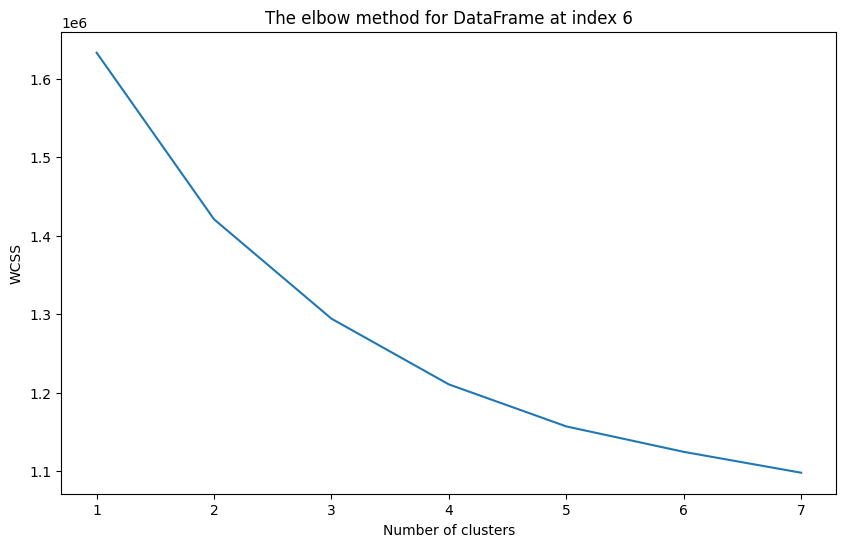

For cluster = 1, SSE/WCSS is 76785.99999999993
For cluster = 2, SSE/WCSS is 39222.54676230734
For cluster = 3, SSE/WCSS is 29259.921603895036
For cluster = 4, SSE/WCSS is 22339.88847293383
For cluster = 5, SSE/WCSS is 18532.931809178564
For cluster = 6, SSE/WCSS is 15525.560038884307
For cluster = 7, SSE/WCSS is 13506.81769980729


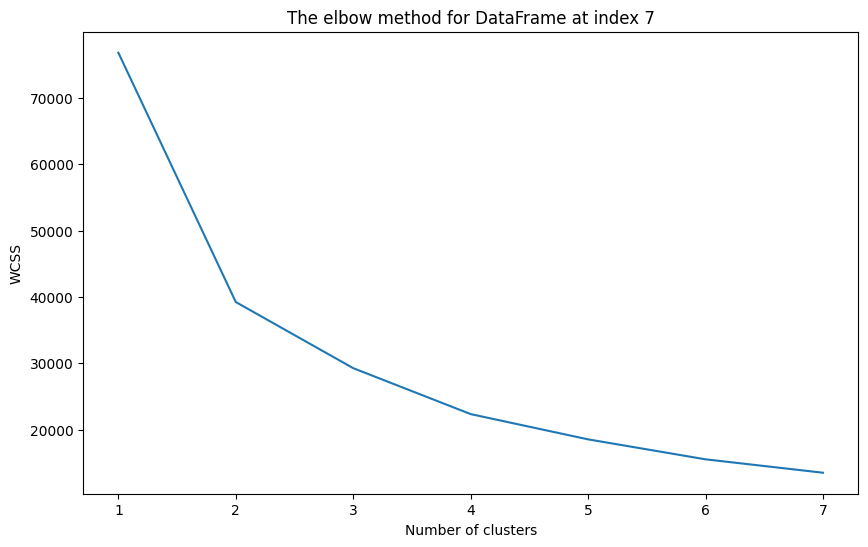

For cluster = 1, SSE/WCSS is 1913751.4270502278
For cluster = 2, SSE/WCSS is 1620968.3864708922
For cluster = 3, SSE/WCSS is 1456801.5487497996
For cluster = 4, SSE/WCSS is 1359212.9431370664
For cluster = 5, SSE/WCSS is 1305048.1191386348
For cluster = 6, SSE/WCSS is 1258595.6912553618
For cluster = 7, SSE/WCSS is 1221026.389824253


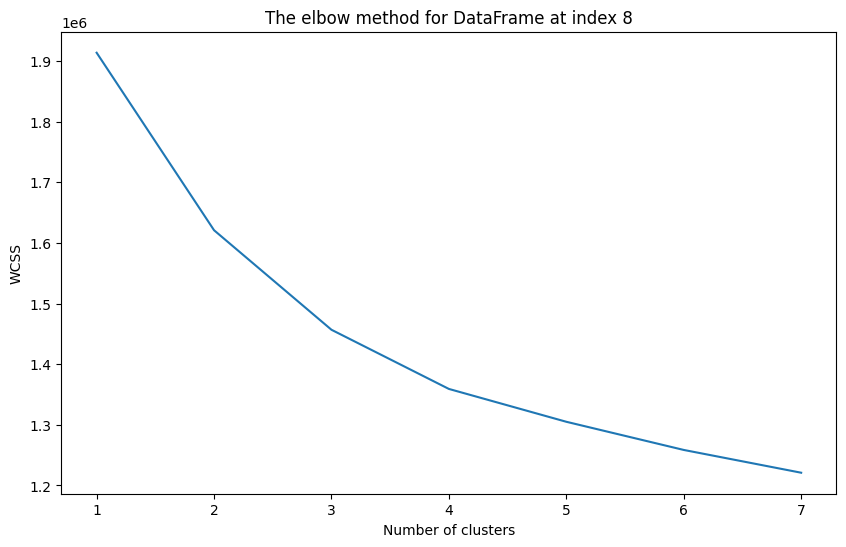

For cluster = 1, SSE/WCSS is 434580920600013.44
For cluster = 2, SSE/WCSS is 288040511869487.3
For cluster = 3, SSE/WCSS is 220474873955025.66
For cluster = 4, SSE/WCSS is 178856365576273.16
For cluster = 5, SSE/WCSS is 148150716297407.3
For cluster = 6, SSE/WCSS is 129901680427888.77
For cluster = 7, SSE/WCSS is 114072515571207.67


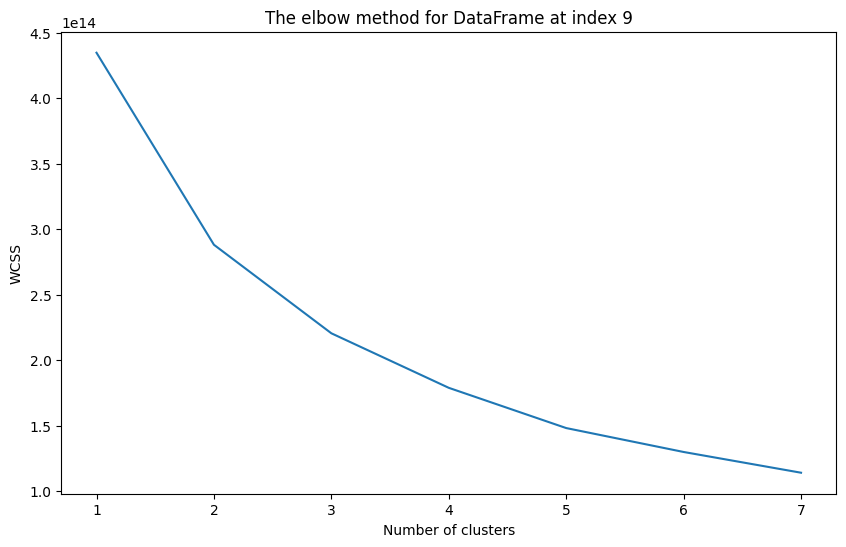

For cluster = 1, SSE/WCSS is 227309699914830.5
For cluster = 2, SSE/WCSS is 100521985529046.98
For cluster = 3, SSE/WCSS is 67850124062769.55
For cluster = 4, SSE/WCSS is 53709539520173.36
For cluster = 5, SSE/WCSS is 42747711800647.586
For cluster = 6, SSE/WCSS is 35685140678467.42
For cluster = 7, SSE/WCSS is 30618821133981.02


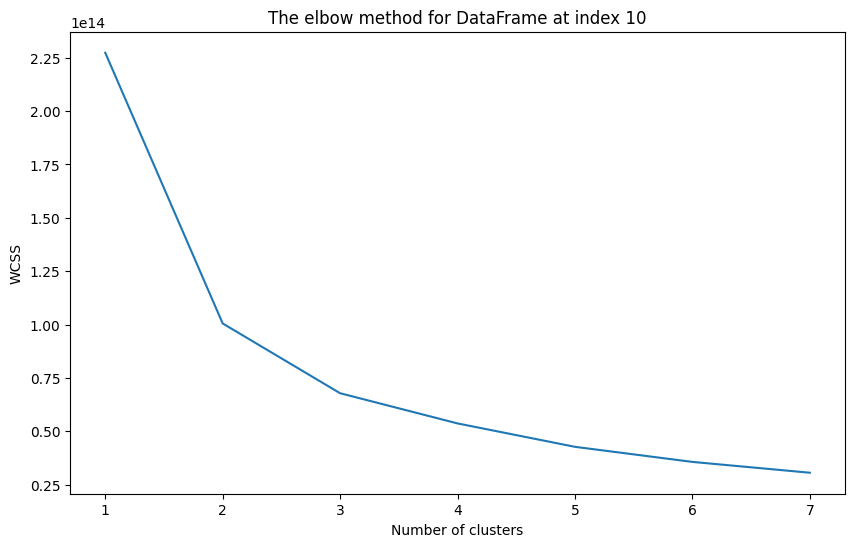

For cluster = 1, SSE/WCSS is 434580920600013.1
For cluster = 2, SSE/WCSS is 288040511869487.1
For cluster = 3, SSE/WCSS is 220474873955025.53
For cluster = 4, SSE/WCSS is 178856365576273.1
For cluster = 5, SSE/WCSS is 148150716297407.25
For cluster = 6, SSE/WCSS is 129901680427888.7
For cluster = 7, SSE/WCSS is 114072515571207.62


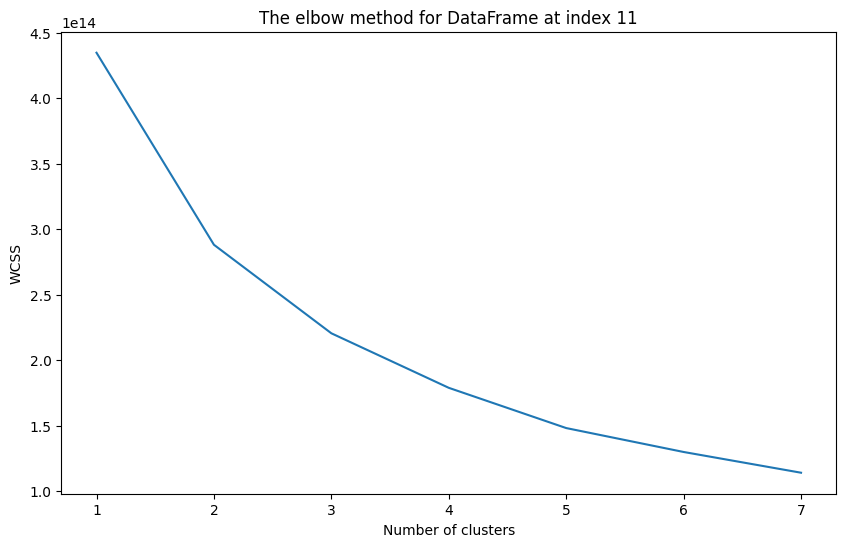

For cluster = 1, SSE/WCSS is 2082160.5048457992
For cluster = 2, SSE/WCSS is 1770825.7677583452
For cluster = 3, SSE/WCSS is 1588952.8571024912
For cluster = 4, SSE/WCSS is 1467990.720882685
For cluster = 5, SSE/WCSS is 1409292.5693948069
For cluster = 6, SSE/WCSS is 1358761.3799565376
For cluster = 7, SSE/WCSS is 1318146.6427437374


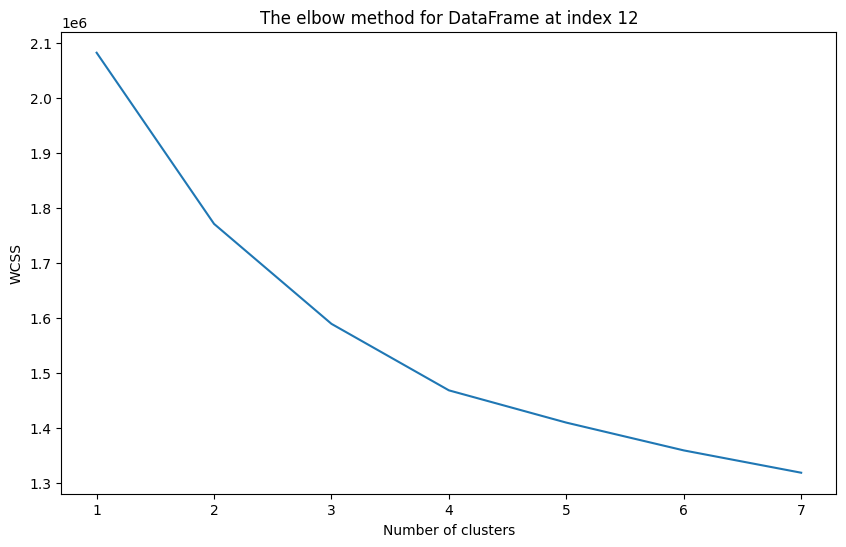

For cluster = 1, SSE/WCSS is 1633187.8126482652
For cluster = 2, SSE/WCSS is 1420931.0379276215
For cluster = 3, SSE/WCSS is 1294290.4731170298
For cluster = 4, SSE/WCSS is 1210549.9660892712
For cluster = 5, SSE/WCSS is 1157025.526190069
For cluster = 6, SSE/WCSS is 1124623.855058087
For cluster = 7, SSE/WCSS is 1098022.9002274177


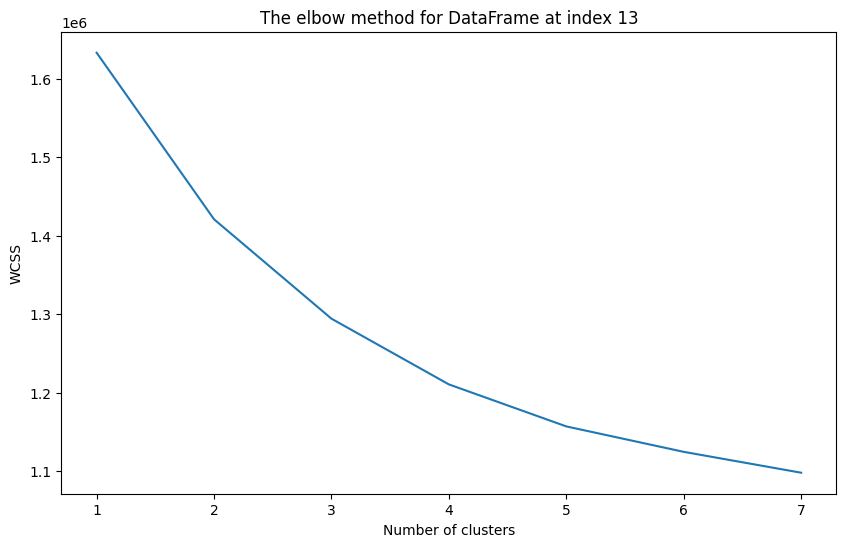

For cluster = 1, SSE/WCSS is 434580920600012.44
For cluster = 2, SSE/WCSS is 288040511869486.9
For cluster = 3, SSE/WCSS is 220474873955025.28
For cluster = 4, SSE/WCSS is 178856365576272.9
For cluster = 5, SSE/WCSS is 148150716297407.0
For cluster = 6, SSE/WCSS is 129901680427888.52
For cluster = 7, SSE/WCSS is 114072515571207.53


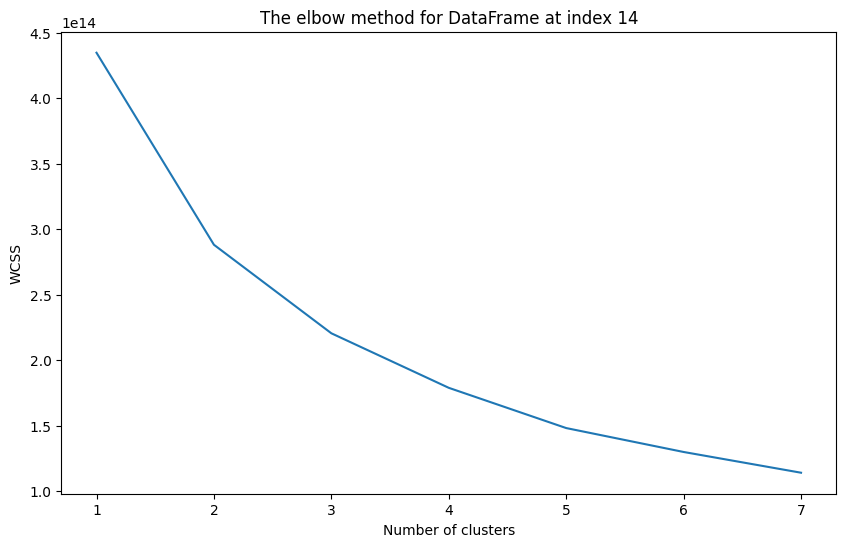

In [405]:
# Iterate over df_with_pca list
for i in range(len(df_list_with_pca)):
  elbow_method(df_list_with_pca[i], i)

In [406]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

def visualize_silhouette(cluster_lists, X_features, index_of_df):
    print(f"Silhouette Plot for DataFrame at {index_of_df}")
    n_cols = len(cluster_lists)
    fig, axs = plt.subplots(figsize=(4 * n_cols, 4), nrows=1, ncols=n_cols)

    for ind, n_cluster in enumerate(cluster_lists):
        clusterer = KMeans(n_clusters=n_cluster, max_iter=500, random_state=0, init='k-means++')
        cluster_labels = clusterer.fit_predict(X_features)

        sil_avg = silhouette_score(X_features, cluster_labels)
        sil_values = silhouette_samples(X_features, cluster_labels)

        y_lower = 10

        # Correct handling of single subplot case
        if n_cols == 1:
            ax = axs
        else:
            ax = axs[ind]

        ax.set_title('Number of Cluster : ' + str(n_cluster) + '\n' +
                     'Silhouette Score :' + str(round(sil_avg, 3)))
        ax.set_xlabel("The silhouette coefficient values")
        ax.set_ylabel("Cluster label")
        ax.set_xlim([-0.1, 1])
        ax.set_ylim([0, len(X_features) + (n_cluster + 1) * 10])
        ax.set_yticks([])  # Clear the yaxis labels / ticks
        ax.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

        for i in range(n_cluster):
            ith_cluster_sil_values = sil_values[cluster_labels == i]
            ith_cluster_sil_values.sort()

            size_cluster_i = ith_cluster_sil_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_cluster)
            ax.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_sil_values,
                             facecolor=color, edgecolor=color, alpha=0.7)
            ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10

        ax.axvline(x=sil_avg, color="red", linestyle="--")
    plt.show()

Silhouette Plot for DataFrame at 0


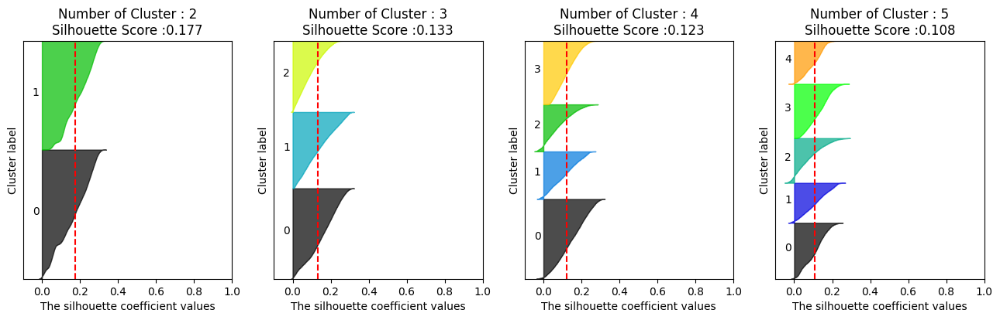

Silhouette Plot for DataFrame at 1


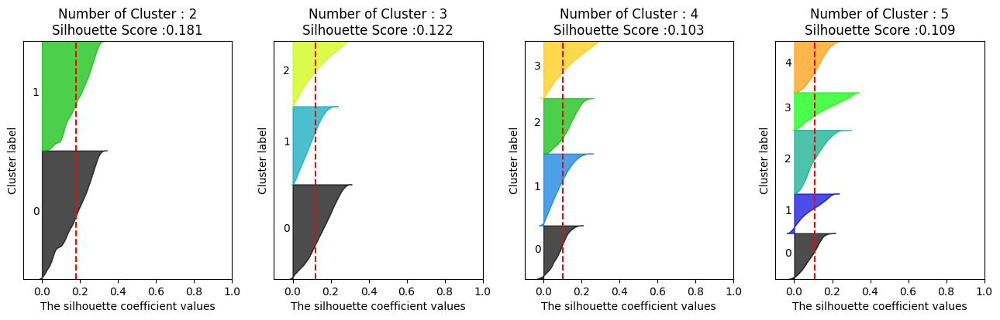

Silhouette Plot for DataFrame at 2


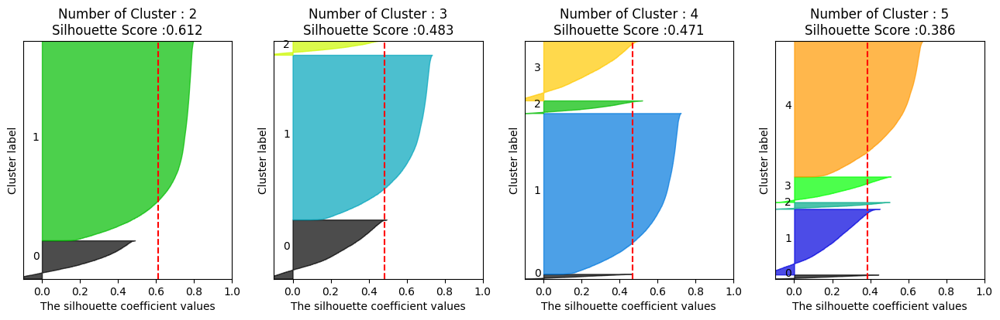

Silhouette Plot for DataFrame at 3


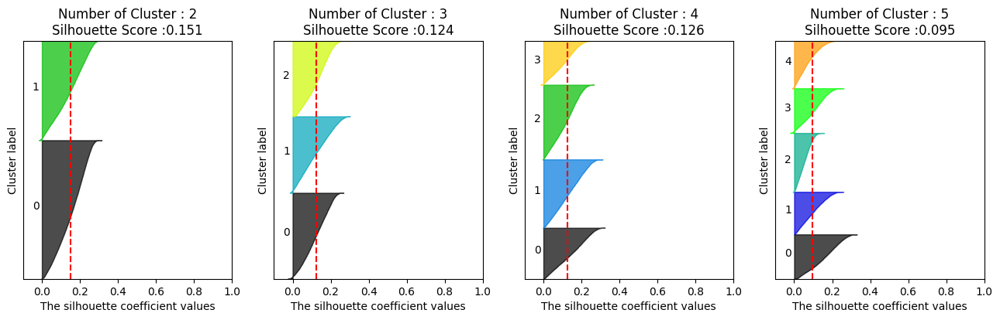

Silhouette Plot for DataFrame at 4


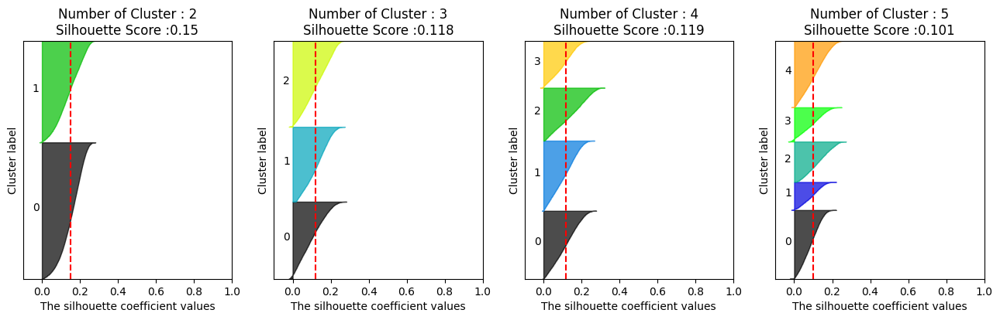

Silhouette Plot for DataFrame at 5


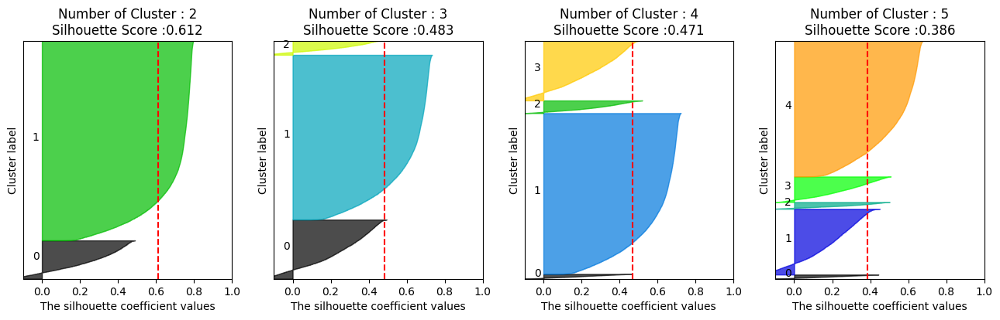

Silhouette Plot for DataFrame at 6


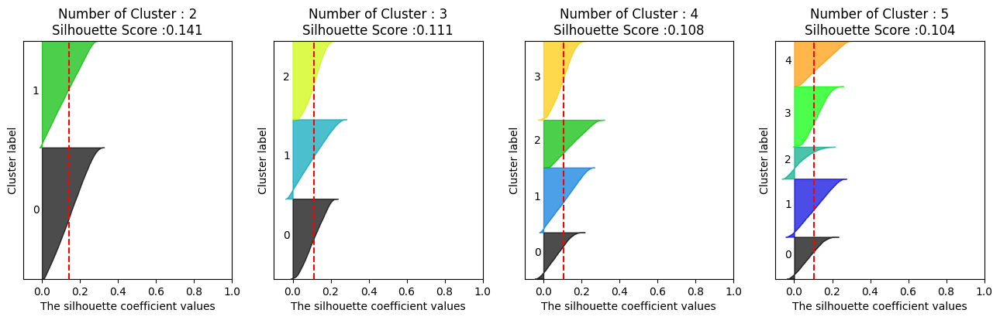

Silhouette Plot for DataFrame at 7


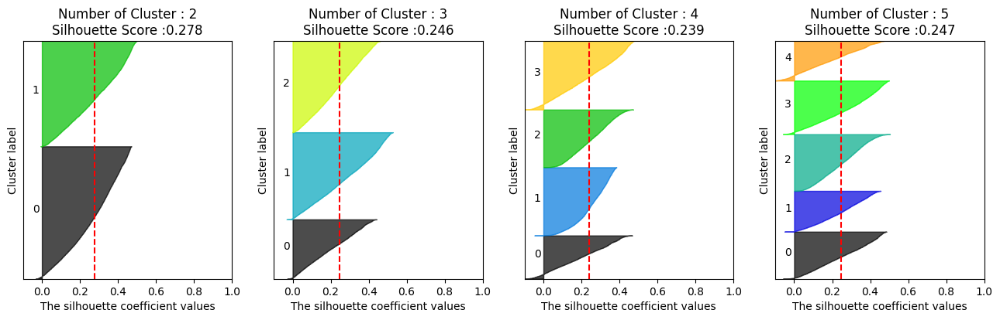

Silhouette Plot for DataFrame at 8


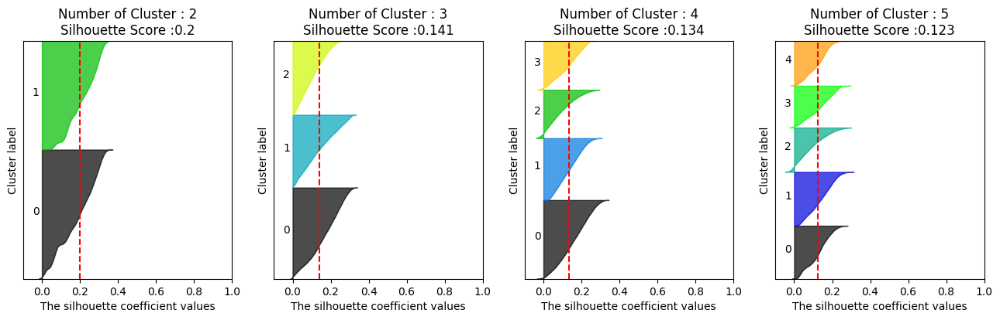

Silhouette Plot for DataFrame at 9


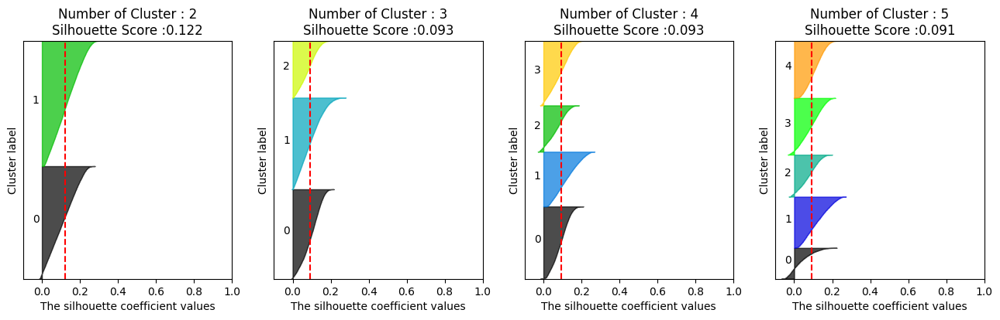

Silhouette Plot for DataFrame at 10


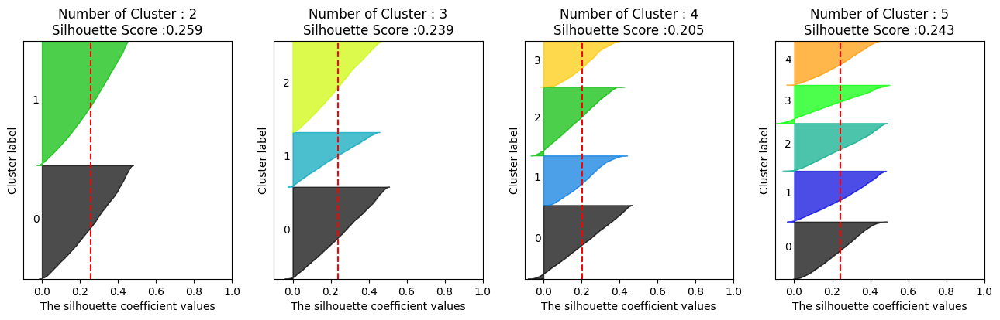

Silhouette Plot for DataFrame at 11


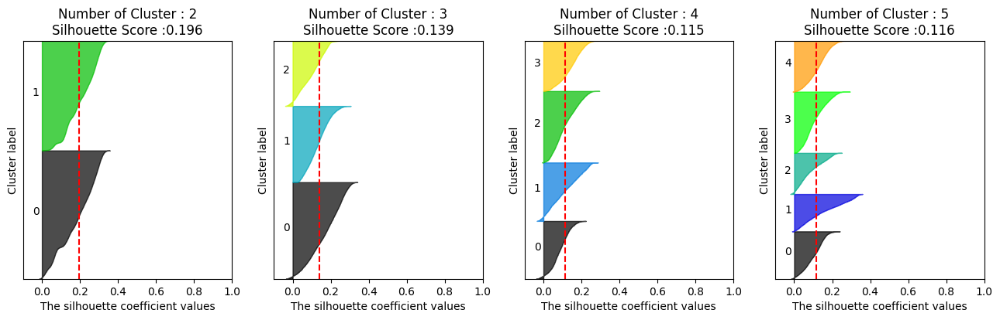

Silhouette Plot for DataFrame at 12


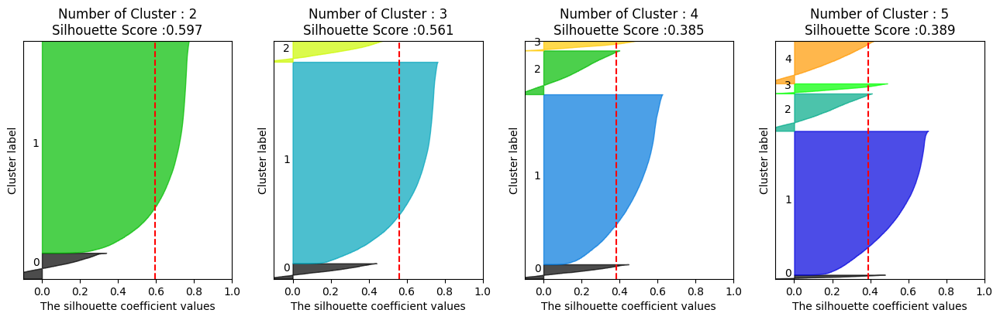

Silhouette Plot for DataFrame at 13


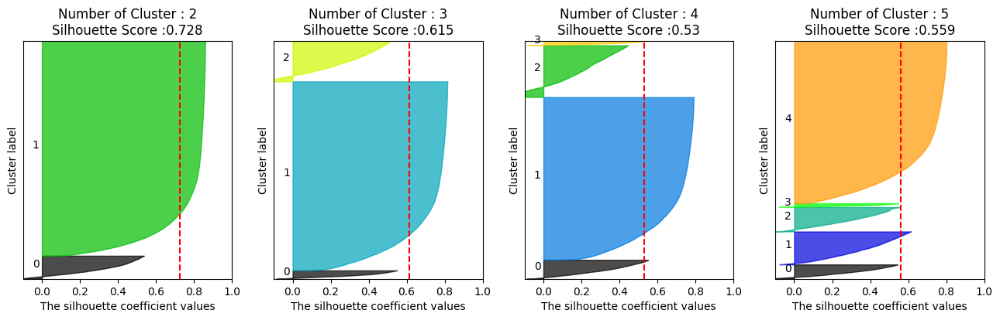

Silhouette Plot for DataFrame at 14


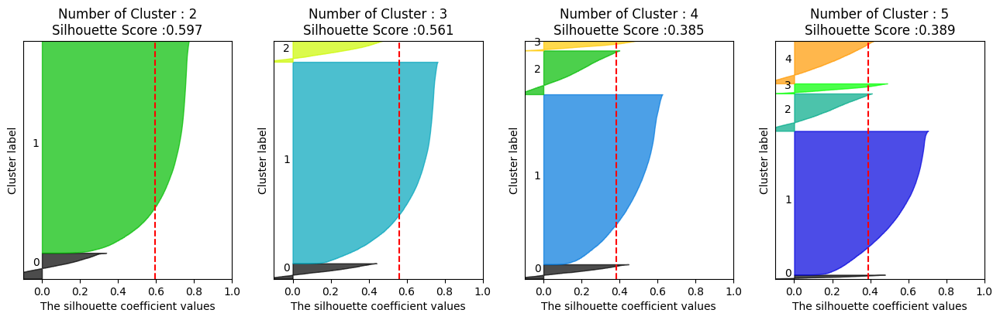

Silhouette Plot for DataFrame at 15


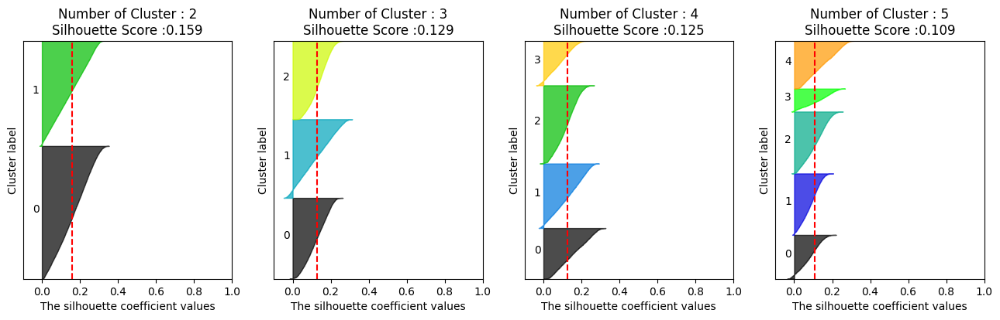

Silhouette Plot for DataFrame at 16


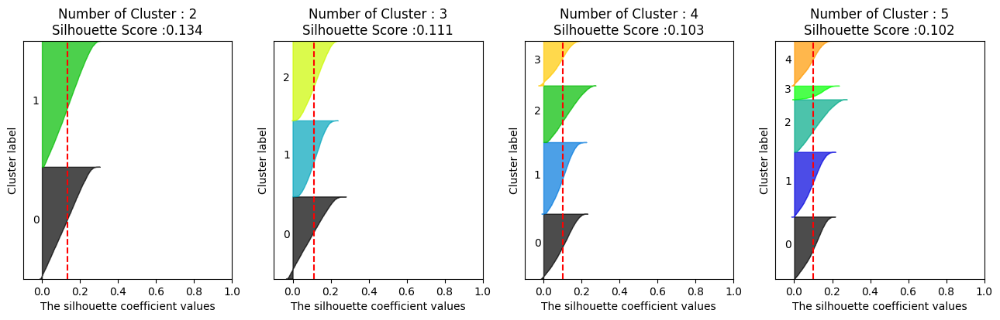

Silhouette Plot for DataFrame at 17


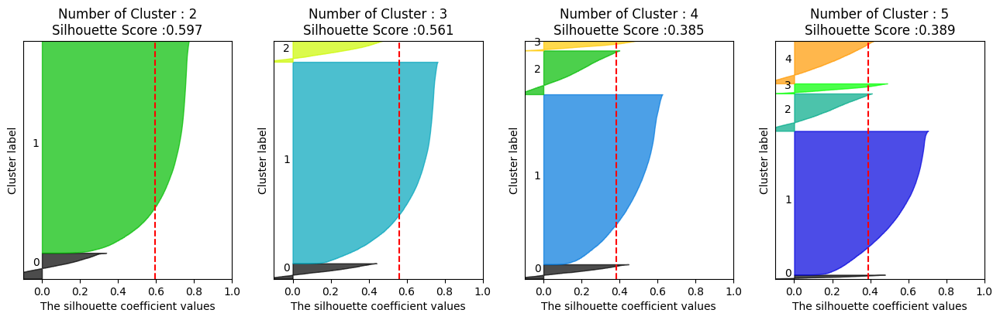

In [ ]:
for i in range(len(df_list_no_pca)):
  visualize_silhouette([2, 3, 4, 5], df_list_no_pca[i], i)

Silhouette Plot for DataFrame at 0


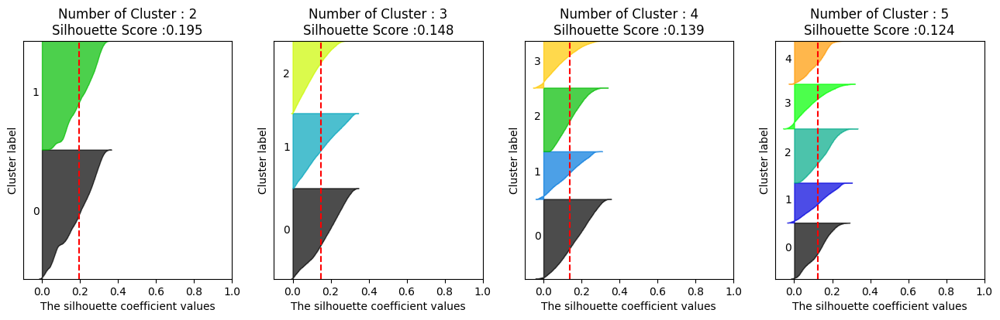

Silhouette Plot for DataFrame at 1


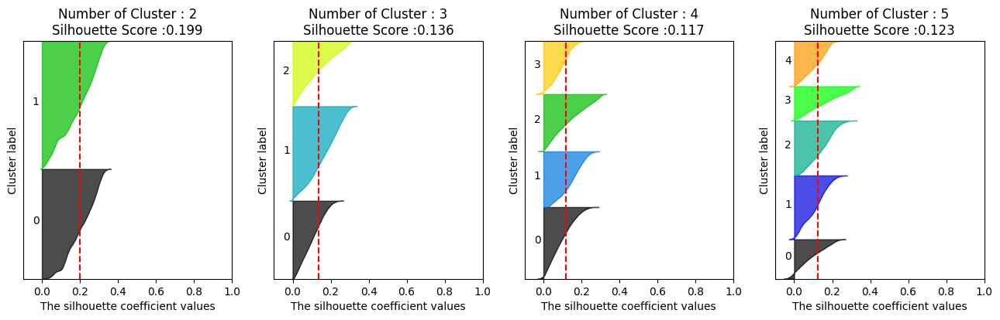

Silhouette Plot for DataFrame at 2


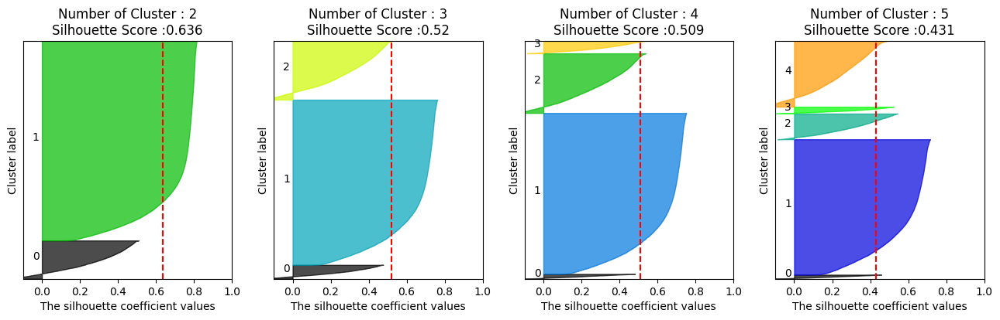

Silhouette Plot for DataFrame at 3


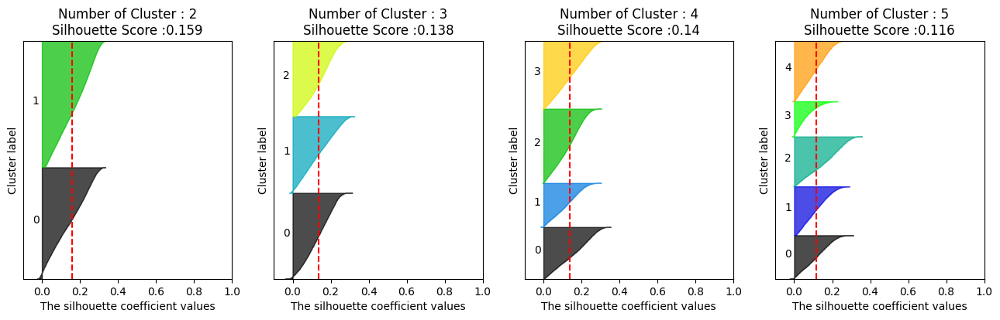

Silhouette Plot for DataFrame at 4


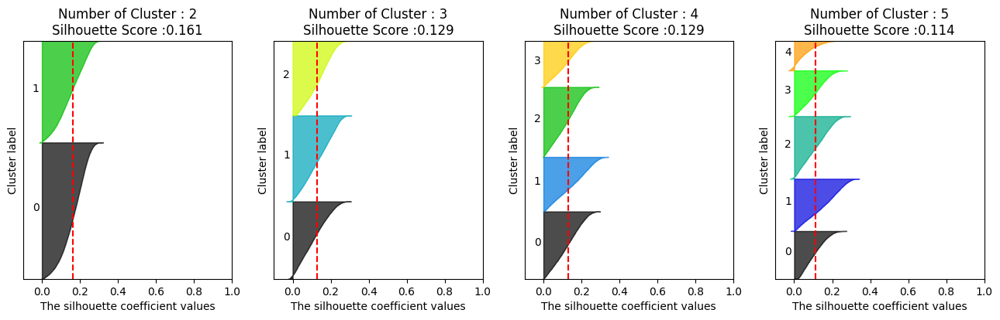

Silhouette Plot for DataFrame at 5


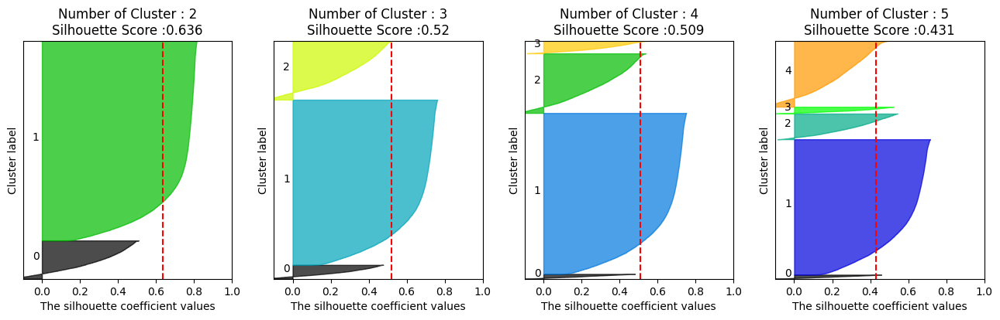

Silhouette Plot for DataFrame at 6


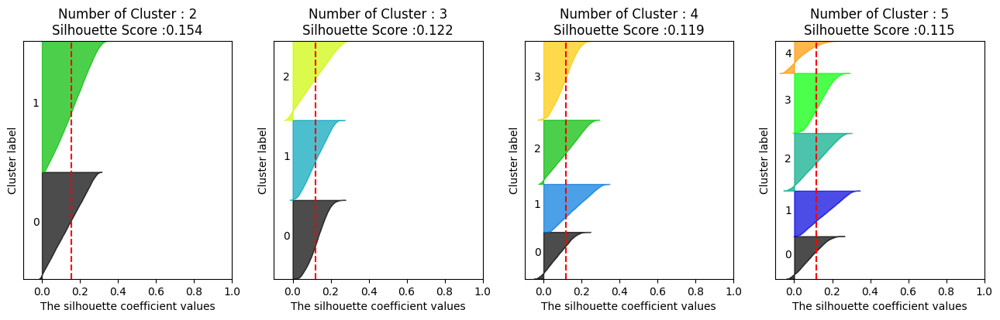

Silhouette Plot for DataFrame at 7


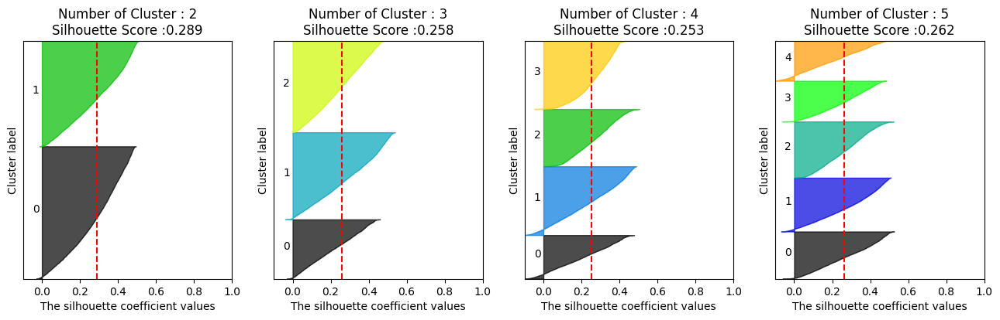

Silhouette Plot for DataFrame at 8


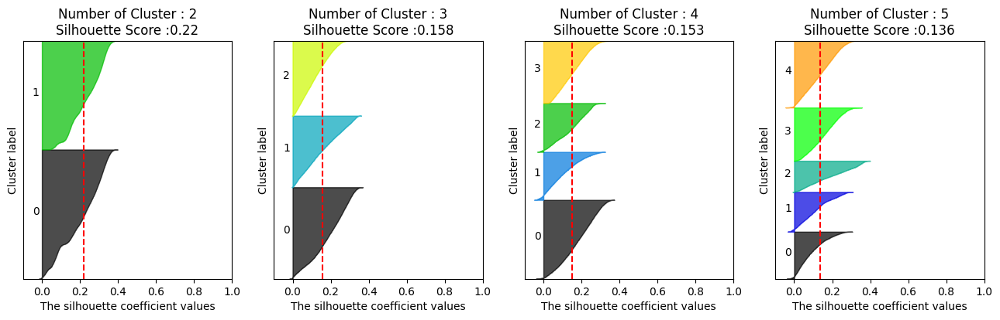

Silhouette Plot for DataFrame at 9


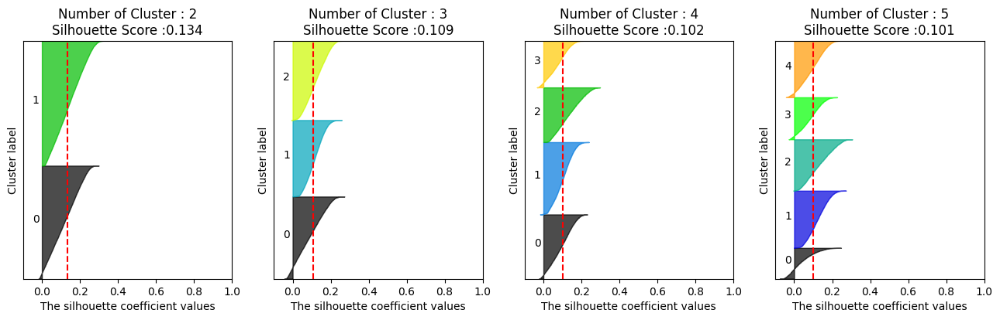

Silhouette Plot for DataFrame at 10


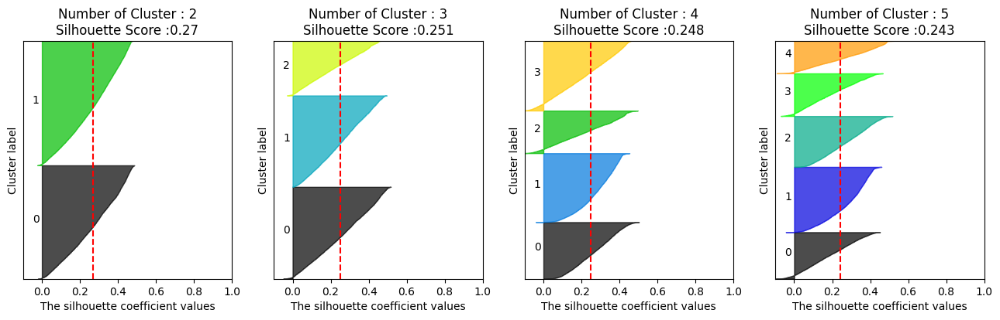

Silhouette Plot for DataFrame at 11


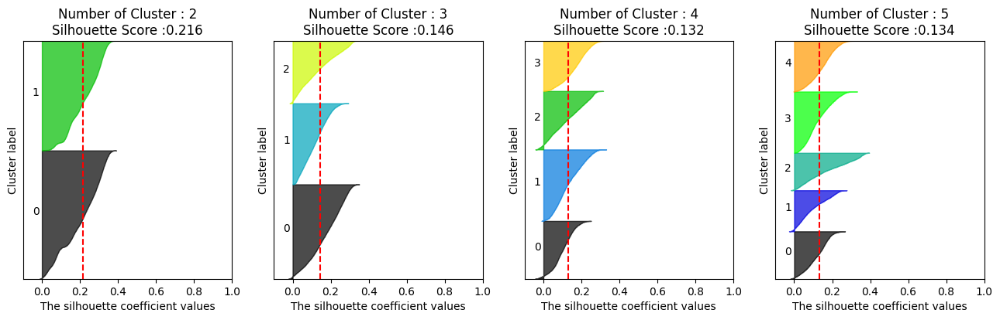

Silhouette Plot for DataFrame at 12


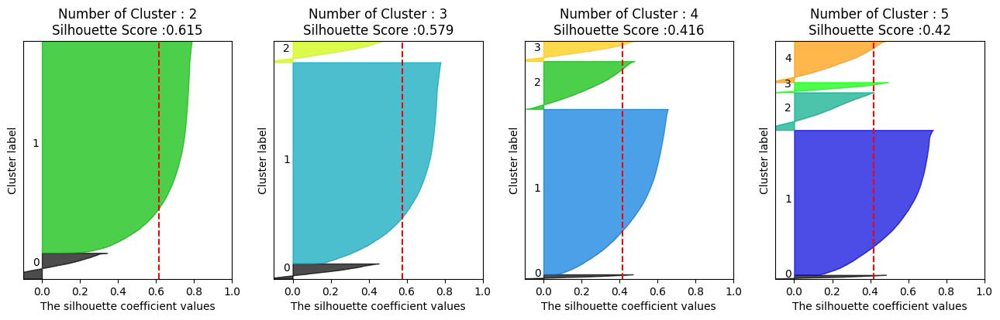

Silhouette Plot for DataFrame at 13


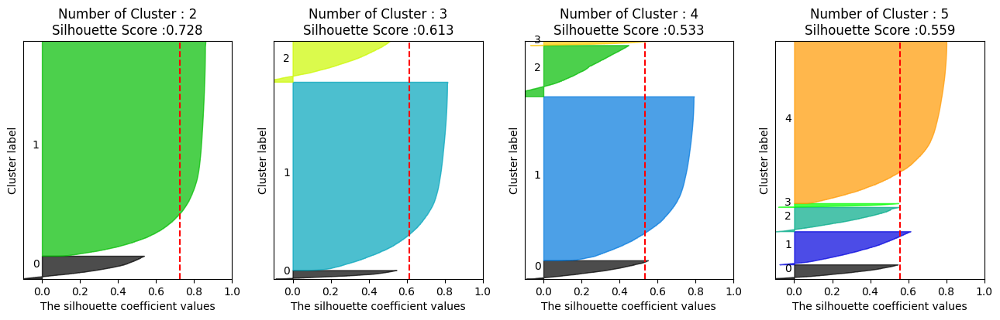

Silhouette Plot for DataFrame at 14


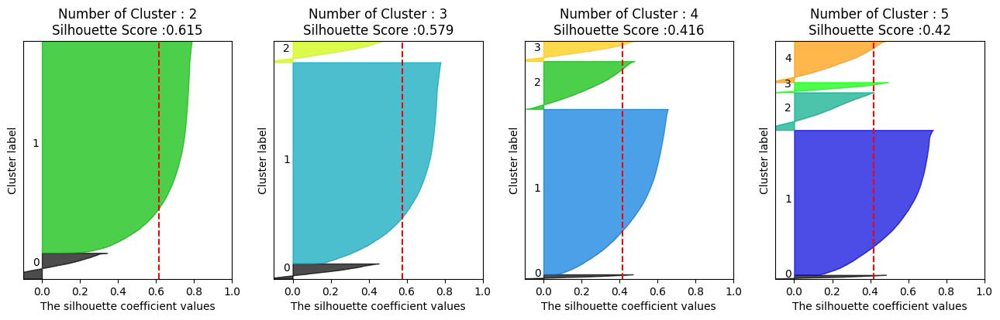

Silhouette Plot for DataFrame at 15


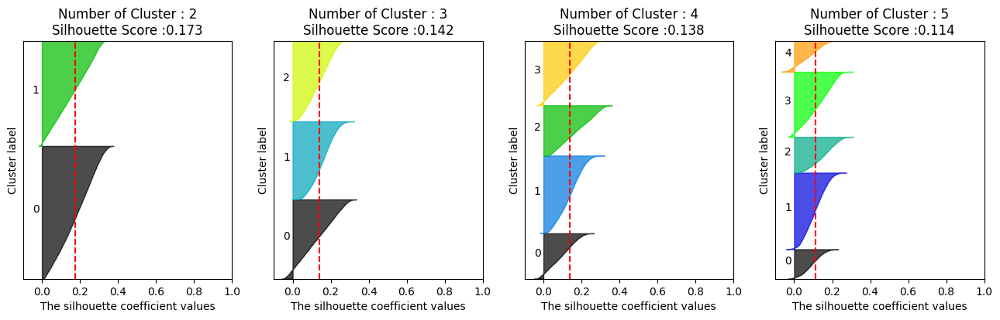

Silhouette Plot for DataFrame at 16


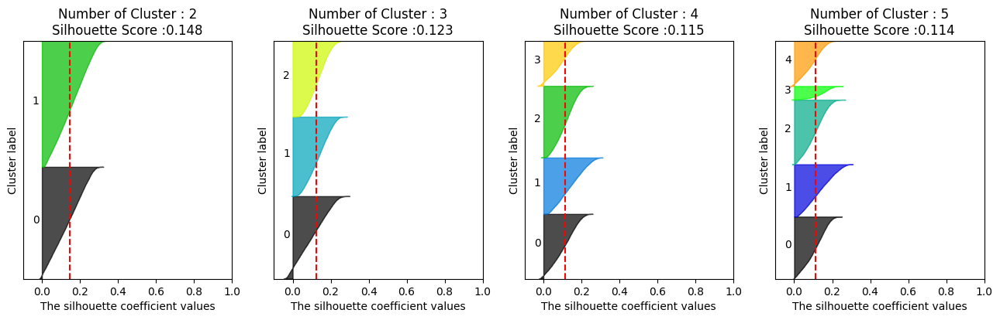

Silhouette Plot for DataFrame at 17


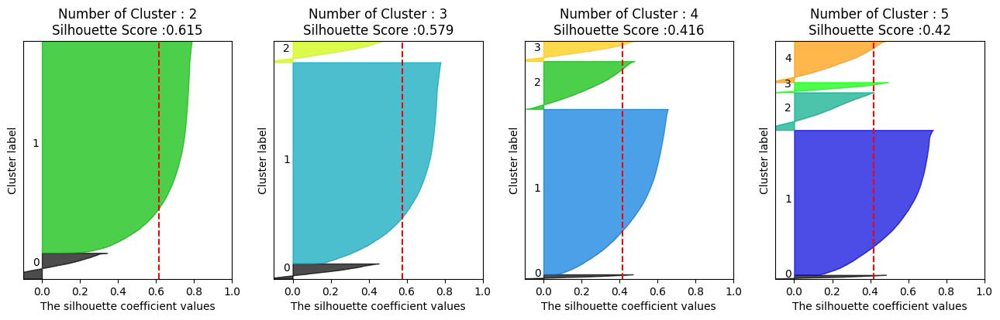

In [ ]:
for i in range(len(df_list_with_pca)):
  visualize_silhouette([2, 3, 4, 5], df_list_with_pca[i], i)

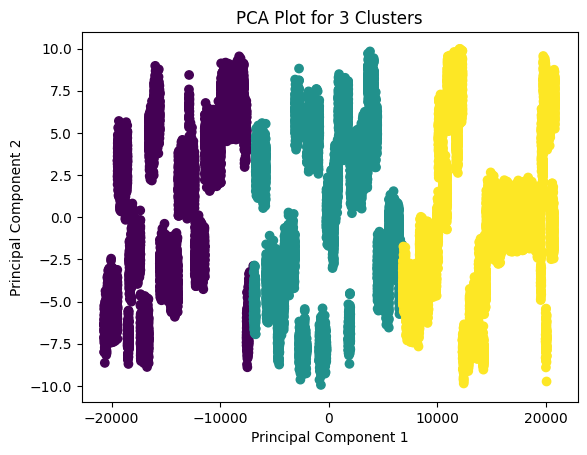

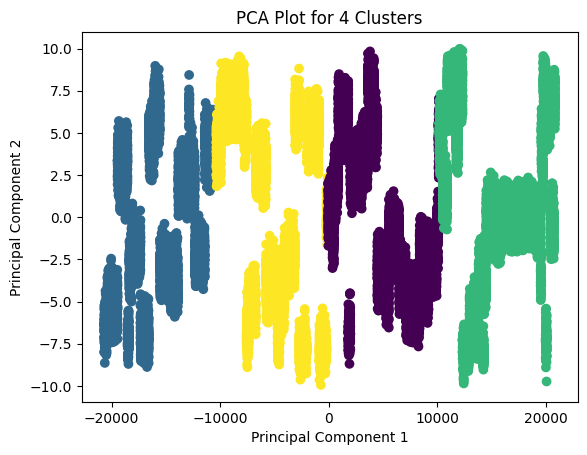

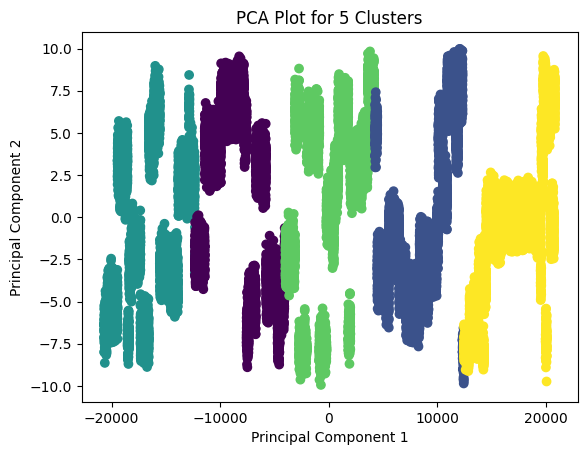

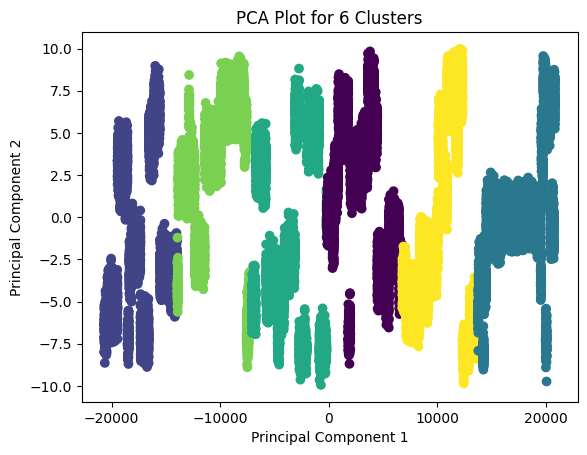

In [ ]:
# Train a KMeans Model
for i in range(3, 7):
  kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300,
                  n_init = 10, random_state = 0)
  df_orig_feature_pca = kmeans.fit_predict(df_list_with_pca[29])
  plt.scatter(df_list_with_pca[29][:, 0], df_list_with_pca[29][:, 1], c=kmeans.labels_)
  plt.xlabel('Principal Component 1')
  plt.ylabel('Principal Component 2')
  plt.title(f'PCA Plot for {i} Clusters')
  plt.show()

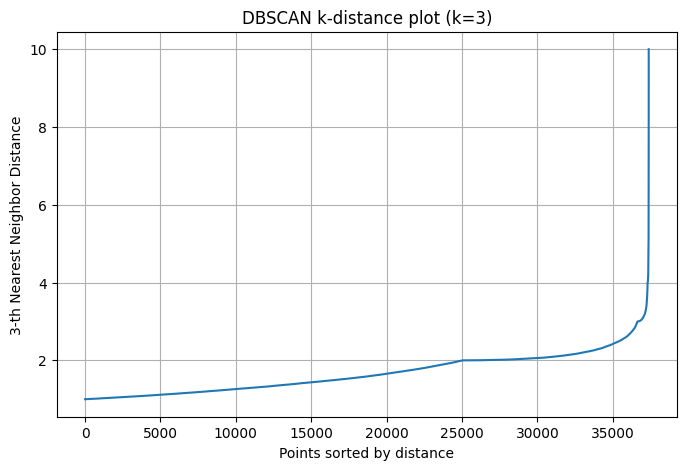

Suggested eps for DBSCAN: 2.2498


In [ ]:
def find_optimal_eps(data, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(data)
    distances, _ = neigh.kneighbors(data)

    k_distances = np.sort(distances[:, k-1])

    plt.figure(figsize=(8, 5))
    plt.plot(k_distances)
    plt.xlabel("Points sorted by distance")
    plt.ylabel(f"{k}-th Nearest Neighbor Distance")
    plt.title(f"DBSCAN k-distance plot (k={k})")
    plt.grid(True)
    plt.show()

    return k_distances[int(len(k_distances) * 0.9)]

optimal_eps = find_optimal_eps(df_list_with_pca[29], k=3)
print(f"Suggested eps for DBSCAN: {optimal_eps:.4f}")

In [ ]:
dbscan = DBSCAN(eps=2.2498, min_samples=3, metric='euclidean')
y_DBScan = dbscan.fit_predict(df_list_with_pca[29])

In [ ]:
labels = dbscan.labels_
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_clusters_

1964

In [ ]:
n_noise_ = list(labels).count(-1)
n_noise_

888

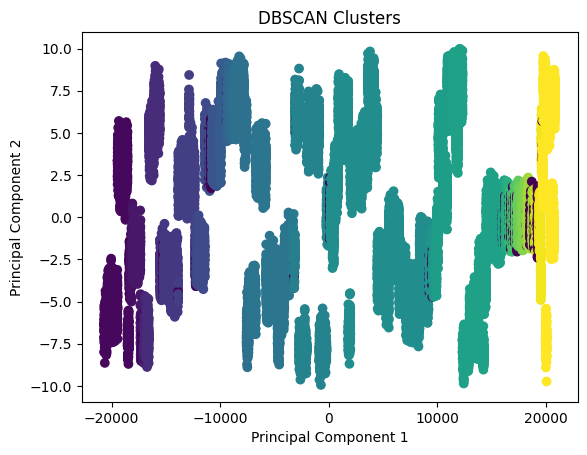

In [ ]:
# Plot DBSCAN Clusters in PCA
plt.scatter(df_list_with_pca[29][:, 0], df_list_with_pca[29][:, 1], c=labels)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('DBSCAN Clusters')
plt.show()

In [ ]:
silhouette_score = metrics.silhouette_score(df_list_with_pca[29], labels)
silhouette_score

0.22678361298003813

# Profiling / Describing the Clusters

In [ ]:
# Fetch the K-means cluster labels
cluster_labels = kmeans.labels_

In [ ]:
# Locate indices from df_non_outliers and store created clusters
df['Cluster'] = cluster_labels

In [ ]:
# Profiling columns
expenditure_columns = ['Total Food Expenditure', 'Restaurant and hotels Expenditure',
                                'Housing and water Expenditure', 'Alcoholic Beverages Expenditure',
                                'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
                                'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure', 'Medical Care Expenditure',
                                'Education Expenditure', 'Communication Expenditure', 'Transportation Expenditure', 'Crop Farming and Gardening expenses',
                                'Total_Essential_Spending', 'Total_NonEssential_Spending', 'Total Expenditure']

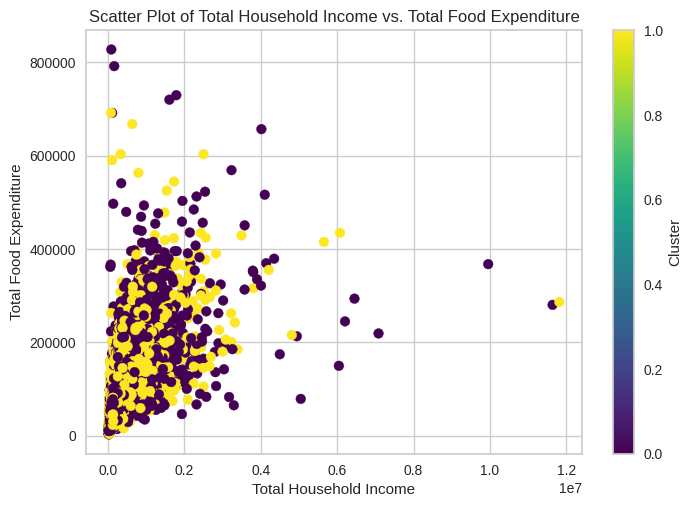

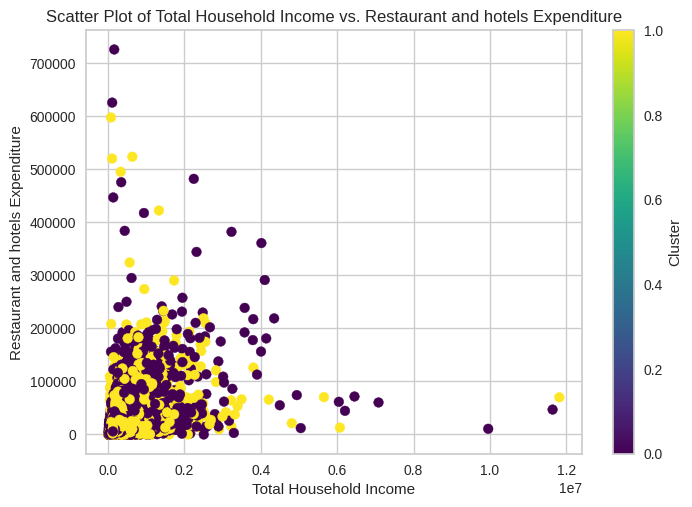

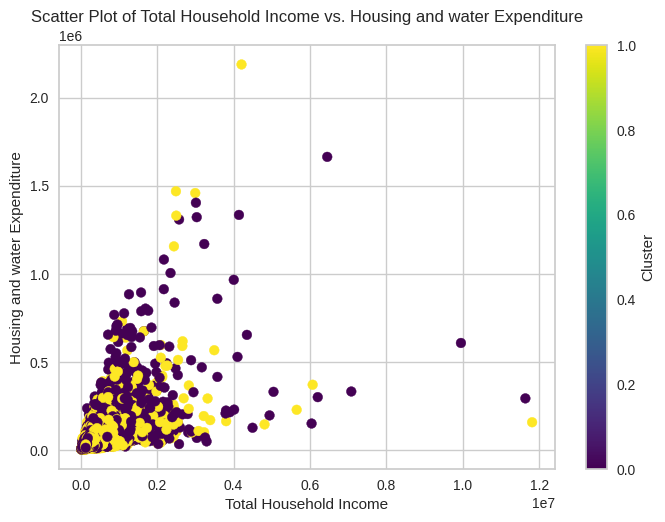

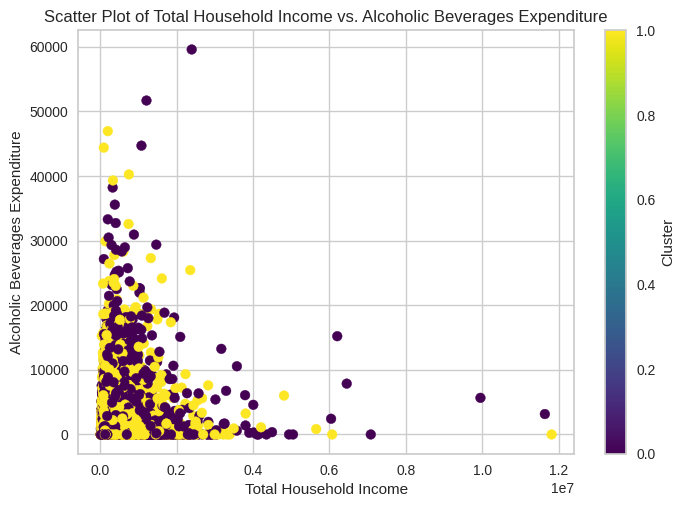

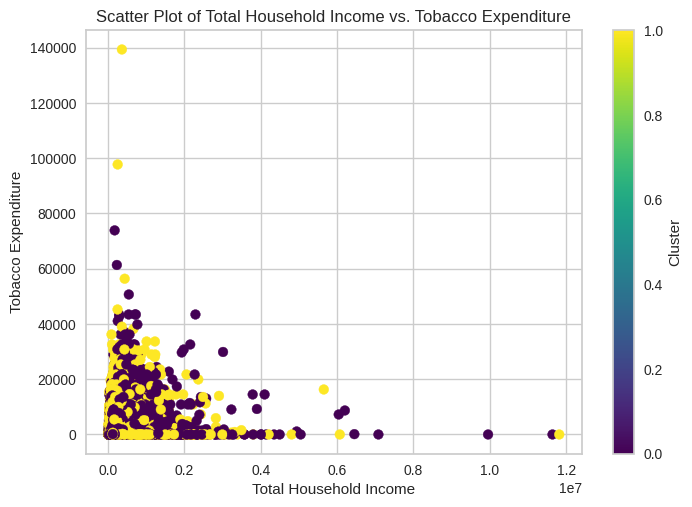

...

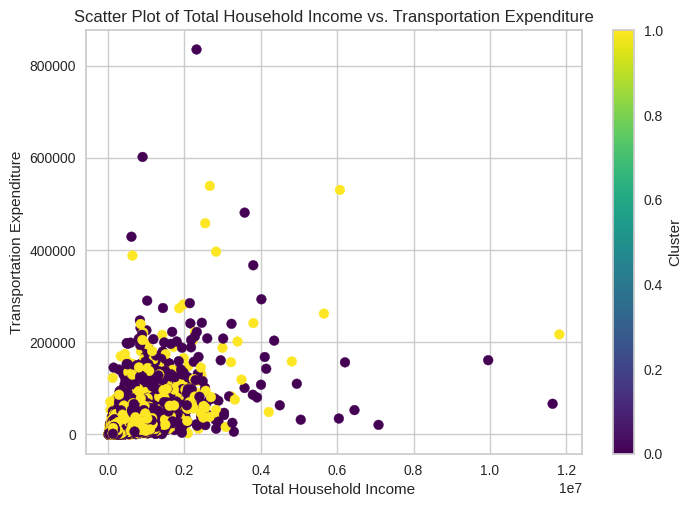

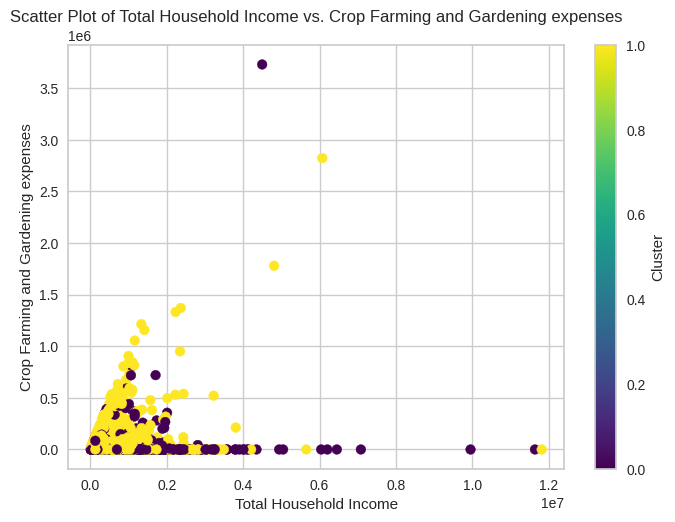

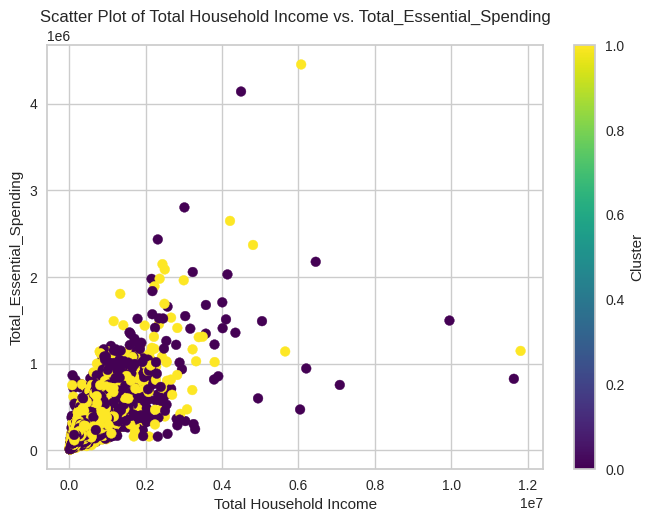

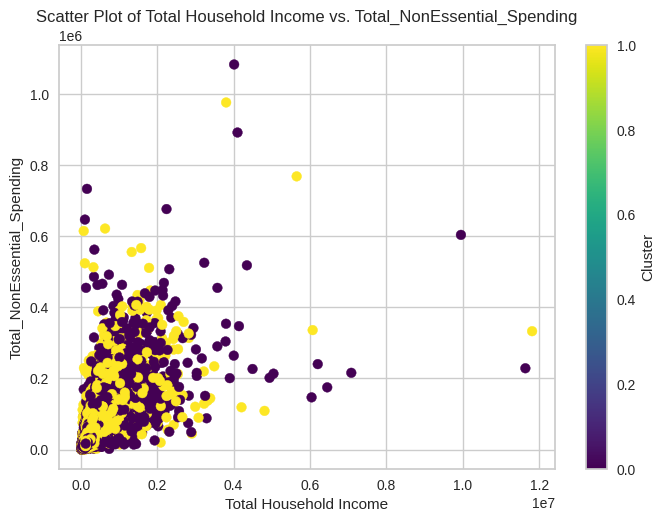

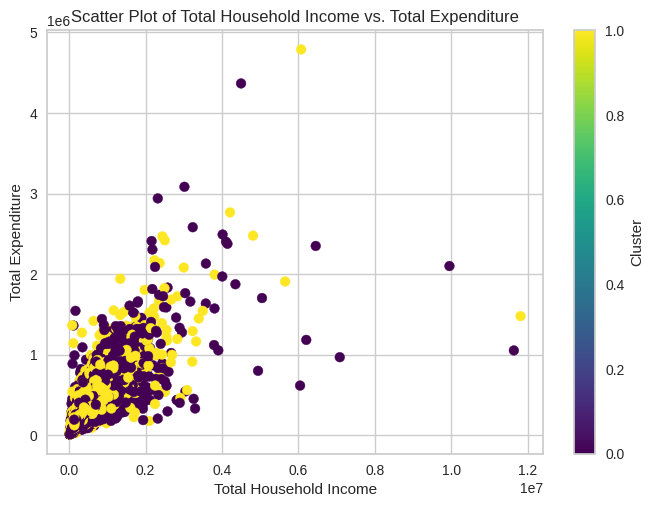

In [ ]:
# Scatter plot of Total Household Income versus each column in expenditure columns. Color code and label the dots based on 'Cluster' column
for column in expenditure_columns:
    plt.scatter(df['Total Household Income'], df[column], c=df['Cluster'], cmap='viridis')
    plt.xlabel('Total Household Income')
    plt.ylabel(column)
    plt.title(f'Scatter Plot of Total Household Income vs. {column}')
    plt.colorbar(label='Cluster')
    plt.show()

In [ ]:
# Display Mean values for each expenditure column, group by cluster
df.groupby('Cluster')[expenditure_columns].mean()

,Total Food Expenditure,Restaurant and hotels Expenditure,Housing and water Expenditure,Alcoholic Beverages Expenditure,Tobacco Expenditure,"Clothing, Footwear and Other Wear Expenditure",Miscellaneous Goods and Services Expenditure,Special Occasions Expenditure,Medical Care Expenditure,Education Expenditure,Communication Expenditure,Transportation Expenditure,Crop Farming and Gardening expenses,Total_Essential_Spending,Total_NonEssential_Spending,Total Expenditure
Cluster,,,,,,,,,,,,,,,,
0,92095.422353,18906.127639,47345.230869,1048.898817,2194.836220,5486.215295,14217.780662,5818.931563,9303.720561,8543.273449,5176.426696,13686.412719,3850.754355,180001.241002,47672.790196,227674.031199
1,78600.636998,12202.478354,30029.529932,1118.926543,2387.208547,4462.312029,10950.994042,4754.020296,5168.672796,6485.425100,3091.817987,10062.912485,23128.456289,156567.451587,35875.939810,192443.391397


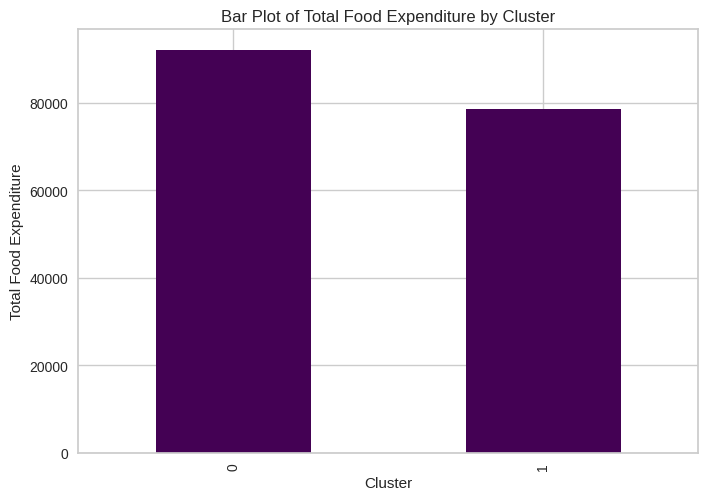

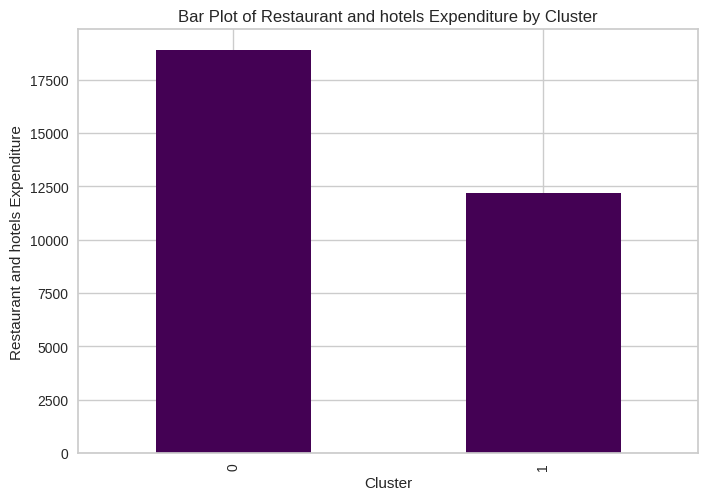

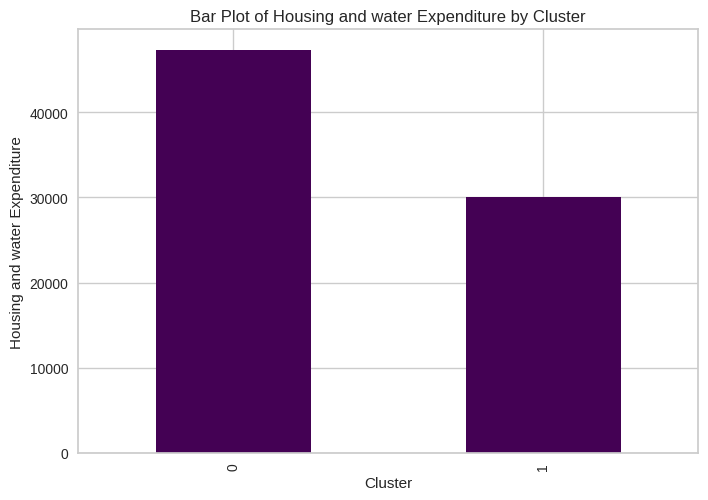

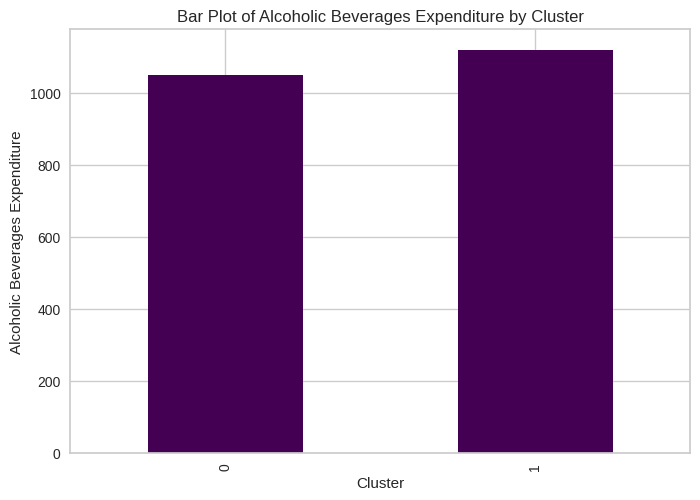

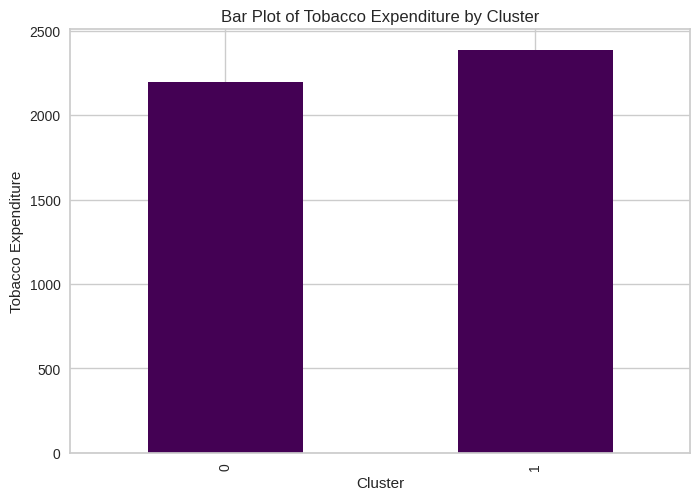

...

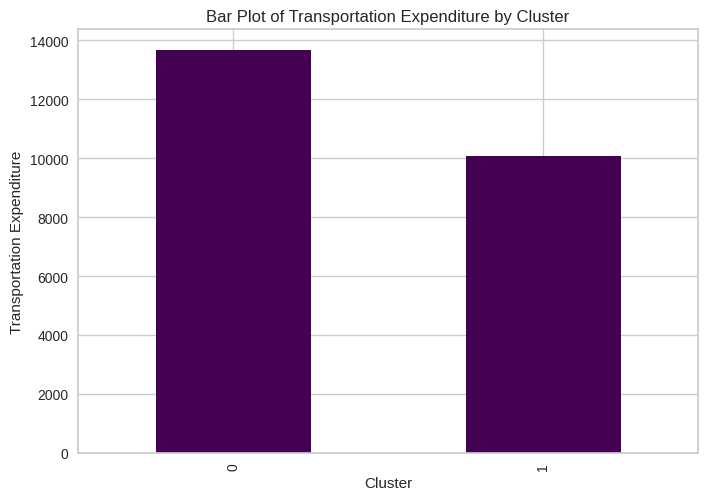

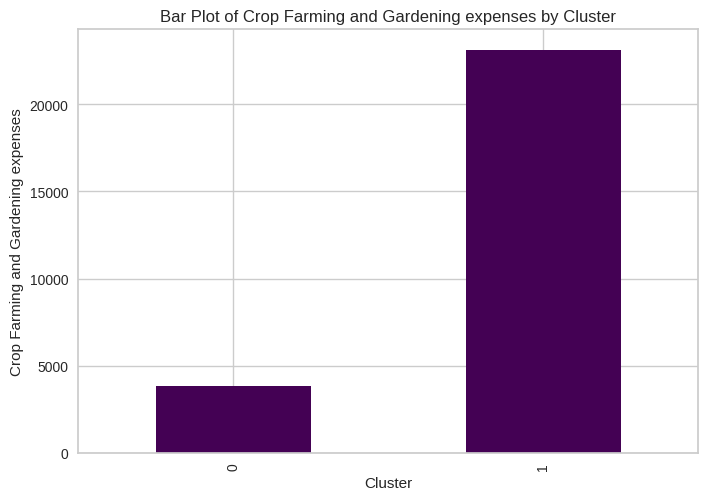

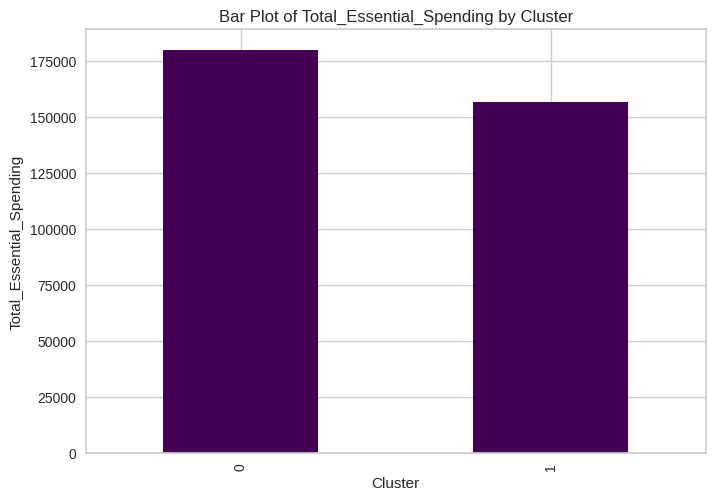

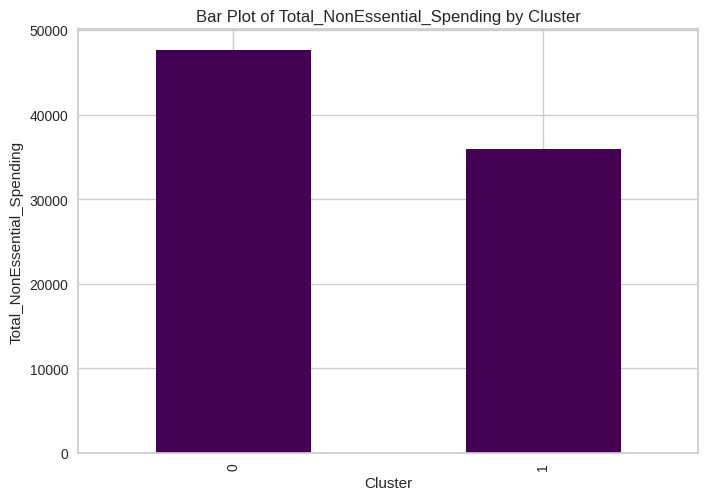

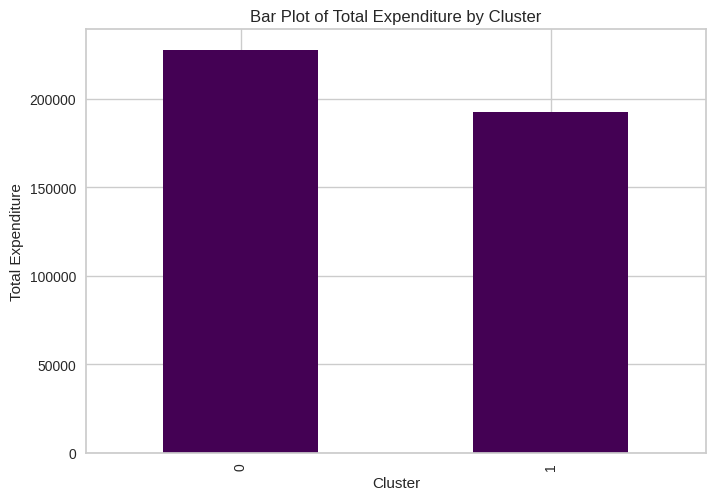

In [ ]:
# Bar Plot for Expenditure Columns, based on Cluster and color coded
for column in expenditure_columns:
    df.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

In [ ]:
# Display Mean values for each income column, group by cluster
df.groupby('Cluster')[income_columns].mean()

,Total Household Income,Total Income from Entrepreneurial Acitivites,Remaining_Income,Amount_Outside_Income
Cluster,,,,
0,282099.593571,56485.744422,64312.307942,9886.745570
1,215511.243273,52419.814030,41447.372219,18379.520343


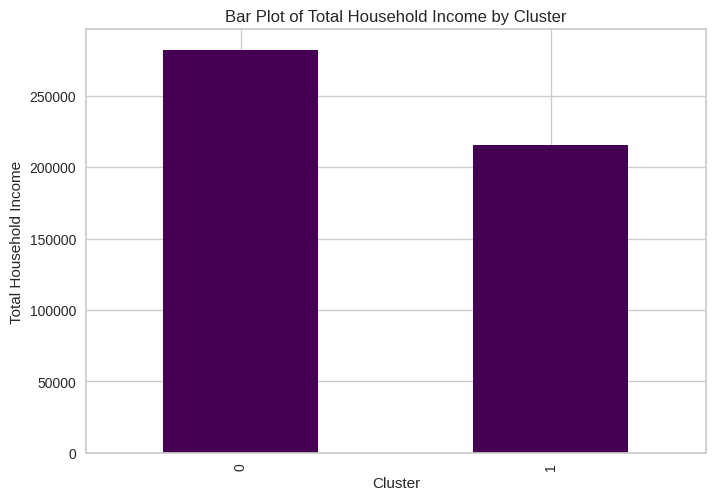

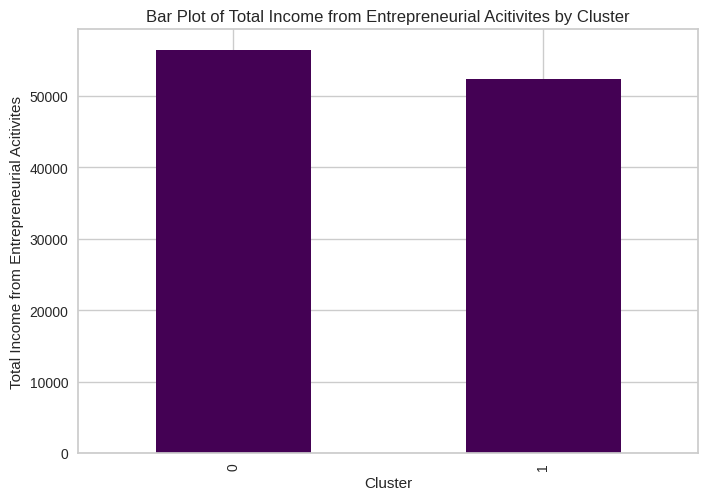

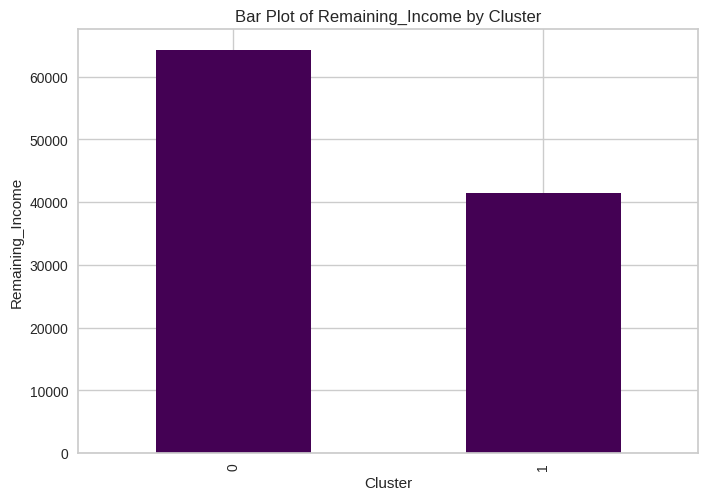

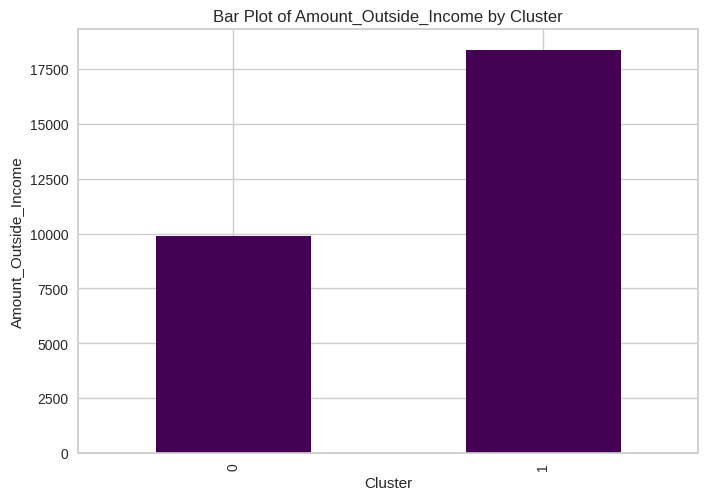

In [ ]:
# Bar Plot for Income Columns, based on Cluster and color coded
for column in income_columns:
    df.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

<Figure size 1400x800 with 0 Axes>

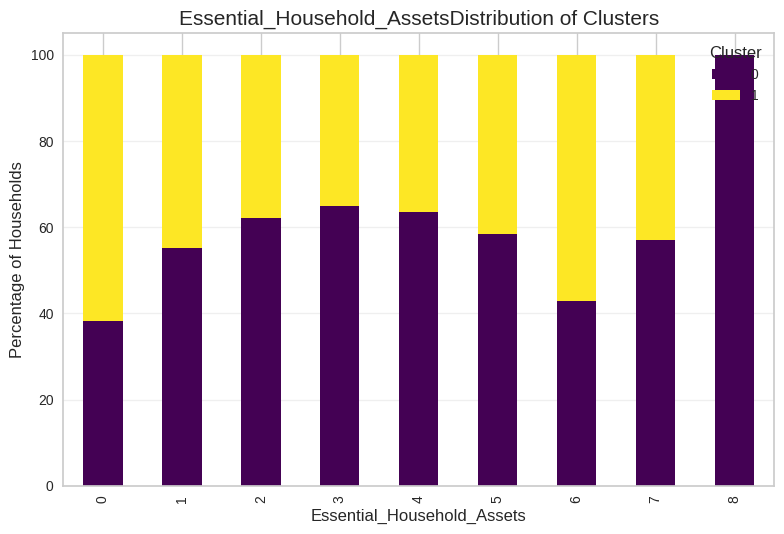

<Figure size 1400x800 with 0 Axes>

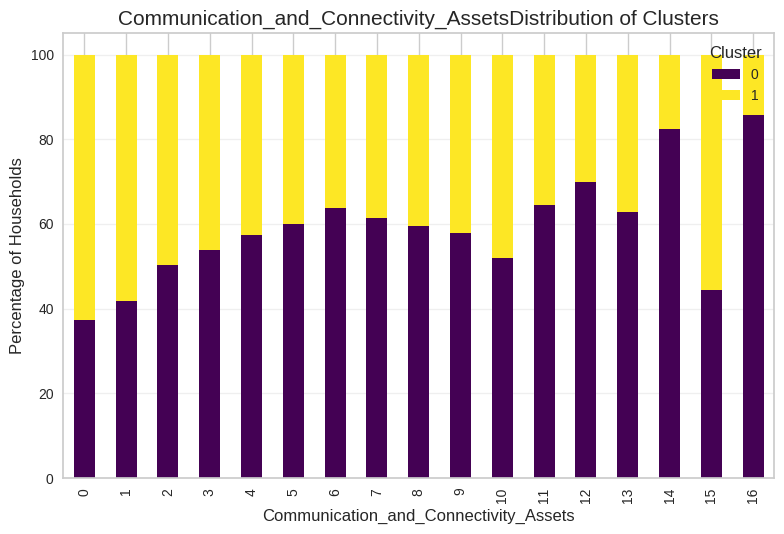

<Figure size 1400x800 with 0 Axes>

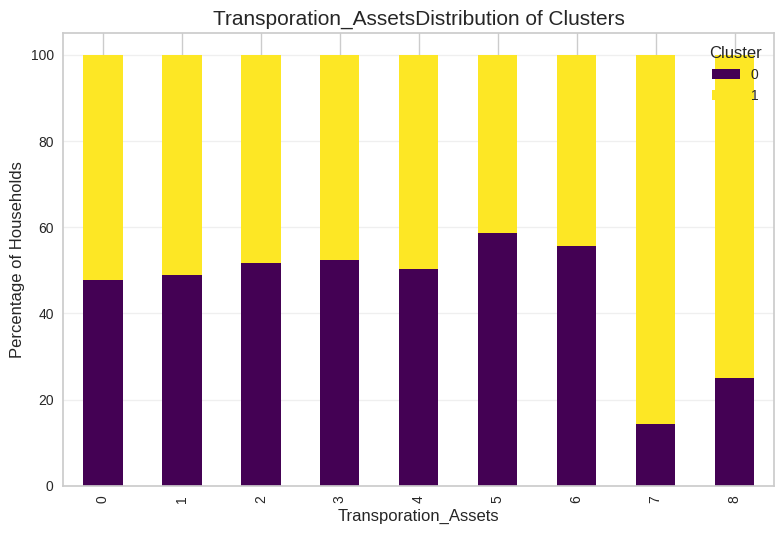

<Figure size 1400x800 with 0 Axes>

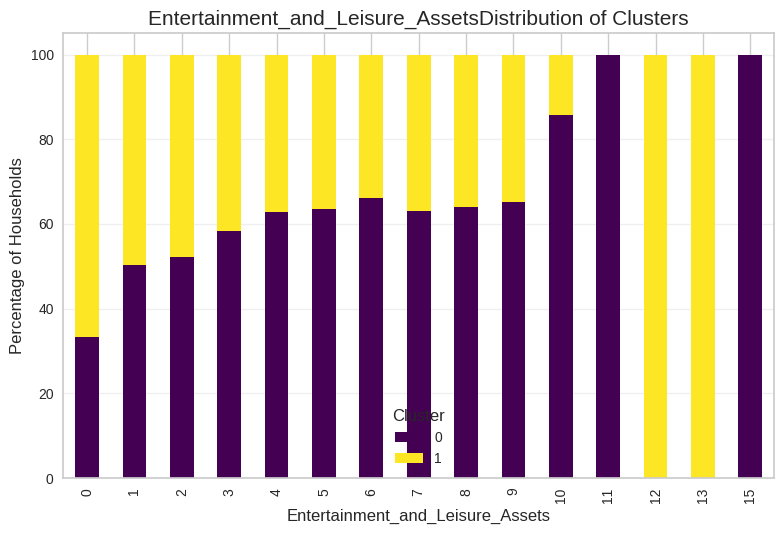

<Figure size 1400x800 with 0 Axes>

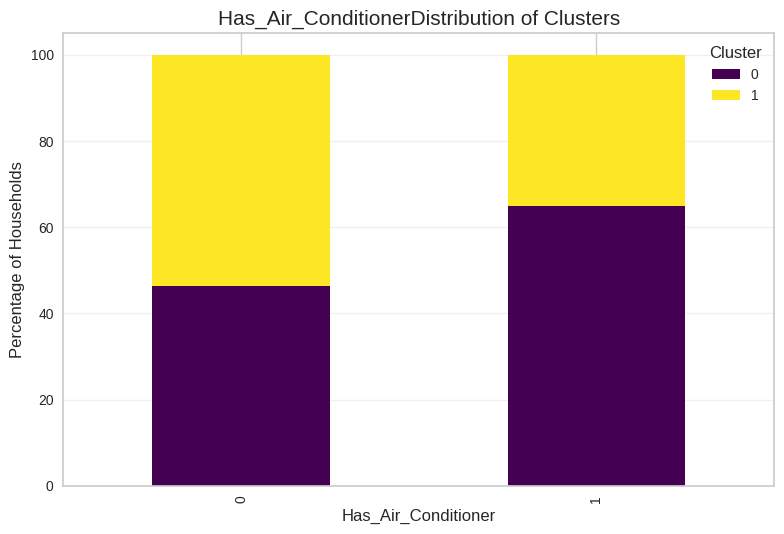

In [ ]:
# Show Distribution of columns per Household Assets per Cluster
for col in household_assets:
  region_cluster_distribution = pd.crosstab(
      df[col],
      df['Cluster'],
      normalize='index'
  ) * 100

  plt.figure(figsize=(14, 8))
  region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
  plt.title(f'{col}Distribution of Clusters', fontsize=15)
  plt.xlabel(col, fontsize=12)
  plt.ylabel('Percentage of Households', fontsize=12)
  plt.legend(title='Cluster')
  plt.grid(True, alpha=0.3, axis='y')
  plt.tight_layout()
  plt.show()


In [ ]:
# Display Counts per Region, group by cluster
df.groupby('Cluster')['Region'].value_counts()

Cluster  Region                   
0        NCR                          2867
         IVA - CALABARZON             2550
         III - Central Luzon          1968
         VI - Western Visayas         1317
         VII - Central Visayas        1266
         I - Ilocos Region            1213
         XI - Davao Region            1120
         V - Bicol Region             1059
         VIII - Eastern Visayas       1015
         XII - SOCCSKSARGEN            871
         X - Northern Mindanao         824
         Caraga                        779
         II - Cagayan Valley           774
         IX - Zasmboanga Peninsula     713
         CAR                           629
          ARMM                         603
         IVB - MIMAROPA                465
1         ARMM                        1643
         IVA - CALABARZON             1609
         VI - Western Visayas         1532
         II - Cagayan Valley          1445
         V - Bicol Region             1412
         XI - Davao Region            1324
         VIII - Eastern Visayas       1321
         VII - Central Visayas        1275
         III - Central Luzon          1268
         NCR                          1252
         XII - SOCCSKSARGEN           1248
         I - Ilocos Region            1133
         CAR                          1096
         IX - Zasmboanga Peninsula    1074
         X - Northern Mindanao        1063
         Caraga                       1003
         IVB - MIMAROPA                784
Name: count, dtype: int64

<Figure size 1400x800 with 0 Axes>

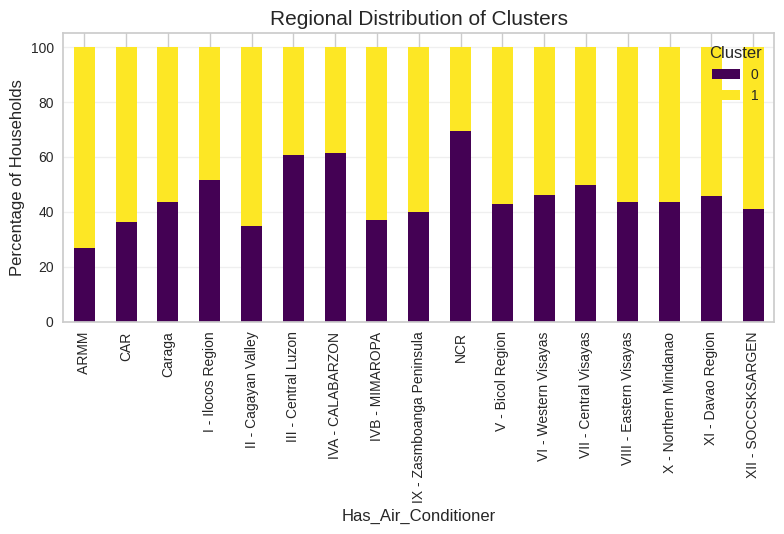

In [ ]:
region_cluster_distribution = pd.crosstab(
    df['Region'],
    df['Cluster'],
    normalize='index'
) * 100

plt.figure(figsize=(14, 8))
region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Regional Distribution of Clusters', fontsize=15)
plt.xlabel(col, fontsize=12)
plt.ylabel('Percentage of Households', fontsize=12)
plt.legend(title='Cluster')
plt.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()


In [ ]:
df.groupby('Cluster')['Household Head Highest Grade Completed'].value_counts()

Cluster  Household Head Highest Grade Completed
0        5                                         5313
         3                                         3329
         2                                         3171
         7                                         3137
         4                                         2381
         6                                         2238
         0                                          369
         8                                           92
         1                                            3
1        2                                         5643
         5                                         4309
         3                                         4306
         4                                         2508
         7                                         2303
         6                                         1389
         0                                          857
         8                                          155
         1                                           12
Name: count, dtype: int64

<Figure size 1400x800 with 0 Axes>

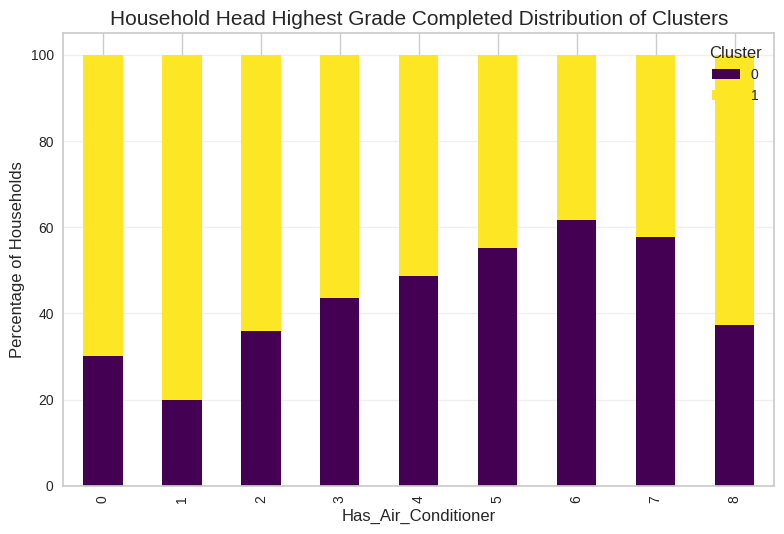

In [ ]:
region_cluster_distribution = pd.crosstab(
    df['Household Head Highest Grade Completed'],
    df['Cluster'],
    normalize='index'
) * 100

plt.figure(figsize=(14, 8))
region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Household Head Highest Grade Completed Distribution of Clusters', fontsize=15)
plt.xlabel(col, fontsize=12)
plt.ylabel('Percentage of Households', fontsize=12)
plt.legend(title='Cluster')
plt.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()


In [ ]:
df.groupby('Cluster')['Household Head Occupation'].value_counts()

Cluster  Household Head Occupation                                           
0        Uncategorized                                                            7536
         Wholesale and retail trade; repair of motor vehicles and motorcycles     4188
         Transportation and storage                                               4170
         Manufacturing                                                            2010
         Other service activities                                                 1227
         Professional, Scientific and Technical Activities                         279
         Human Health and Social Work Activities                                   276
         Mining and quarrying                                                      183
         Information and communication                                              92
         Real estate activities                                                     39
         Water supply, sewerage, waste management and remediation activities        33
1        Agriculture, forestry, and fishing                                      13543
         Construction                                                             2962
         Government and Public Service                                            1521
         Administrative and Support Service Activities                            1470
         Accommodation and food service activities                                 594
         Education                                                                 501
         Financial and insurance activities                                        300
         Electricity, gas, steam and air conditioning supply                       256
         Arts, Entertainment and Recreation                                        217
         Human Health and Social Work Activities                                    91
         Directors and chief executives of corporations                             27
Name: count, dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41515 entries, 0 to 41543
Data columns (total 77 columns):
 #   Column                                         Non-Null Count  Dtype 
---  ------                                         --------------  ----- 
 0   Total Household Income                         41515 non-null  int64 
 1   Region                                         41515 non-null  object
 2   Total Food Expenditure                         41515 non-null  int64 
 3   Main Source of Income                          41515 non-null  object
 4   Agricultural Household indicator               41515 non-null  int64 
 5   Bread and Cereals Expenditure                  41515 non-null  int64 
 6   Total Rice Expenditure                         41515 non-null  int64 
 7   Meat Expenditure                               41515 non-null  int64 
 8   Total Fish and  marine products Expenditure    41515 non-null  int64 
 9   Fruit Expenditure                              41515 non-null  int

In [ ]:
# Family Columns
family_size_columns = ['Total Number of Family members', 'Members with age less than 5 year old',
                       'Members with age 5 - 17 years old', 'Total number of family members employed', 'Number of bedrooms',
                       'Number of Unemployed', 'Number of Kids', 'Number of Dependencies']

In [ ]:
# Facilities and House Desc
household_categorical_desc = ['Toilet Facilities', 'Tenure Status', 'Electricity', 'Main Source of Water Supply', 'Type of Walls',
                       'Type of Roof', 'Type of Building/House', 'Type of Household', 'Household Head Class of Worker',
                              'Household Head Highest Grade Completed', 'Household Head Occupation']

In [ ]:
house_numerical_columns = ['House Floor Area', 'House Age']

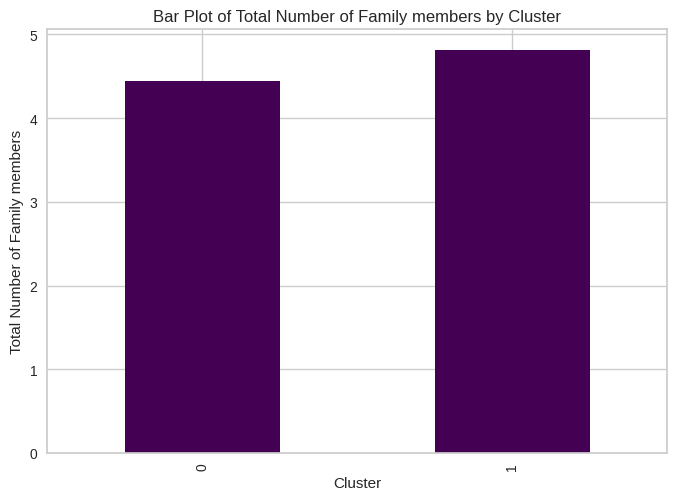

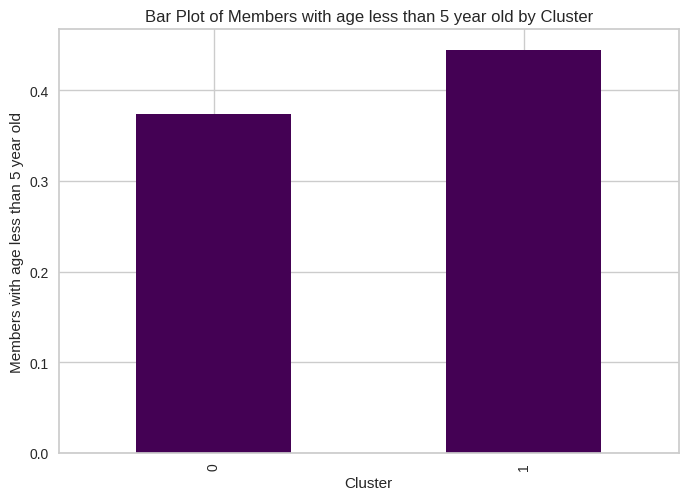

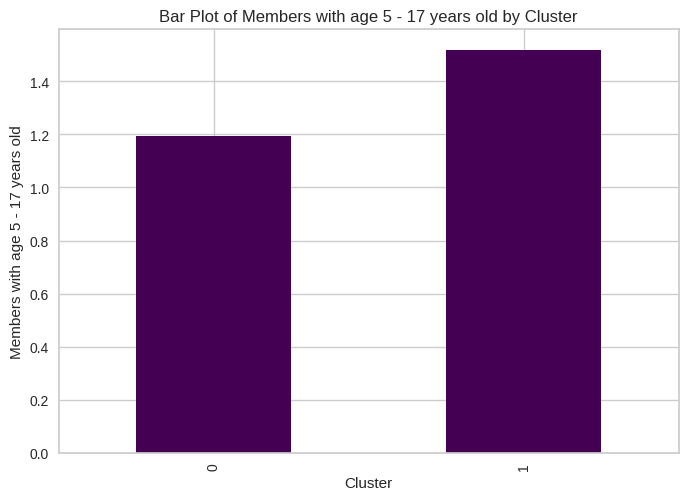

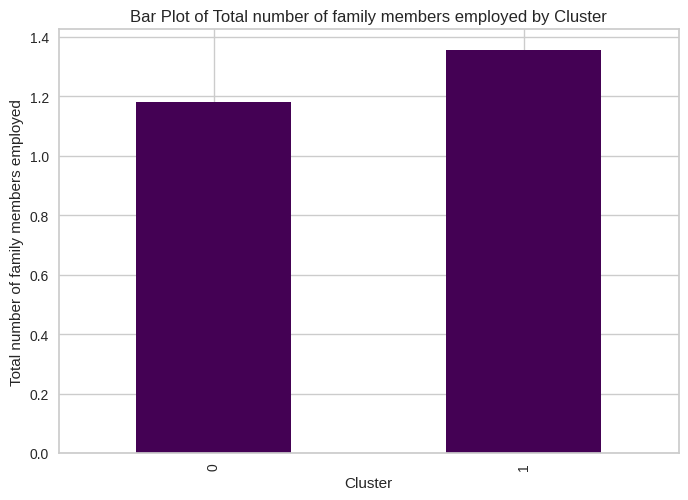

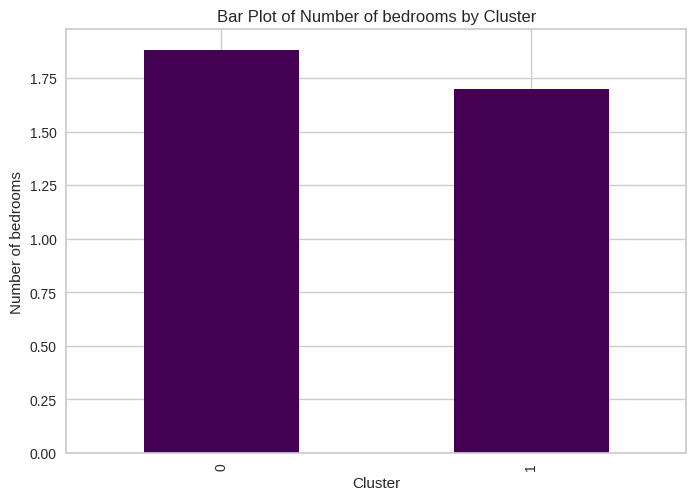

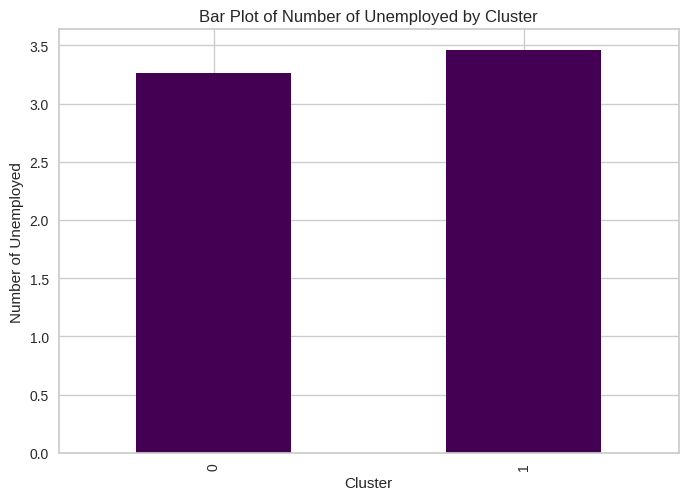

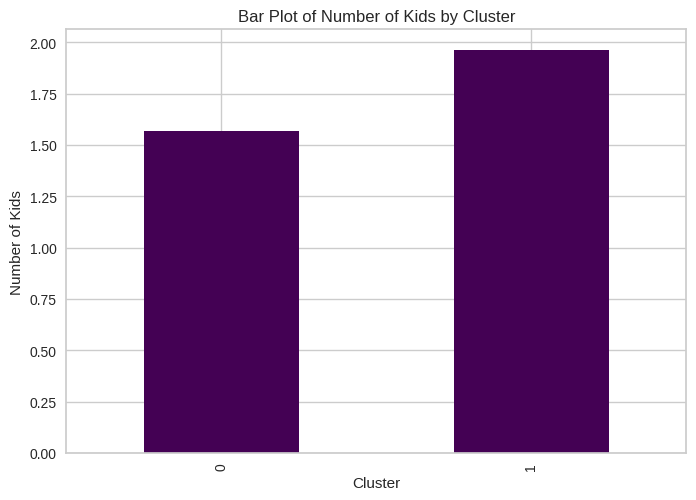

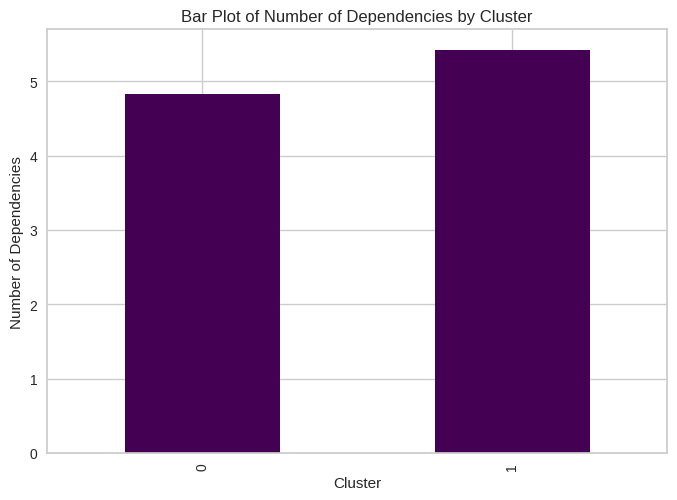

In [ ]:
# Bar Plot for family composition, based on Cluster and color coded
for column in family_size_columns:
    df.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

<Figure size 1400x800 with 0 Axes>

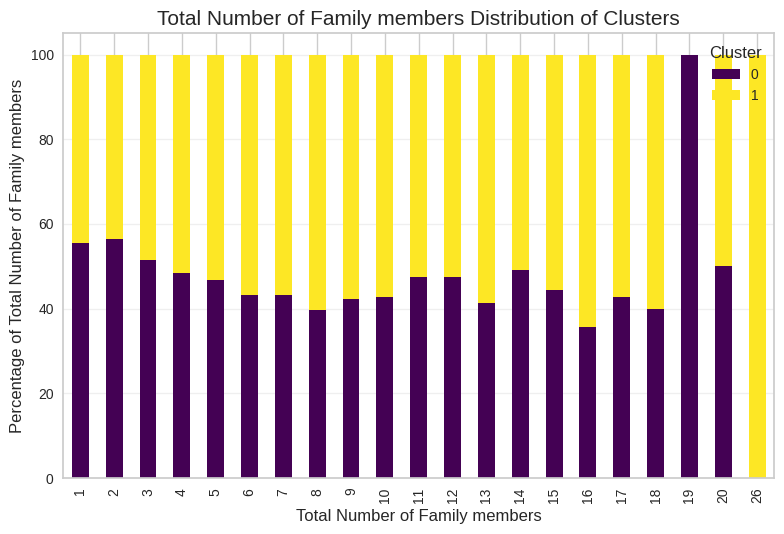

<Figure size 1400x800 with 0 Axes>

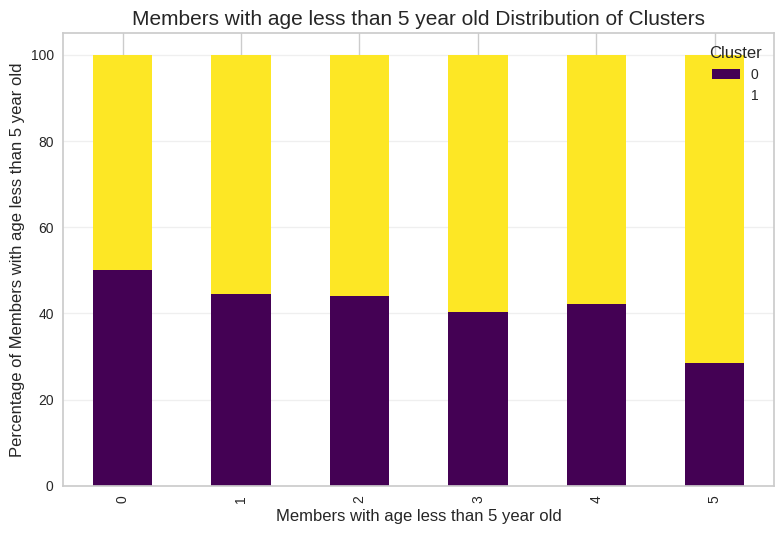

<Figure size 1400x800 with 0 Axes>

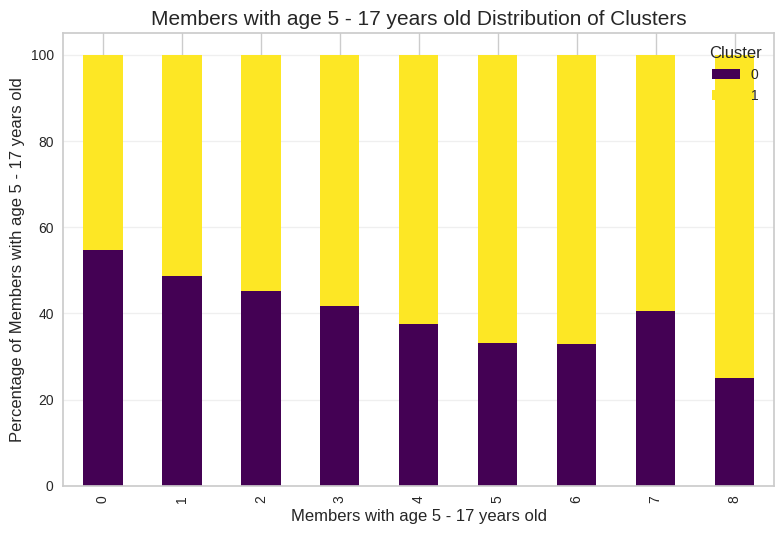

<Figure size 1400x800 with 0 Axes>

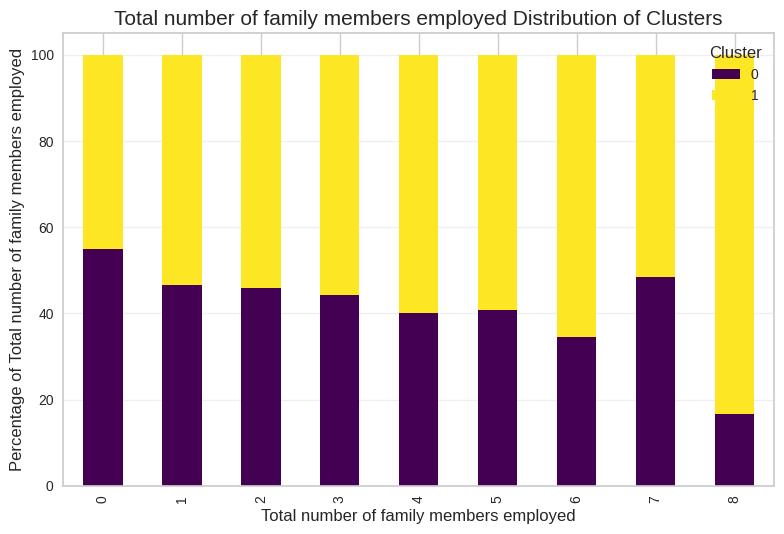

<Figure size 1400x800 with 0 Axes>

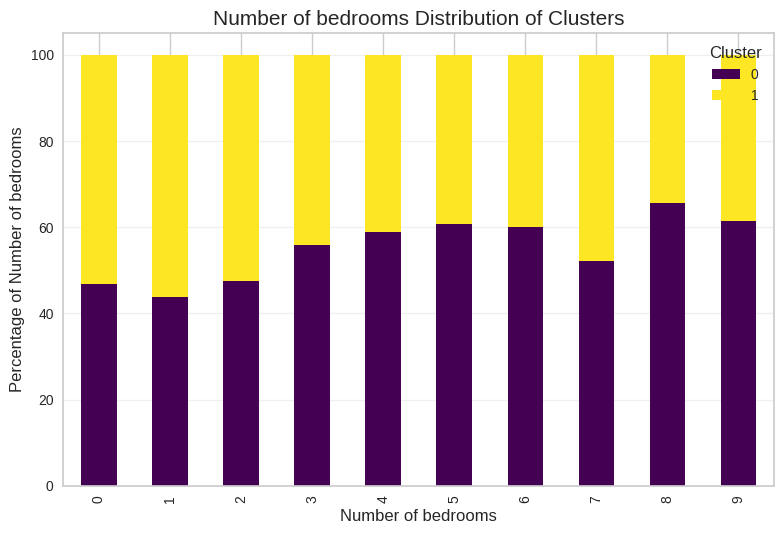

<Figure size 1400x800 with 0 Axes>

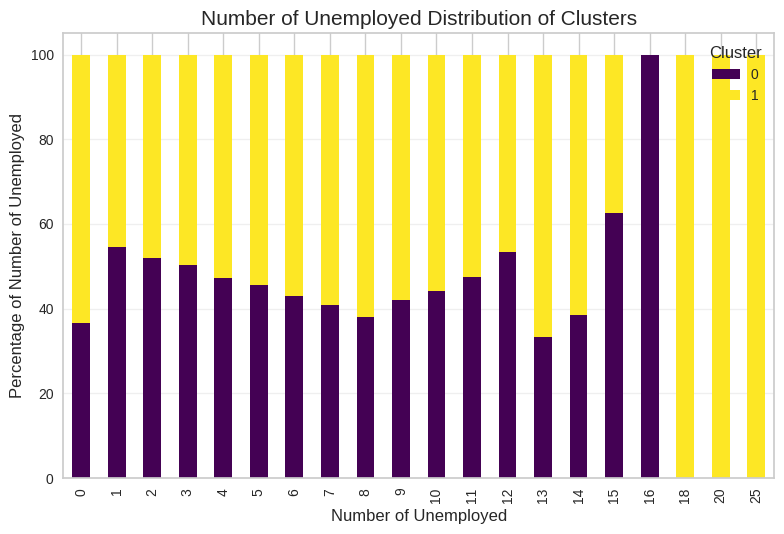

<Figure size 1400x800 with 0 Axes>

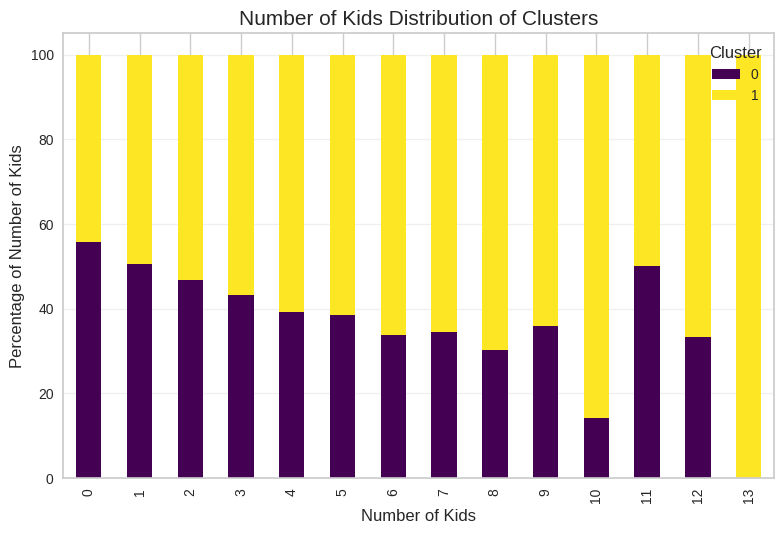

<Figure size 1400x800 with 0 Axes>

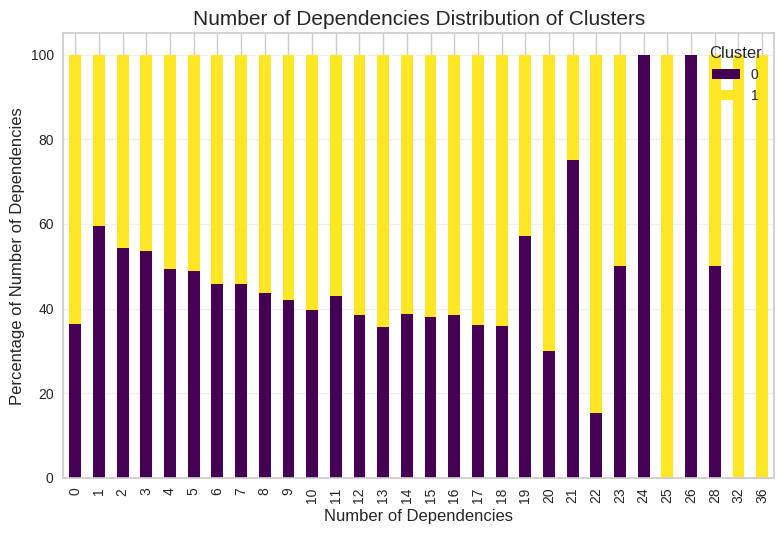

In [ ]:
for col in family_size_columns:
  region_cluster_distribution = pd.crosstab(
    df[col],
    df['Cluster'],
    normalize='index'
  ) * 100

  plt.figure(figsize=(14, 8))
  region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
  plt.title(f'{col} Distribution of Clusters', fontsize=15)
  plt.xlabel(col, fontsize=12)
  plt.ylabel(f'Percentage of {col}', fontsize=12)
  plt.legend(title='Cluster')
  plt.grid(True, alpha=0.3, axis='y')
  plt.tight_layout()
  plt.show()

<Figure size 1400x800 with 0 Axes>

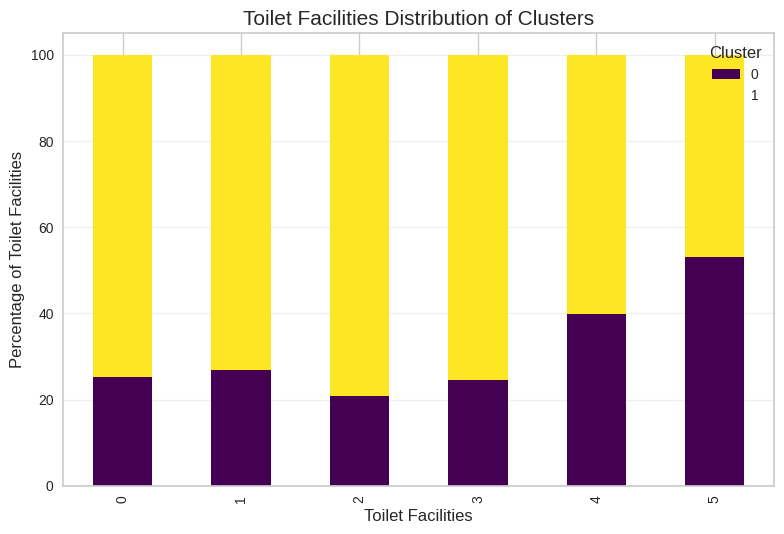

<Figure size 1400x800 with 0 Axes>

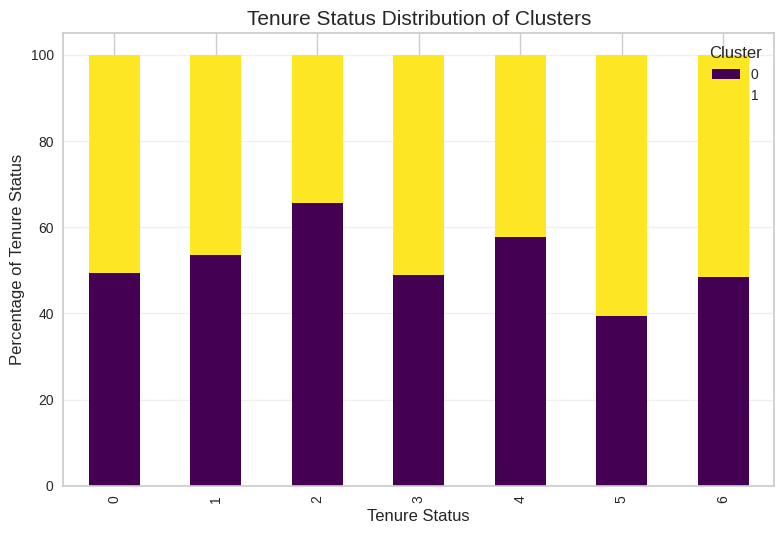

<Figure size 1400x800 with 0 Axes>

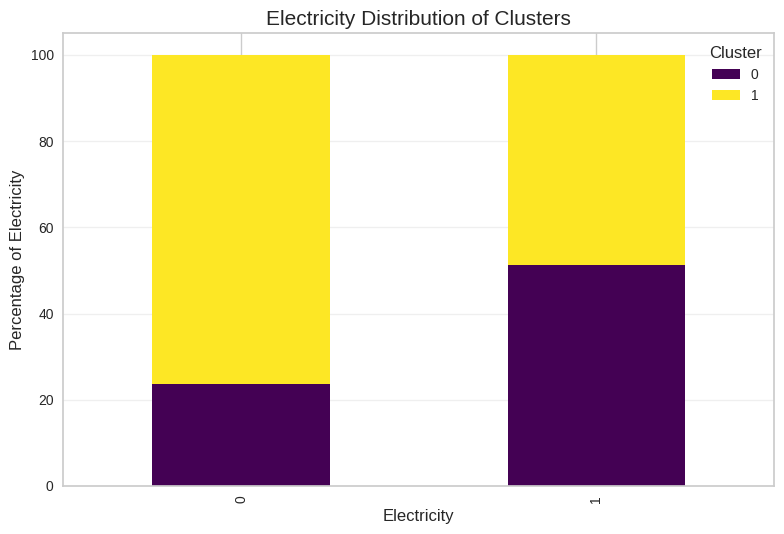

<Figure size 1400x800 with 0 Axes>

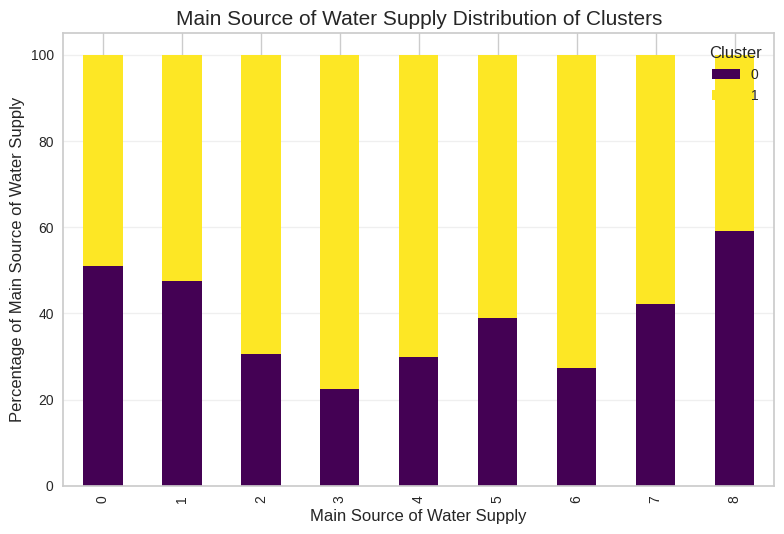

<Figure size 1400x800 with 0 Axes>

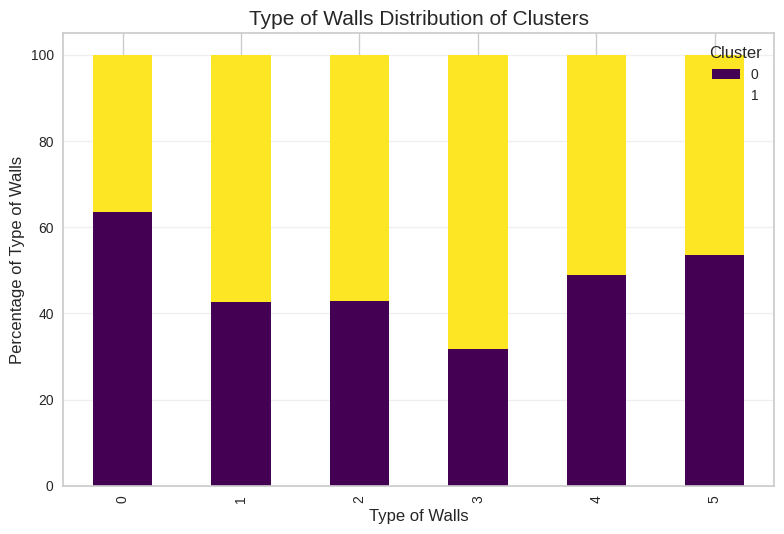

<Figure size 1400x800 with 0 Axes>

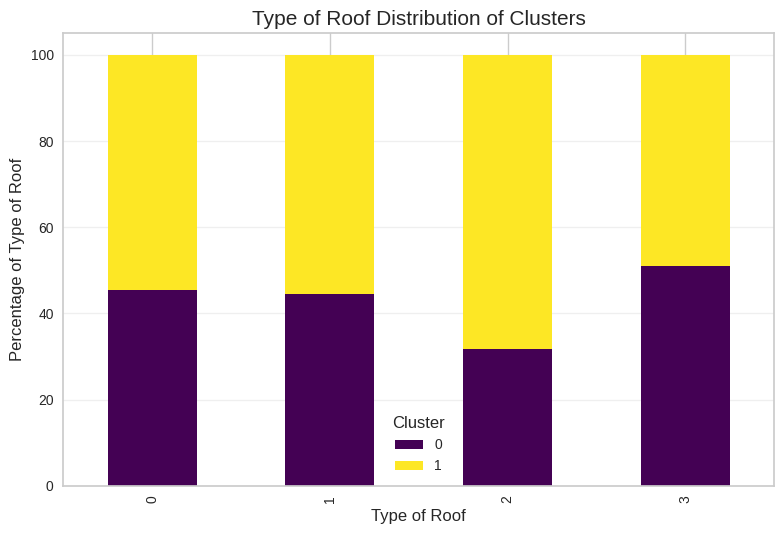

<Figure size 1400x800 with 0 Axes>

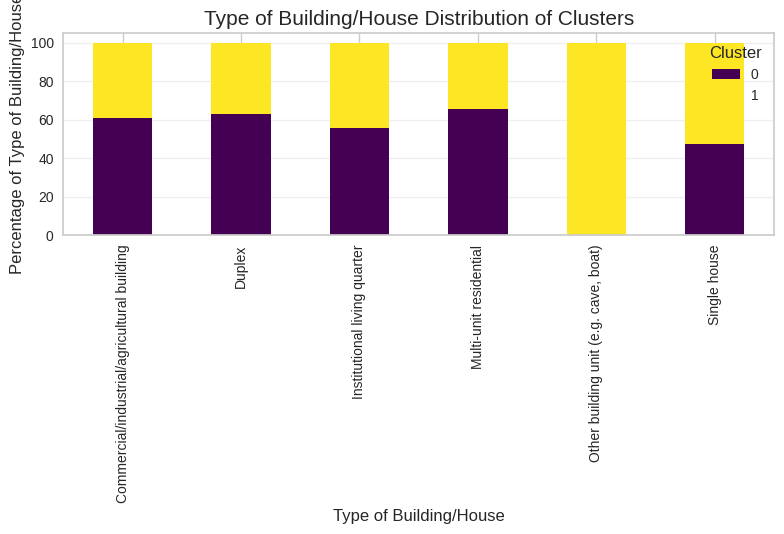

<Figure size 1400x800 with 0 Axes>

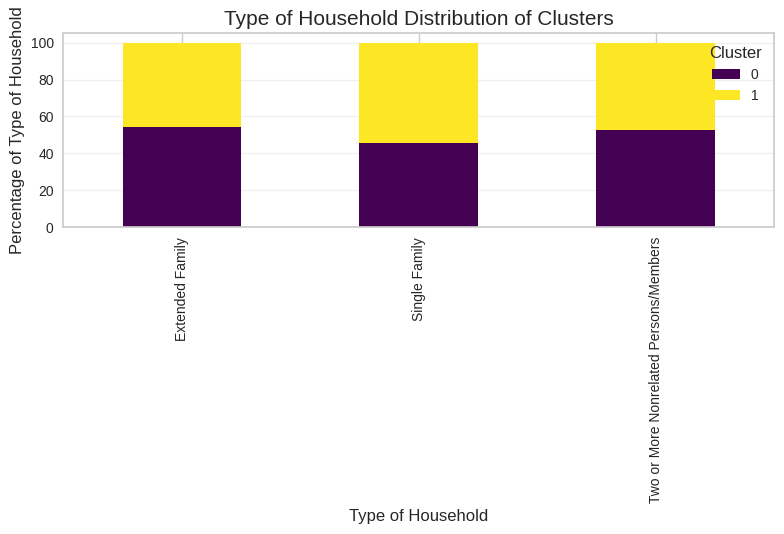

<Figure size 1400x800 with 0 Axes>

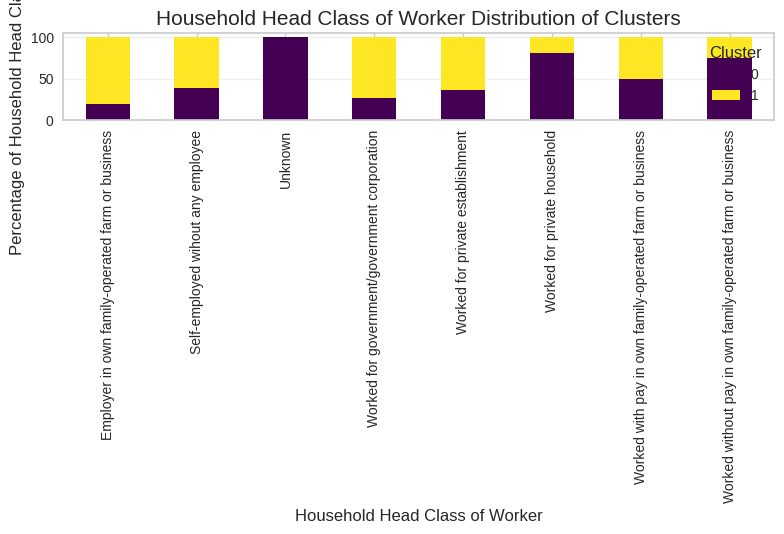

<Figure size 1400x800 with 0 Axes>

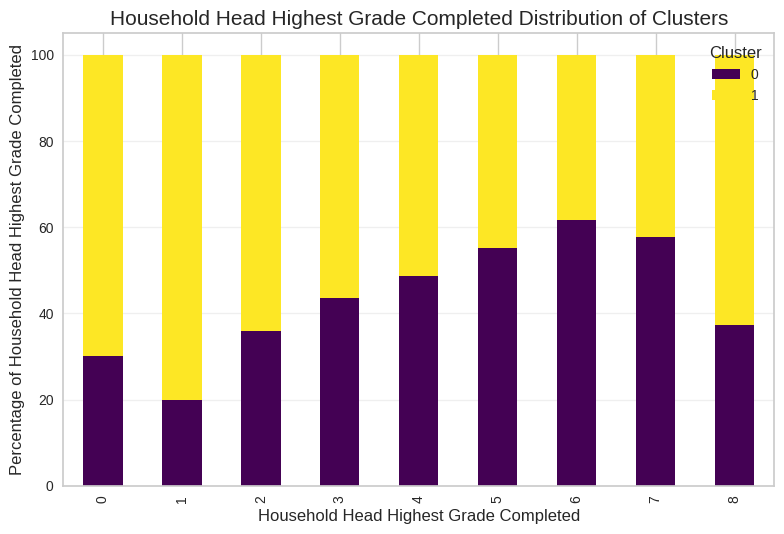

<Figure size 1400x800 with 0 Axes>

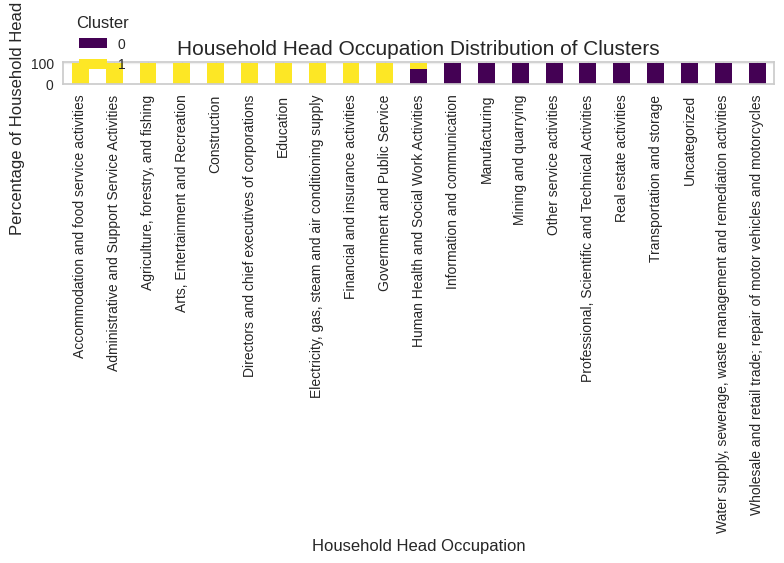

In [ ]:
for col in household_categorical_desc:
  region_cluster_distribution = pd.crosstab(
    df[col],
    df['Cluster'],
    normalize='index'
  ) * 100

  plt.figure(figsize=(14, 8))
  region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
  plt.title(f'{col} Distribution of Clusters', fontsize=15)
  plt.xlabel(col, fontsize=12)
  plt.ylabel(f'Percentage of {col}', fontsize=12)
  plt.legend(title='Cluster')
  plt.grid(True, alpha=0.3, axis='y')
  plt.tight_layout()
  plt.show()